# Professional Plot Regeneration — Wheat Yield Prediction
## Unit Conversion (maund/acre → kg/ha) + Professional Formatting

**Conversion:** 1 maund/acre = 40 kg/ha (Pakistan standard)

**What this notebook does:**
- All 7 models: XGBoost, LSTM, TCN, XGB+LSTM, TCN+XGB, LSTM+TCN, Triple Hybrid Ensemble
- Actual vs Predicted plots (7 individual + 1 comparison)
- Residual plots (7 individual + 1 comparison)
- DM Test heatmap
- Forecast plots
- Performance summary table
- All units in kg/ha, consistent colors, professional captions


In [ ]:
# ============================================================
# CELL 1 — SETUP & CONSTANTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import seaborn as sns
from matplotlib.ticker import MultipleLocator
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os
import warnings
warnings.filterwarnings('ignore')

# ── Conversion (Pakistan standard) ───────────────────────────
CONV = 40 / 0.4047      # = 98.84  (maund→kg AND acre→hectare)      # 1 maund/acre = 40 kg/ha
UNIT = 'kg/ha'

# ── Output folder saved permanently to Drive ─────────────────
OUTPUT = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'
os.makedirs(OUTPUT, exist_ok=True)

# ── District colors — consistent across ALL plots ────────────
DIST_COLORS = {
    'Khanewal': '#1f77b4',
    'Lodhran':  '#2ca02c',
    'Multan':   '#d62728',
    'Vehari':   '#9467bd'
}
DISTRICTS = ['Khanewal', 'Lodhran', 'Multan', 'Vehari']

# ── Model colors — consistent across ALL plots ───────────────
MODEL_COLORS = {
    'XGBoost':                '#ff7f0e',
    'LSTM':                   '#1f77b4',
    'TCN':                    '#2ca02c',
    'XGB+LSTM':               '#8c564b',
    'TCN+XGB':                '#e377c2',
    'LSTM+TCN':               '#7f7f7f',
    'Triple Hybrid Ensemble': '#d62728'
}
MODEL_ORDER = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid Ensemble']

# ── Fixed metric colors — same across ALL comparison plots ───
RMSE_COLOR = '#2166ac'   # blue
MAE_COLOR  = '#f4a582'   # orange
R2_COLOR   = '#4dac26'   # green

# ── Model line styles for comparison plots ───────────────────
MODEL_LINE_STYLES = {
    'XGBoost':                ':',
    'LSTM':                   '--',
    'TCN':                    '-.',
    'XGB+LSTM':               (0,(5,1)),
    'TCN+XGB':                (0,(3,1,1,1)),
    'LSTM+TCN':               (0,(3,1,1,1,1,1)),
    'Triple Hybrid Ensemble': '-'
}
MODEL_LW = {
    'XGBoost':                1.8,
    'LSTM':                   1.8,
    'TCN':                    1.8,
    'XGB+LSTM':               1.8,
    'TCN+XGB':                1.8,
    'LSTM+TCN':               1.8,
    'Triple Hybrid Ensemble': 2.8
}

# ── Typography ────────────────────────────────────────────────
plt.rcParams.update({
    'font.family':      'DejaVu Sans',
    'font.size':        11,
    'axes.titlesize':   12,
    'axes.labelsize':   11,
    'xtick.labelsize':  10,
    'ytick.labelsize':  10,
    'legend.fontsize':  9,
    'figure.dpi':       150,
    'savefig.dpi':      300,
    'savefig.bbox':     'tight',
    'axes.grid':        True,
    'grid.alpha':       0.3,
    'grid.linestyle':   '--'
})

print('Setup complete.')
print(f'Conversion: {CONV} maund/acre → kg/ha')
print(f'Output: {OUTPUT}')


Setup complete.
Conversion: 98.83864591055102 maund/acre → kg/ha
Output: /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/


In [ ]:
import subprocess
subprocess.run(['umount', '/content/drive'], capture_output=True)
import shutil
shutil.rmtree('/content/drive', ignore_errors=True)
print('Drive unmounted ✓')

Drive unmounted ✓


In [ ]:
# ============================================================
# CELL 2 — MOUNT DRIVE & LOAD ALL CSVs
# ============================================================
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

BASE          = '/content/drive/MyDrive/Colab Notebooks/'
SERWI_PATH    = BASE + 'SERWI_Results/'
FORECAST_PATH = BASE + 'Wheat_Future_Forecast/'

# ── Standalone predictions (base folder) ─────────────────────
xgb_pred  = pd.read_csv(BASE + 'XGBoost_Results_Table.csv')
lstm_pred = pd.read_csv(BASE + 'LSTM_Results_Table.csv')
tcn_pred  = pd.read_csv(BASE + 'TCN_Results_Table.csv')

# ── Hybrid predictions (SERWI_Results folder) ────────────────
xgblstm_pred = pd.read_csv(SERWI_PATH + 'SERWI_XGB_LSTM_Results_Table.csv')
tcnxgb_pred  = pd.read_csv(SERWI_PATH + 'SERWI_TCN_XGB_Results_Table.csv')
lstmtcn_pred = pd.read_csv(SERWI_PATH + 'SERWI_LSTM_TCN_Results_Table.csv')
triple_pred  = pd.read_csv(SERWI_PATH + 'SERWI_Triple_Results_Table.csv')

# ── Forecast CSVs (Wheat_Future_Forecast folder) ─────────────
forecast_scenA = pd.read_csv(FORECAST_PATH + 'Forecast_ScenarioA_Primary.csv')
forecast_all   = pd.read_csv(FORECAST_PATH + 'Forecast_ALL_Scenarios.csv')
full_timeline  = pd.read_csv(FORECAST_PATH + 'Full_Timeline_2001_2030_ScenarioA.csv')
merged_df      = pd.read_csv(FORECAST_PATH + 'Merged_Wheat_Multan_Final.csv')

# ── DM Test (SERWI_Results folder) ───────────────────────────
dm_results = pd.read_csv(SERWI_PATH + 'DM_Test_Results.csv')

print('All CSVs loaded ✓')
print('XGBoost columns:', xgb_pred.columns.tolist())
print('Triple columns:', triple_pred.columns.tolist())
print('Forecast columns:', forecast_scenA.columns.tolist())
print('DM columns:', dm_results.columns.tolist())


Mounted at /content/drive
All CSVs loaded ✓
XGBoost columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Triple columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Forecast columns: ['Year', 'District', 'XGB', 'LSTM', 'TCN', 'SERWI_XGB_LSTM', 'SERWI_TCN_XGB', 'SERWI_LSTM_TCN', 'SERWI_Triple', 'Scenario']
DM columns: ['Benchmark', 'Challenger', 'DM_Statistic', 'p_value', 'Significant', 'Better_Model']


In [ ]:
print(forecast_scenA[forecast_scenA.Year==2026][['District','SERWI_Triple']])

   District  SERWI_Triple
0  Khanewal        40.007
1   Lodhran        43.014
2    Multan        38.916
3    Vehari        40.658


In [ ]:
# ============================================================
# CELL 3 — CONVERT maund/acre TO kg/ha (×40)
# ============================================================

PRED_COLS = ['Actual', 'Predicted', 'Error', 'Residual']

# All 7 prediction dataframes
for df in [xgb_pred, lstm_pred, tcn_pred,
           xgblstm_pred, tcnxgb_pred, lstmtcn_pred, triple_pred]:
    for col in PRED_COLS:
        if col in df.columns:
            df[col] = df[col] * CONV

# Forecast CSVs
FORECAST_YIELD_COLS = ['XGB','LSTM','TCN',
                       'SERWI_XGB_LSTM','SERWI_TCN_XGB',
                       'SERWI_LSTM_TCN','SERWI_Triple']
for col in FORECAST_YIELD_COLS:
    if col in forecast_scenA.columns:
        forecast_scenA[col] = forecast_scenA[col] * CONV
    if col in forecast_all.columns:
        forecast_all[col]   = forecast_all[col] * CONV

# Full timeline & merged dataset
if 'Yield_maund_acre' in full_timeline.columns:
    full_timeline['Yield_kg_ha'] = full_timeline['Yield_maund_acre'] * CONV
if 'Yield_maund_acre' in merged_df.columns:
    merged_df['Yield_kg_ha'] = merged_df['Yield_maund_acre'] * CONV

# ── Verify ────────────────────────────────────────────────────
print('=== Conversion Verification (should be ~1200–1700 kg/ha) ===')
print(f'XGBoost  Actual mean : {xgb_pred["Actual"].mean():.1f} kg/ha')
print(f'LSTM     Actual mean : {lstm_pred["Actual"].mean():.1f} kg/ha')
print(f'TCN      Actual mean : {tcn_pred["Actual"].mean():.1f} kg/ha')
print(f'Triple   Actual mean : {triple_pred["Actual"].mean():.1f} kg/ha')
print(f'Forecast Triple sample: {forecast_scenA["SERWI_Triple"].head(3).round(1).tolist()}')
print('\nConversion complete ✓')


=== Conversion Verification (should be ~1200–1700 kg/ha) ===
XGBoost  Actual mean : 3738.9 kg/ha
LSTM     Actual mean : 3738.9 kg/ha
TCN      Actual mean : 3738.9 kg/ha
Triple   Actual mean : 3738.9 kg/ha
Forecast Triple sample: [3954.2, 4251.4, 3846.4]

Conversion complete ✓


In [ ]:
# ============================================================
# CELL 4 — HELPER FUNCTIONS
# ============================================================

def compute_metrics(df):
    r2   = r2_score(df['Actual'], df['Predicted'])
    rmse = np.sqrt(mean_squared_error(df['Actual'], df['Predicted']))
    mae  = mean_absolute_error(df['Actual'], df['Predicted'])
    return r2, rmse, mae

def save_fig(fig, name, caption=None):
    path = OUTPUT + name + '.png'
    fig.savefig(path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    if caption:
        print(f'Caption: {caption}')
    print(f'Saved → {path}')
    plt.close()

# ── All 7 models list (used across cells) ────────────────────
# Populated after Cell 3 runs
print('Helper functions ready ✓')


Helper functions ready ✓


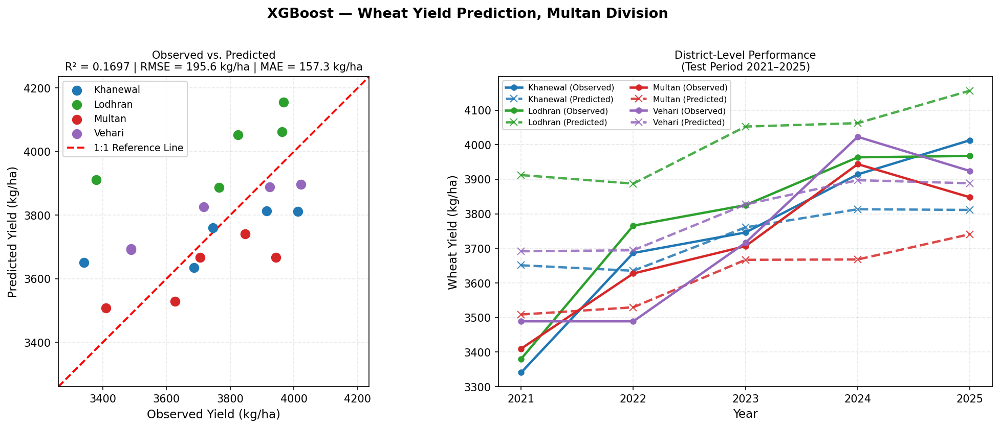

Caption: Figure. Observed vs. predicted wheat yield for the XGBoost model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.1697, RMSE = 195.6 kg/ha, MAE = 157.3 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_XGBoost.png
✓ XGBoost


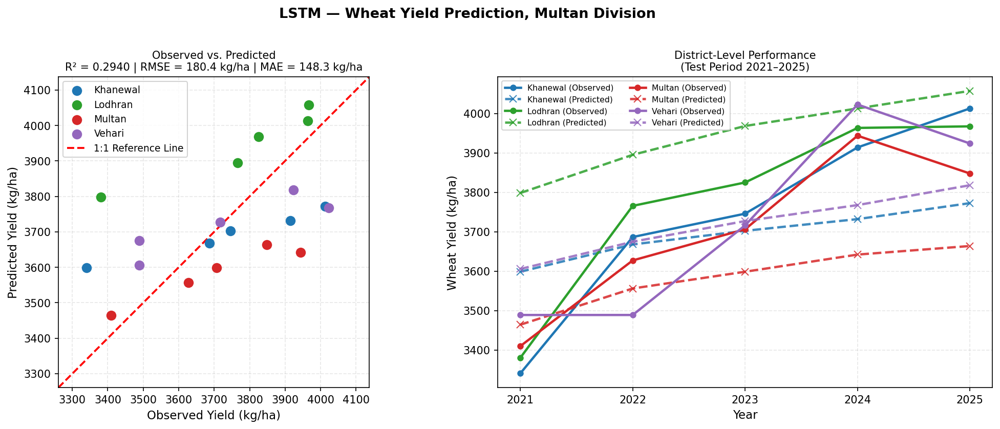

Caption: Figure. Observed vs. predicted wheat yield for the LSTM model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.2940, RMSE = 180.4 kg/ha, MAE = 148.3 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_LSTM.png
✓ LSTM


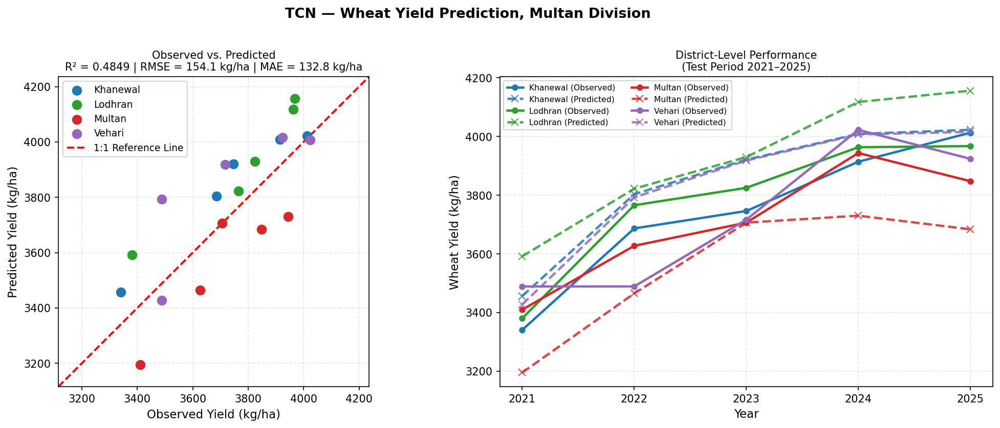

Caption: Figure. Observed vs. predicted wheat yield for the TCN model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.4849, RMSE = 154.1 kg/ha, MAE = 132.8 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_TCN.png
✓ TCN


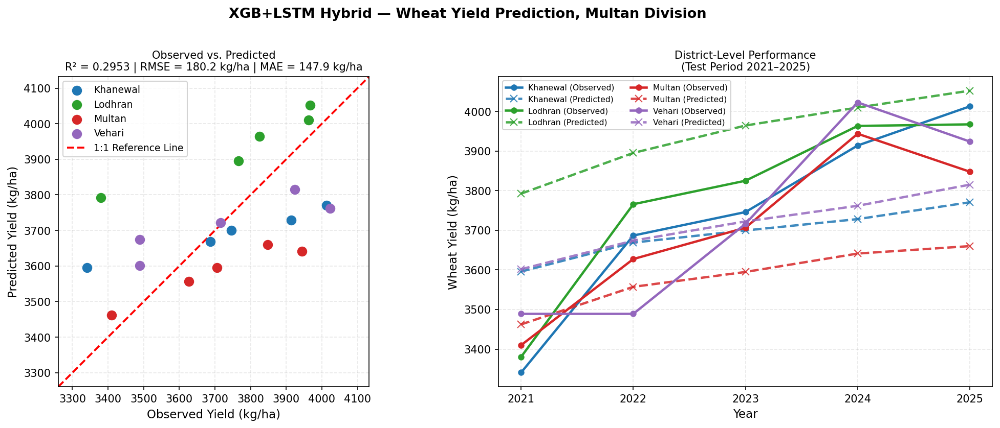

Caption: Figure. Observed vs. predicted wheat yield for the XGB+LSTM Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.2953, RMSE = 180.2 kg/ha, MAE = 147.9 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_XGB_LSTM.png
✓ XGB+LSTM Hybrid


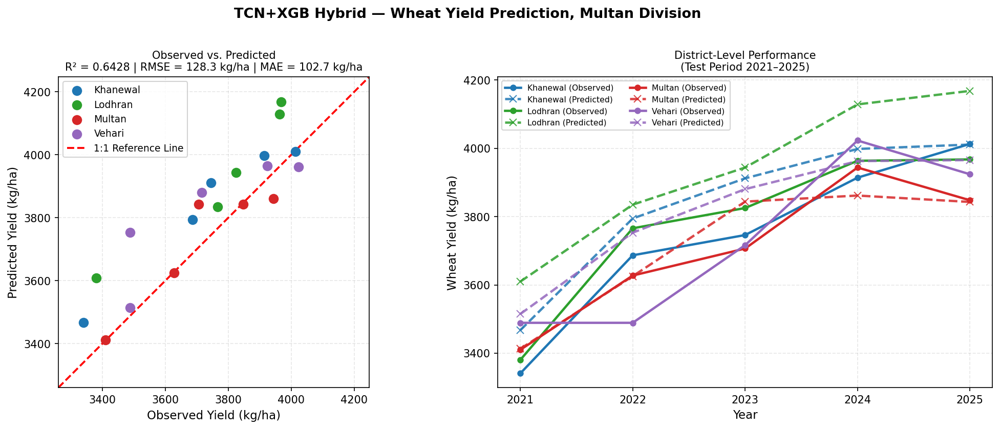

Caption: Figure. Observed vs. predicted wheat yield for the TCN+XGB Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6428, RMSE = 128.3 kg/ha, MAE = 102.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_TCN_XGB.png
✓ TCN+XGB Hybrid


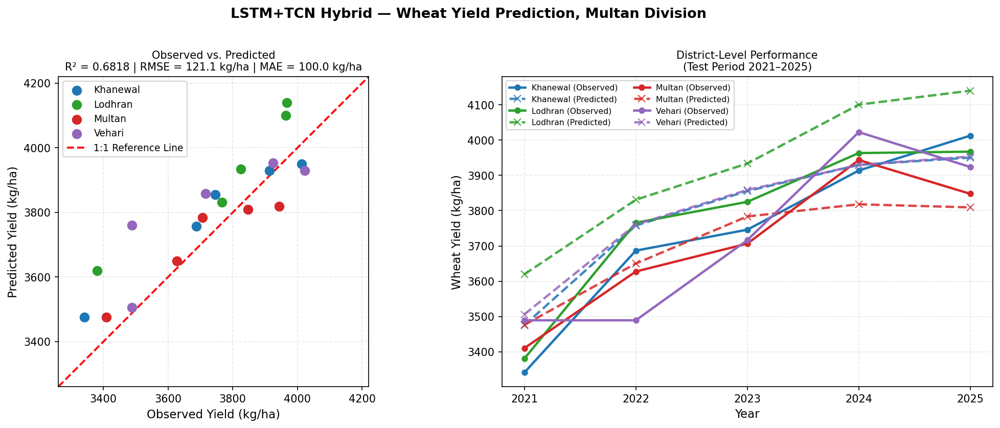

Caption: Figure. Observed vs. predicted wheat yield for the LSTM+TCN Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6818, RMSE = 121.1 kg/ha, MAE = 100.0 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_LSTM_TCN.png
✓ LSTM+TCN Hybrid


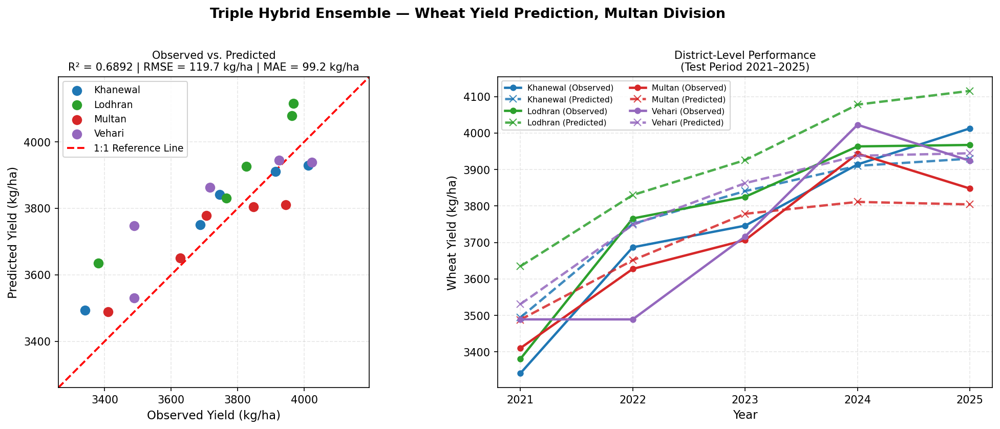

Caption: Figure. Observed vs. predicted wheat yield for the Triple Hybrid Ensemble model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6892, RMSE = 119.7 kg/ha, MAE = 99.2 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_Triple.png
✓ Triple Hybrid Ensemble


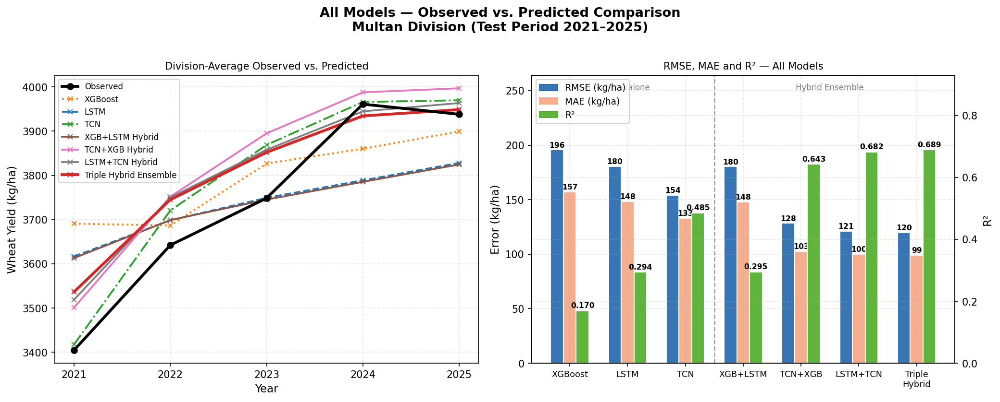

Caption: Figure. Performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green). Dashed line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison.png
✓ All-models comparison saved

Cell 5 complete ✓


In [ ]:
# ============================================================
# CELL 5 — ACTUAL vs PREDICTED (7 Individual + 1 Comparison)
# ============================================================

def plot_actual_vs_predicted(df, model_name, save_name):
    r2, rmse, mae = compute_metrics(df)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
    fig.suptitle(
        f'{model_name} — Wheat Yield Prediction, Multan Division',
        fontsize=13, fontweight='bold', y=1.01
    )

    # ── Left: Scatter ─────────────────────────────────────────
    ax1 = axes[0]
    for dist in DISTRICTS:
        sub = df[df['District']==dist]
        ax1.scatter(sub['Actual'], sub['Predicted'],
                    color=DIST_COLORS[dist], s=70, zorder=3, label=dist)
    lim_min = df[['Actual','Predicted']].min().min() - 80
    lim_max = df[['Actual','Predicted']].max().max() + 80
    ax1.plot([lim_min,lim_max],[lim_min,lim_max],
             'r--', lw=1.8, label='1:1 Reference Line')
    ax1.set_xlim(lim_min, lim_max)
    ax1.set_ylim(lim_min, lim_max)
    ax1.set_xlabel(f'Observed Yield ({UNIT})')
    ax1.set_ylabel(f'Predicted Yield ({UNIT})')
    ax1.set_title(
        f'Observed vs. Predicted\n'
        f'R² = {r2:.4f} | RMSE = {rmse:.1f} {UNIT} | MAE = {mae:.1f} {UNIT}',
        fontsize=10)
    ax1.legend(fontsize=9, framealpha=0.85, loc='upper left')
    ax1.set_aspect('equal')

    # ── Right: Time series ────────────────────────────────────
    ax2 = axes[1]
    years = sorted(df['Year'].unique())
    for dist in DISTRICTS:
        sub = df[df['District']==dist].sort_values('Year')
        c = DIST_COLORS[dist]
        ax2.plot(sub['Year'], sub['Actual'],
                 color=c, lw=2.2, marker='o', ms=5)
        ax2.plot(sub['Year'], sub['Predicted'],
                 color=c, lw=2.2, marker='x', ms=7,
                 linestyle='--', alpha=0.85)

    handles = []
    for dist in DISTRICTS:
        handles.append(mlines.Line2D([],[],color=DIST_COLORS[dist],
                       lw=2.2,marker='o',ms=5,label=f'{dist} (Observed)'))
        handles.append(mlines.Line2D([],[],color=DIST_COLORS[dist],
                       lw=2.2,marker='x',ms=7,linestyle='--',
                       alpha=0.85,label=f'{dist} (Predicted)'))
    ax2.legend(handles=handles, fontsize=7.5, ncol=2,
               framealpha=0.85, loc='upper left')
    ax2.set_xlabel('Year')
    ax2.set_ylabel(f'Wheat Yield ({UNIT})')
    ax2.set_title('District-Level Performance\n(Test Period 2021–2025)', fontsize=10)
    ax2.set_xticks(years)

    plt.tight_layout()
    caption = (f'Figure. Observed vs. predicted wheat yield for the {model_name} model '
               f'across Multan Division (test period: 2021–2025). '
               f'Left: scatter plot with 1:1 reference line. '
               f'Right: district-level temporal comparison. '
               f'R² = {r2:.4f}, RMSE = {rmse:.1f} {UNIT}, MAE = {mae:.1f} {UNIT}.')
    save_fig(fig, save_name, caption)

# ── All 7 models ──────────────────────────────────────────────
all_models = [
    (xgb_pred,     'XGBoost',                'Fig_ActPred_XGBoost'),
    (lstm_pred,    'LSTM',                   'Fig_ActPred_LSTM'),
    (tcn_pred,     'TCN',                    'Fig_ActPred_TCN'),
    (xgblstm_pred, 'XGB+LSTM Hybrid',        'Fig_ActPred_XGB_LSTM'),
    (tcnxgb_pred,  'TCN+XGB Hybrid',         'Fig_ActPred_TCN_XGB'),
    (lstmtcn_pred, 'LSTM+TCN Hybrid',        'Fig_ActPred_LSTM_TCN'),
    (triple_pred,  'Triple Hybrid Ensemble', 'Fig_ActPred_Triple'),
]

for df, name, fname in all_models:
    plot_actual_vs_predicted(df, name, fname)
    print(f'✓ {name}')

# ── 8th Plot: All-Models Comparison ──────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'All Models — Observed vs. Predicted Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# Left: Division-average line plot
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    short = name.replace(' Hybrid','').replace(' Ensemble','')
    avg_pred = df.groupby('Year')['Predicted'].mean()
    ax1.plot(avg_pred.index, avg_pred.values,
             color=MODEL_COLORS[short] if short in MODEL_COLORS else MODEL_COLORS.get(name, '#333333'),
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=10)
ax1.legend(fontsize=8, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# Right: R², RMSE, MAE grouped bars
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
colors_bar  = [MODEL_COLORS[n.replace('\n',' ')] if n.replace('\n',' ') in MODEL_COLORS
               else list(MODEL_COLORS.values())[i]
               for i,n in enumerate(short_names)]
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
w = 0.22
b_rmse = ax2.bar(x - w, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b_mae  = ax2.bar(x,     mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
b_r2   = ax2b.bar(x+w,  r2_vals,  w, color=R2_COLOR,   edgecolor='white', alpha=0.9, label='R²')

for bar, val in zip(b_rmse, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
             f'{val:.0f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')
for bar, val in zip(b_mae, mae_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
             f'{val:.0f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
              f'{val:.3f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')

ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2b.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.35)
ax2b.set_ylim(0, max(r2_vals)*1.35)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=8.5)
ax2.set_title('RMSE, MAE and R² — All Models', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0,  max(rmse_vals)*1.28, 'Standalone', ha='center', fontsize=8, color='gray')
ax2.text(4.5, max(rmse_vals)*1.28, 'Hybrid Ensemble', ha='center', fontsize=8, color='gray')
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=9, framealpha=0.85, loc='upper left')

plt.tight_layout()
caption = ('Figure. Performance comparison of all seven models (test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield. '
           'Right: RMSE (blue), MAE (orange), and R² (green). '
           'Dashed line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison', caption)
print('✓ All-models comparison saved')
print('\nCell 5 complete ✓')


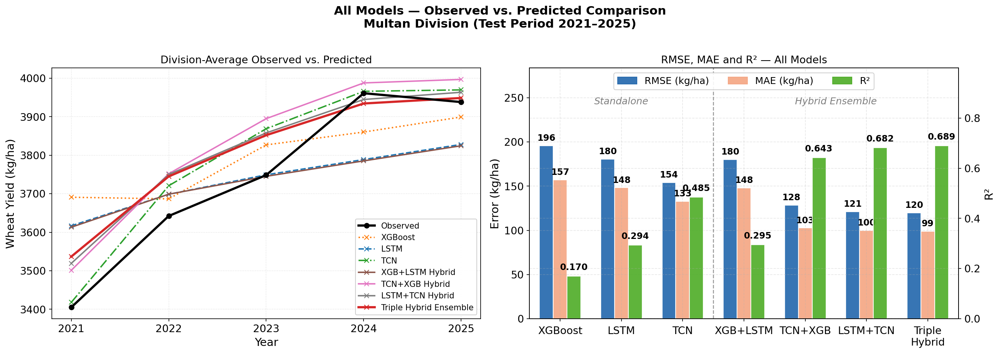

Caption: Figure. Performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green). Dashed line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparisonn2.png
✓ All-models comparison saved

Cell 5 complete ✓


In [ ]:
# ── 8th Plot: All-Models Comparison ──────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(17.5, 6))
fig.suptitle(
    'All Models — Observed vs. Predicted Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=15, fontweight='bold', y=1.02
)

# Left: Division-average line plot
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    short = name.replace(' Hybrid','').replace(' Ensemble','')
    avg_pred = df.groupby('Year')['Predicted'].mean()
    ax1.plot(avg_pred.index, avg_pred.values,
             color=MODEL_COLORS[short] if short in MODEL_COLORS else MODEL_COLORS.get(name, '#333333'),
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=6, label=name)
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=14)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=13)
ax1.tick_params(axis='both', labelsize=13)
ax1.legend(fontsize=10, framealpha=0.92, loc='lower right')   # legend OFF the lines
ax1.set_xticks(years)
ax1.grid(True, ls=':', alpha=0.4)

# Right: R², RMSE, MAE grouped bars
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

SP = 1.6                               # wider spacing so the 13-pt names have gaps
x  = np.arange(len(short_names)) * SP
w  = 0.36
b_rmse = ax2.bar(x - w, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9)
b_mae  = ax2.bar(x,     mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9)
b_r2   = ax2b.bar(x + w, r2_vals,  w, color=R2_COLOR,   edgecolor='white', alpha=0.9)

# headroom so labels + legend never touch the bars
ax2.set_ylim(0,  max(rmse_vals) * 1.45)
ax2b.set_ylim(0, max(r2_vals)   * 1.45)

# value labels — one uniform style for ALL bars (size matched to Cell 5D)
LBL = dict(ha='center', va='bottom', fontsize=11, fontweight='bold', color='black')
off_e = max(rmse_vals) * 0.018
for bars, vals in [(b_rmse, rmse_vals), (b_mae, mae_vals)]:
    for bar, val in zip(bars, vals):
        ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+off_e, f'{val:.0f}', **LBL)
off_r = max(r2_vals) * 0.025
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x()+bar.get_width()/2, bar.get_height()+off_r, f'{val:.3f}', **LBL)

ax2.set_ylabel(f'Error ({UNIT})', fontsize=14)
ax2b.set_ylabel('R²', fontsize=14)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=13)
ax2.tick_params(axis='x', pad=6)
ax2.tick_params(axis='y', labelsize=13)
ax2b.tick_params(axis='y', labelsize=13)
ax2.set_title('RMSE, MAE and R² — All Models', fontsize=13)
ax2.set_xlim(-0.8, x[-1] + 0.8)

# standalone / hybrid divider + labels
ax2.axvline(2.5 * SP, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0 * SP, max(rmse_vals)*1.24, 'Standalone', ha='center',
         fontsize=12, color='gray', style='italic')
ax2.text(4.5 * SP, max(rmse_vals)*1.24, 'Hybrid Ensemble', ha='center',
         fontsize=12, color='gray', style='italic')

# metric legend across the top — horizontal, clear of the bars
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=12, framealpha=0.9,
           loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.0))

plt.tight_layout()
caption = ('Figure. Performance comparison of all seven models (test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield. '
           'Right: RMSE (blue), MAE (orange), and R² (green). '
           'Dashed line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparisonn2', caption)   # ← rename here for a new filename
print('✓ All-models comparison saved')
print('\nCell 5 complete ✓')

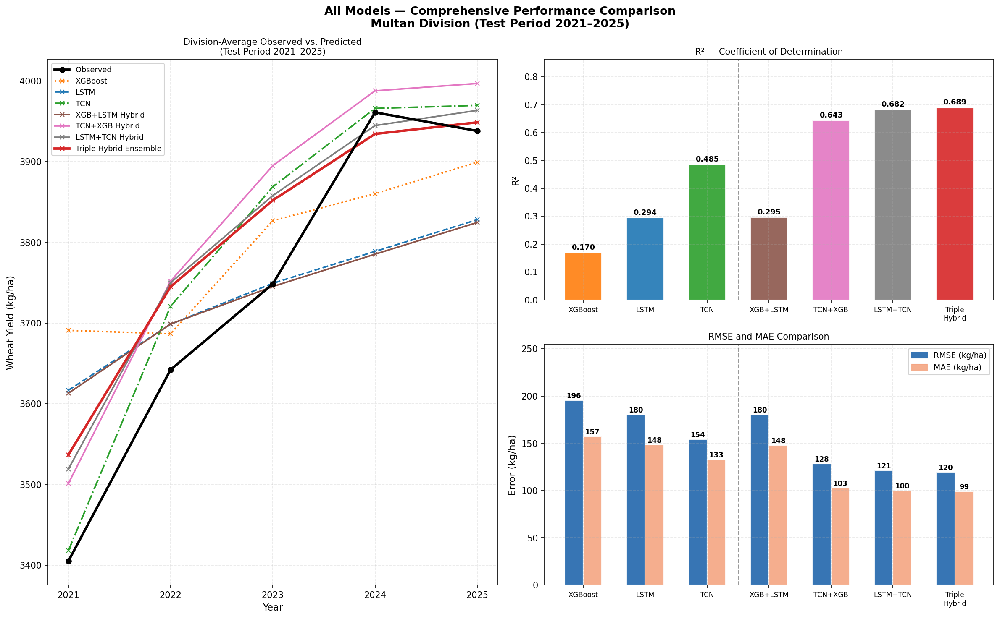

Caption: Figure. Comprehensive performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield trajectories. Top right: R² comparison. Bottom right: RMSE and MAE comparison. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison_3panel.png
✓ 3-panel comparison saved


In [ ]:
# ============================================================
# CELL 5B — ALTERNATIVE COMPARISON PLOT (3-panel layout)
# ============================================================

fig = plt.figure(figsize=(16, 10))
ax1  = fig.add_subplot(1, 2, 1)
ax2  = fig.add_subplot(2, 2, 2)
ax3  = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold'
)

# Left: Division-average line plot
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Observed vs. Predicted\n(Test Period 2021–2025)', fontsize=10)
ax1.legend(fontsize=8.5, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# Top right: R²
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, r2_vals, 0.6, color=bar_colors, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, r2_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
             f'{val:.3f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax2.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(r2_vals)*1.25)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8)
ax2.set_title('R² — Coefficient of Determination', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: RMSE & MAE
w = 0.3
b1 = ax3.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax3.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
ax3.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax3.set_ylim(0, max(rmse_vals)*1.3)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=8)
ax3.set_title(f'RMSE and MAE Comparison', fontsize=10)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax3.legend(handles=[rmse_p, mae_p], fontsize=9, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Comprehensive performance comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield trajectories. '
           'Top right: R² comparison. Bottom right: RMSE and MAE comparison. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison_3panel', caption)
print('✓ 3-panel comparison saved')


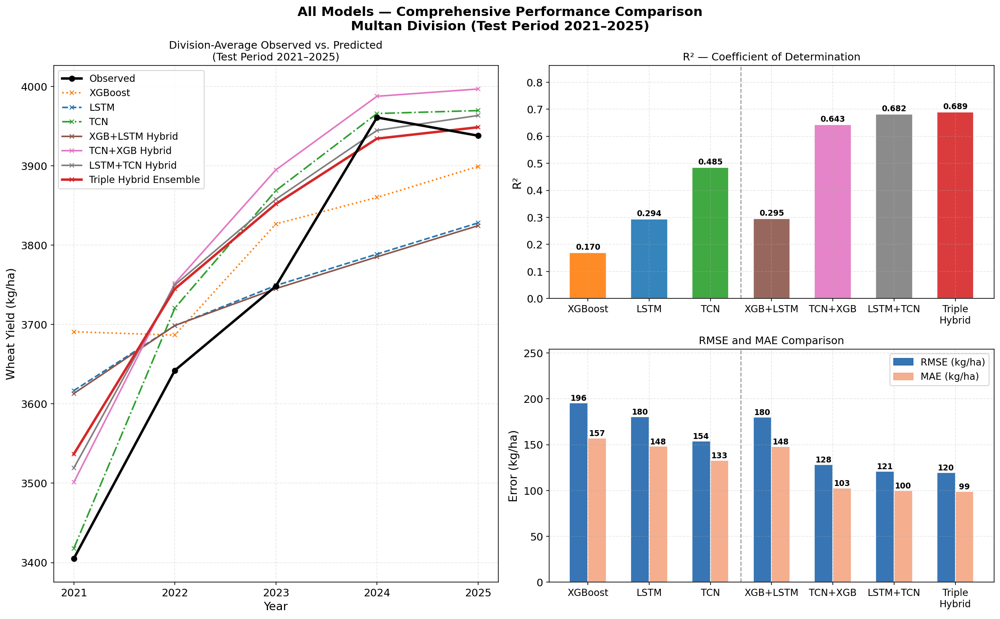

Caption: Figure. Comprehensive performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield trajectories. Top right: R² comparison. Bottom right: RMSE and MAE comparison. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison_3panell.png
✓ 3-panel comparison saved


In [ ]:
# ============================================================
# CELL 5B — ALTERNATIVE COMPARISON PLOT (3-panel layout)
# ============================================================

fig = plt.figure(figsize=(16, 10))
ax1  = fig.add_subplot(1, 2, 1)
ax2  = fig.add_subplot(2, 2, 2)
ax3  = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=15, fontweight='bold'
)

# Left: Division-average line plot
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=13)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=13)
ax1.set_title('Division-Average Observed vs. Predicted\n(Test Period 2021–2025)', fontsize=12)
ax1.legend(fontsize=11, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)
ax1.tick_params(axis='both', labelsize=12)

# Top right: R²
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, r2_vals, 0.6, color=bar_colors, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, r2_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
             f'{val:.3f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
ax2.set_ylabel('R²', fontsize=13)
ax2.set_ylim(0, max(r2_vals)*1.25)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=11)
ax2.tick_params(axis='y', labelsize=12)
ax2.set_title('R² — Coefficient of Determination', fontsize=12)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: RMSE & MAE
w = 0.3
b1 = ax3.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax3.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=9, fontweight='bold')
ax3.set_ylabel(f'Error ({UNIT})', fontsize=13)
ax3.set_ylim(0, max(rmse_vals)*1.3)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=11)
ax3.tick_params(axis='y', labelsize=12)
ax3.set_title('RMSE and MAE Comparison', fontsize=12)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax3.legend(handles=[rmse_p, mae_p], fontsize=11, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Comprehensive performance comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield trajectories. '
           'Top right: R² comparison. Bottom right: RMSE and MAE comparison. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison_3panell', caption)
print('✓ 3-panel comparison saved')

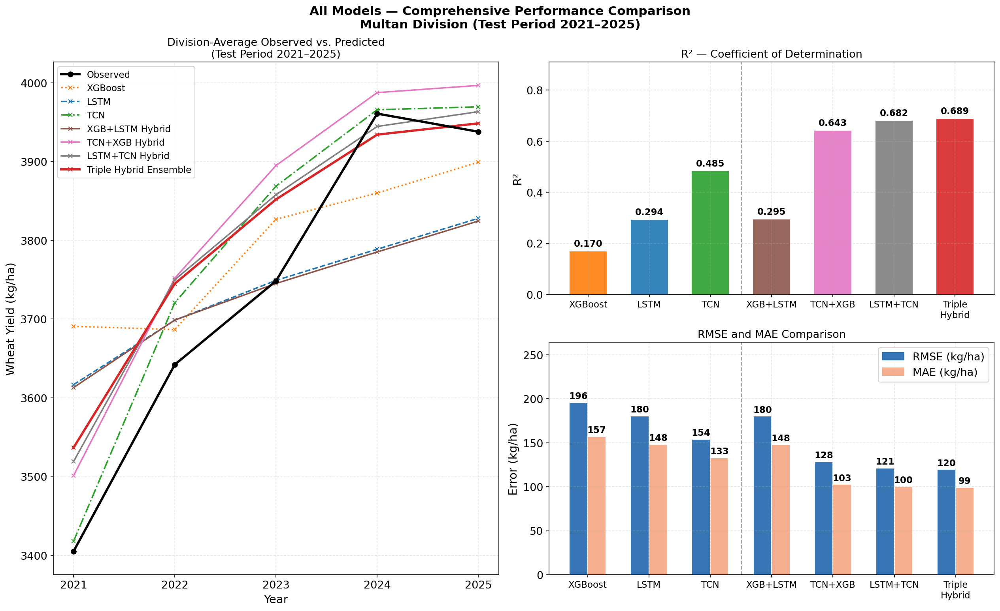

Caption: Figure. Comprehensive performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield trajectories. Top right: R² comparison. Bottom right: RMSE and MAE comparison. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison_3panelll.png
✓ 3-panel comparison saved


In [ ]:
# ============================================================
# CELL 5B — ALTERNATIVE COMPARISON PLOT (3-panel layout)
# ============================================================

fig = plt.figure(figsize=(17, 10.5))
ax1  = fig.add_subplot(1, 2, 1)
ax2  = fig.add_subplot(2, 2, 2)
ax3  = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=15, fontweight='bold'
)

# Left: Division-average line plot
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=14)
ax1.set_title('Division-Average Observed vs. Predicted\n(Test Period 2021–2025)', fontsize=13)
ax1.legend(fontsize=11, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)
ax1.tick_params(axis='both', labelsize=13)

# Top right: R²
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, r2_vals, 0.62, color=bar_colors, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, r2_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.01,
             f'{val:.3f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
ax2.set_ylabel('R²', fontsize=14)
ax2.set_ylim(0, max(r2_vals)*1.32)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=11)
ax2.tick_params(axis='y', labelsize=13)
ax2.set_title('R² — Coefficient of Determination', fontsize=13)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: RMSE & MAE
w = 0.3
b1 = ax3.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax3.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+2,
             f'{val:.0f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+2,
             f'{val:.0f}', ha='center', va='bottom', fontsize=11, fontweight='bold')
ax3.set_ylabel(f'Error ({UNIT})', fontsize=14)
ax3.set_ylim(0, max(rmse_vals)*1.35)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=11)
ax3.tick_params(axis='y', labelsize=13)
ax3.set_title('RMSE and MAE Comparison', fontsize=13)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax3.legend(handles=[rmse_p, mae_p], fontsize=13, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Comprehensive performance comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield trajectories. '
           'Top right: R² comparison. Bottom right: RMSE and MAE comparison. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison_3panelll', caption)
print('✓ 3-panel comparison saved')

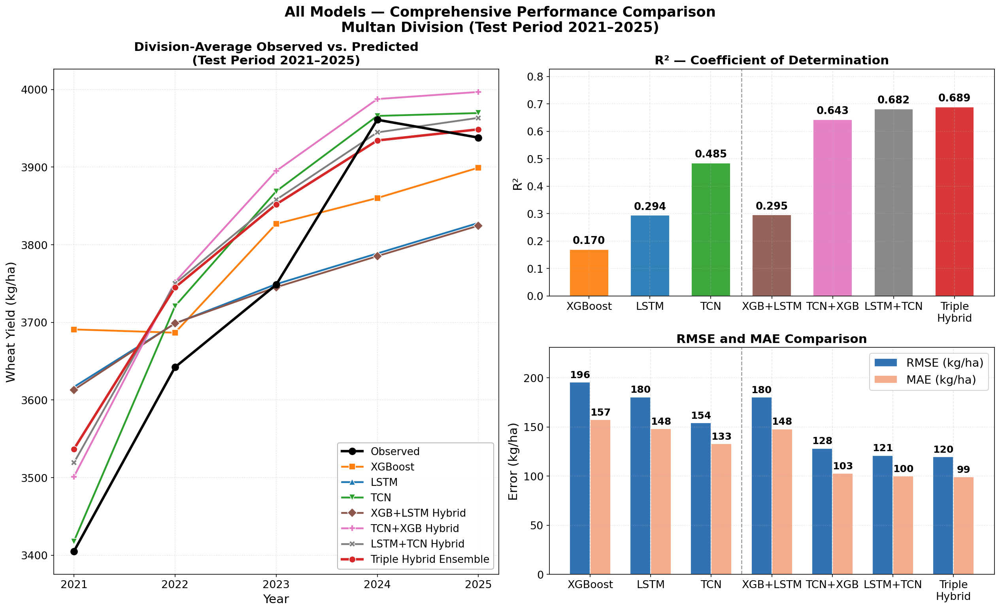

Caption: Figure. Comprehensive performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield (solid lines, one marker per model). Top right: R². Bottom right: RMSE and MAE. Dashed line separates standalone from hybrid models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparisonn_3panelss.png
✓ 3-panel comparison saved


In [ ]:
# ============================================================
# CELL 5B — COMPREHENSIVE COMPARISON (3-panel, readable)
# ============================================================
fig = plt.figure(figsize=(17, 10.5))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=17, fontweight='bold'
)

# distinct colour + marker per model so SOLID lines are easy to tell apart
STYLE = {
    'XGBoost':  ('#ff7f0e', 's'),
    'LSTM':     ('#1f77b4', '^'),
    'TCN':      ('#2ca02c', 'v'),
    'XGB+LSTM': ('#8c564b', 'D'),
    'TCN+XGB':  ('#e377c2', 'P'),
    'LSTM+TCN': ('#7f7f7f', 'X'),
    'Triple':   ('#d62728', 'o'),
}
def style_for(name):
    return STYLE.get(name.replace(' Hybrid', '').replace(' Ensemble', ''), ('#333333', 'o'))

# ---- Left: Division-average observed vs predicted (solid, distinct lines) ----
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values, color='black', lw=3.0,
         marker='o', ms=8, label='Observed', zorder=10)
for df, name, _ in all_models:
    col, mk = style_for(name)
    avg_pred = df.groupby('Year')['Predicted'].mean()
    lw = 3.0 if 'Triple' in name else 2.2
    ax1.plot(avg_pred.index, avg_pred.values, color=col, lw=lw, linestyle='-',
             marker=mk, ms=8, markeredgecolor='white', markeredgewidth=0.8,
             label=name, zorder=6 if 'Triple' in name else 4)
ax1.set_xlabel('Year', fontsize=15)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=15)
ax1.set_title('Division-Average Observed vs. Predicted\n(Test Period 2021–2025)',
              fontsize=15, fontweight='bold')
ax1.tick_params(axis='both', labelsize=13)
ax1.set_xticks(years)
ax1.grid(True, ls=':', alpha=0.45)
ax1.legend(fontsize=12.5, framealpha=0.93, loc='lower right', edgecolor='0.7')  # empty corner, off the lines

# ---- Top right: R² ----
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = ['#ff7f0e','#1f77b4','#2ca02c','#8c564b','#e377c2','#7f7f7f','#d62728']
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, r2_vals, 0.64, color=bar_colors, edgecolor='white', alpha=0.92)
for bar, v in zip(bars, r2_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, v+0.012, f'{v:.3f}',
             ha='center', va='bottom', fontsize=12.5, fontweight='bold')
ax2.set_ylabel('R²', fontsize=15)
ax2.set_ylim(0, max(r2_vals)*1.20)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=13)
ax2.tick_params(axis='y', labelsize=13)
ax2.set_title('R² — Coefficient of Determination', fontsize=15, fontweight='bold')
ax2.axvline(2.5, color='black', lw=1.2, ls='--', alpha=0.4)
ax2.grid(True, axis='y', ls=':', alpha=0.4)

# ---- Bottom right: RMSE & MAE ----
w = 0.34
b1 = ax3.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.92, label=f'RMSE ({UNIT})')
b2 = ax3.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.92, label=f'MAE ({UNIT})')
for bar, v in zip(b1, rmse_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, v+2.5, f'{v:.0f}',
             ha='center', va='bottom', fontsize=12, fontweight='bold')
for bar, v in zip(b2, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, v+2.5, f'{v:.0f}',
             ha='center', va='bottom', fontsize=12, fontweight='bold')
ax3.set_ylabel(f'Error ({UNIT})', fontsize=15)
ax3.set_ylim(0, max(rmse_vals)*1.18)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=13)
ax3.tick_params(axis='y', labelsize=13)
ax3.set_title('RMSE and MAE Comparison', fontsize=15, fontweight='bold')
ax3.axvline(2.5, color='black', lw=1.2, ls='--', alpha=0.4)
ax3.grid(True, axis='y', ls=':', alpha=0.4)
ax3.legend(fontsize=14, framealpha=0.9, loc='upper right')

plt.tight_layout()
caption = ('Figure. Comprehensive performance comparison of all seven models '
           '(test period: 2021–2025). Left: division-average observed vs. predicted '
           'yield (solid lines, one marker per model). Top right: R². Bottom right: '
           'RMSE and MAE. Dashed line separates standalone from hybrid models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparisonn_3panelss', caption)
print('✓ 3-panel comparison saved')

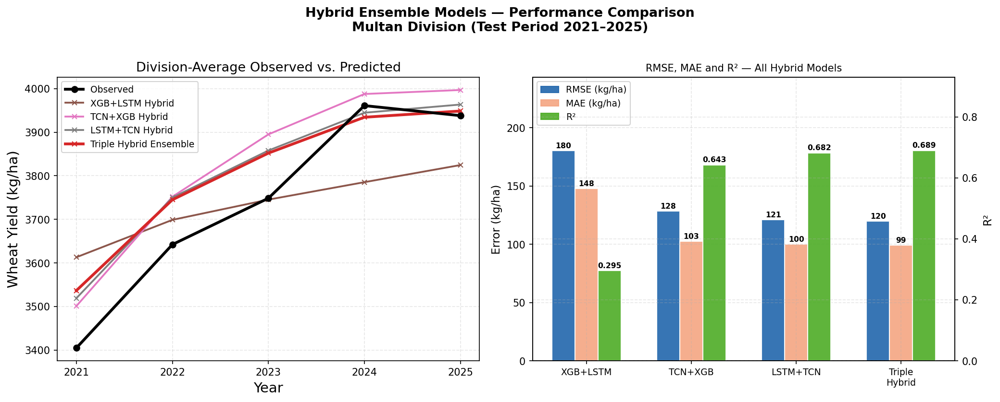

Caption: Figure. Hybrid ensemble model performance comparison (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green) computed on all 20 pooled district-year observations.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_Hybrid_Comparisonn.png
✓ Cell 5D saved


In [ ]:
# ============================================================
# CELL 5D — HYBRID COMPARISON (correct RMSE/MAE values)
# ============================================================

hybrid_models = [
    (xgblstm_pred, 'XGB+LSTM Hybrid',        'XGB+LSTM'),
    (tcnxgb_pred,  'TCN+XGB Hybrid',         'TCN+XGB'),
    (lstmtcn_pred, 'LSTM+TCN Hybrid',        'LSTM+TCN'),
    (triple_pred,  'Triple Hybrid Ensemble', 'Triple\nHybrid'),
]

r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in hybrid_models:
    r2, rmse, mae = compute_metrics(df)   # pooled 20 obs — matches Table 2
    r2_vals.append(r2)
    rmse_vals.append(rmse)
    mae_vals.append(mae)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'Hybrid Ensemble Models — Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# ── Left: Division-average line plot ──────────────────────────
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in hybrid_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col,
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=14)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=13)
ax1.legend(fontsize=9, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# ── Right: RMSE, MAE, R² grouped bars ─────────────────────────
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = [label for _, _, label in hybrid_models]
x = np.arange(len(short_names))
w = 0.22

b_rmse = ax2.bar(x - w, rmse_vals, w,
                 color=RMSE_COLOR, edgecolor='white', alpha=0.9,
                 label=f'RMSE ({UNIT})')
b_mae  = ax2.bar(x,     mae_vals,  w,
                 color=MAE_COLOR,  edgecolor='white', alpha=0.9,
                 label=f'MAE ({UNIT})')
b_r2   = ax2b.bar(x + w, r2_vals, w,
                  color=R2_COLOR,  edgecolor='white', alpha=0.9,
                  label='R²')

for bar, val in zip(b_rmse, rmse_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=7.5, fontweight='bold')
for bar, val in zip(b_mae, mae_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=7.5, fontweight='bold')
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x() + bar.get_width()/2,
              bar.get_height() + 0.005,
              f'{val:.3f}', ha='center', va='bottom',
              fontsize=7.5, fontweight='bold')

ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2b.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(rmse_vals) * 1.35)
ax2b.set_ylim(0, max(r2_vals) * 1.35)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=9)
ax2.set_title('RMSE, MAE and R² — All Hybrid Models', fontsize=10)

rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=9,
           framealpha=0.85, loc='upper left')

plt.tight_layout()

caption = (
    'Figure. Hybrid ensemble model performance comparison '
    '(test period: 2021–2025). '
    'Left: division-average observed vs. predicted yield. '
    'Right: RMSE (blue), MAE (orange), and R² (green) '
    'computed on all 20 pooled district-year observations.'
)
save_fig(fig, 'Fig_ActPred_Hybrid_Comparisonn', caption)
print('✓ Cell 5D saved')

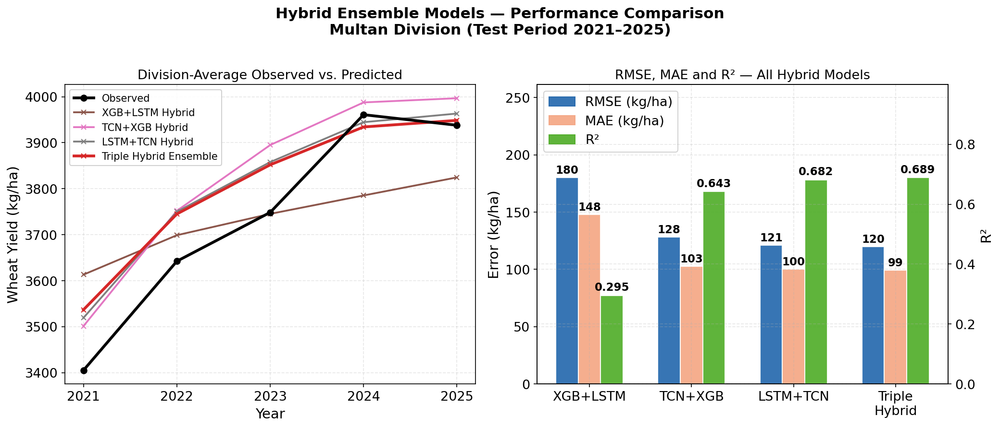

Caption: Figure. Hybrid ensemble model performance comparison (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green) computed on all 20 pooled district-year observations.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_Hybrid_Comparisonn22.png
✓ Cell 5D saved


In [ ]:
# ============================================================
# CELL 5D — HYBRID COMPARISON (correct RMSE/MAE values)
# ============================================================

hybrid_models = [
    (xgblstm_pred, 'XGB+LSTM Hybrid',        'XGB+LSTM'),
    (tcnxgb_pred,  'TCN+XGB Hybrid',         'TCN+XGB'),
    (lstmtcn_pred, 'LSTM+TCN Hybrid',        'LSTM+TCN'),
    (triple_pred,  'Triple Hybrid Ensemble', 'Triple\nHybrid'),
]

r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in hybrid_models:
    r2, rmse, mae = compute_metrics(df)   # pooled 20 obs — matches Table 2
    r2_vals.append(r2)
    rmse_vals.append(rmse)
    mae_vals.append(mae)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.8))
fig.suptitle(
    'Hybrid Ensemble Models — Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=15, fontweight='bold', y=1.02
)

# ── Left: Division-average line plot ──────────────────────────
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in hybrid_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col,
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=14)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=13)
ax1.legend(fontsize=10, framealpha=0.9, loc='upper left')
ax1.set_xticks(years)
ax1.tick_params(axis='both', labelsize=13)

# ── Right: RMSE, MAE, R² grouped bars ─────────────────────────
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = [label for _, _, label in hybrid_models]
x = np.arange(len(short_names))
w = 0.22

b_rmse = ax2.bar(x - w, rmse_vals, w,
                 color=RMSE_COLOR, edgecolor='white', alpha=0.9,
                 label=f'RMSE ({UNIT})')
b_mae  = ax2.bar(x,     mae_vals,  w,
                 color=MAE_COLOR,  edgecolor='white', alpha=0.9,
                 label=f'MAE ({UNIT})')
b_r2   = ax2b.bar(x + w, r2_vals, w,
                  color=R2_COLOR,  edgecolor='white', alpha=0.9,
                  label='R²')

for bar, val in zip(b_rmse, rmse_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1.5,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=11, fontweight='bold')
for bar, val in zip(b_mae, mae_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1.5,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=11, fontweight='bold')
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x() + bar.get_width()/2,
              bar.get_height() + 0.008,
              f'{val:.3f}', ha='center', va='bottom',
              fontsize=11, fontweight='bold')

ax2.set_ylabel(f'Error ({UNIT})', fontsize=14)
ax2b.set_ylabel('R²', fontsize=14)
ax2.set_ylim(0, max(rmse_vals) * 1.45)
ax2b.set_ylim(0, max(r2_vals) * 1.45)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=13)
ax2.tick_params(axis='y', labelsize=13)
ax2b.tick_params(axis='y', labelsize=13)
ax2.set_title('RMSE, MAE and R² — All Hybrid Models', fontsize=13)

rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=13,
           framealpha=0.85, loc='upper left')

plt.tight_layout()

caption = (
    'Figure. Hybrid ensemble model performance comparison '
    '(test period: 2021–2025). '
    'Left: division-average observed vs. predicted yield. '
    'Right: RMSE (blue), MAE (orange), and R² (green) '
    'computed on all 20 pooled district-year observations.'
)
save_fig(fig, 'Fig_ActPred_Hybrid_Comparisonn22', caption)
print('✓ Cell 5D saved')

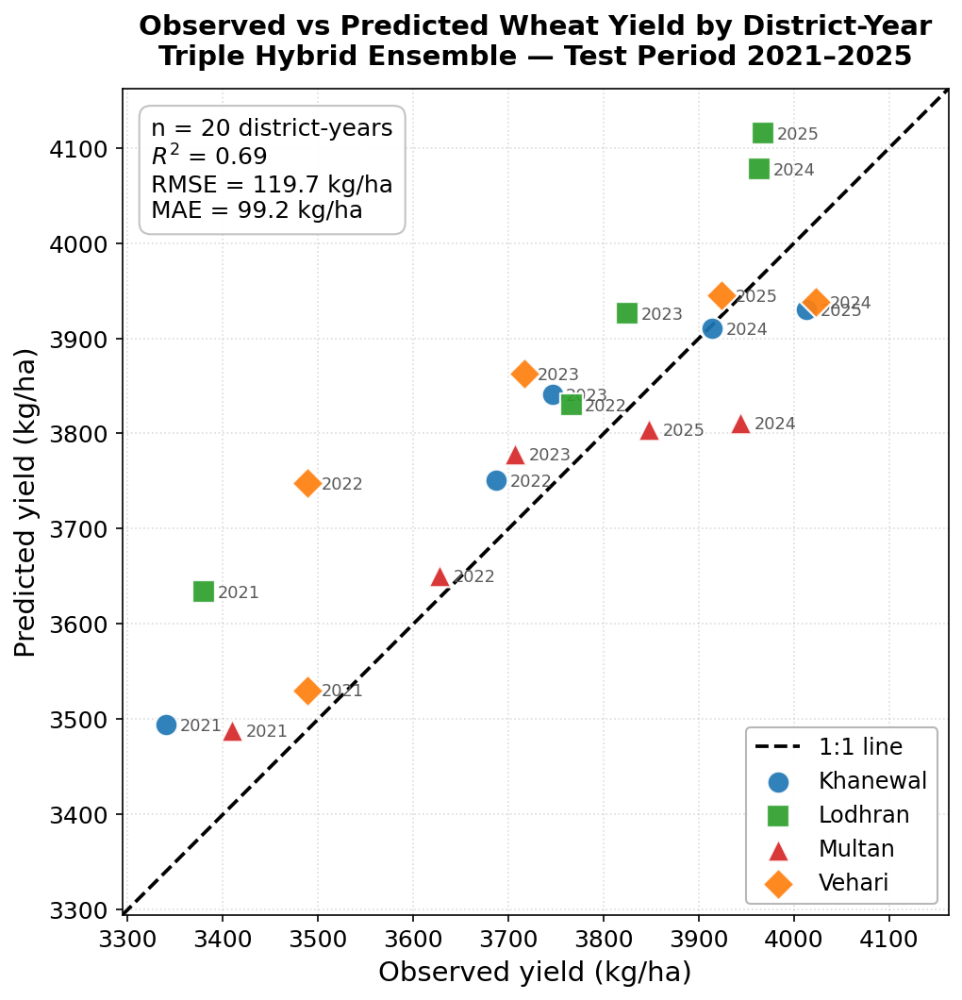

Caption: Figure. Observed versus predicted wheat yield for each of the 20 district-year observations in the test period (2021–2025), Triple Hybrid Ensemble. Points are coloured by district and labelled by year; the dashed line is the 1:1 reference. Metrics are computed on the individual district-year values, matching those reported in Table 2.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Obs_vs_Pred_DistrictYear.png
✓ District-level scatter saved — R² = 0.6892, RMSE = 119.7 kg/ha


In [ ]:
# ── District-level observed vs predicted scatter (primary model) ──────
from sklearn.metrics import r2_score

# pull the Triple Hybrid dataframe out of all_models
tri_df = None
for df, name, _ in all_models:
    if 'Triple' in name:
        tri_df = df.copy(); tri_name = name; break
assert tri_df is not None, 'Triple Hybrid not found in all_models'

DIST_STYLE = {
    'Khanewal': ('#1f77b4', 'o'),
    'Lodhran':  ('#2ca02c', 's'),
    'Multan':   ('#d62728', '^'),
    'Vehari':   ('#ff7f0e', 'D'),
}

fig, ax = plt.subplots(figsize=(7.6, 7.2))

obs = tri_df['Actual'].values
prd = tri_df['Predicted'].values

# 1:1 reference line across a padded common range
lo = min(obs.min(), prd.min()); hi = max(obs.max(), prd.max())
pad = 0.06 * (hi - lo)
lo, hi = lo - pad, hi + pad
ax.plot([lo, hi], [lo, hi], color='black', lw=1.8, ls='--',
        zorder=2, label='1:1 line')

# points coloured by district, labelled by year
for dist, grp in tri_df.groupby('District'):
    c, mk = DIST_STYLE.get(dist, ('#555555', 'o'))
    ax.scatter(grp['Actual'], grp['Predicted'], s=130, c=c, marker=mk,
               edgecolor='white', linewidth=1.1, alpha=0.92,
               label=dist, zorder=5)
    for _, r in grp.iterrows():
        ax.annotate(str(int(r['Year'])),
                    (r['Actual'], r['Predicted']),
                    textcoords='offset points', xytext=(7, -3),
                    fontsize=8.5, color='0.35')

r2   = r2_score(obs, prd)
rmse = np.sqrt(np.mean((obs - prd) ** 2))
mae  = np.mean(np.abs(obs - prd))

ax.text(0.035, 0.965,
        f'n = {len(obs)} district-years\n$R^2$ = {r2:.2f}\n'
        f'RMSE = {rmse:.1f} {UNIT}\nMAE = {mae:.1f} {UNIT}',
        transform=ax.transAxes, va='top', ha='left', fontsize=12,
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white',
                  edgecolor='0.75', alpha=0.93))

ax.set_xlim(lo, hi); ax.set_ylim(lo, hi)
ax.set_aspect('equal', adjustable='box')
ax.set_xlabel(f'Observed yield ({UNIT})', fontsize=14)
ax.set_ylabel(f'Predicted yield ({UNIT})', fontsize=14)
ax.set_title('Observed vs Predicted Wheat Yield by District-Year\n'
             'Triple Hybrid Ensemble — Test Period 2021–2025',
             fontsize=14, fontweight='bold', pad=12)
ax.tick_params(axis='both', labelsize=12)
ax.grid(True, ls=':', alpha=0.45)
ax.legend(fontsize=11.5, loc='lower right', framealpha=0.95,
          edgecolor='0.7')

plt.tight_layout()
caption = ('Figure. Observed versus predicted wheat yield for each of the 20 '
           'district-year observations in the test period (2021–2025), Triple '
           'Hybrid Ensemble. Points are coloured by district and labelled by '
           'year; the dashed line is the 1:1 reference. Metrics are computed on '
           'the individual district-year values, matching those reported in '
           'Table 2.')
save_fig(fig, 'Fig_Obs_vs_Pred_DistrictYear', caption)
print(f'✓ District-level scatter saved — R² = {r2:.4f}, RMSE = {rmse:.1f} {UNIT}')

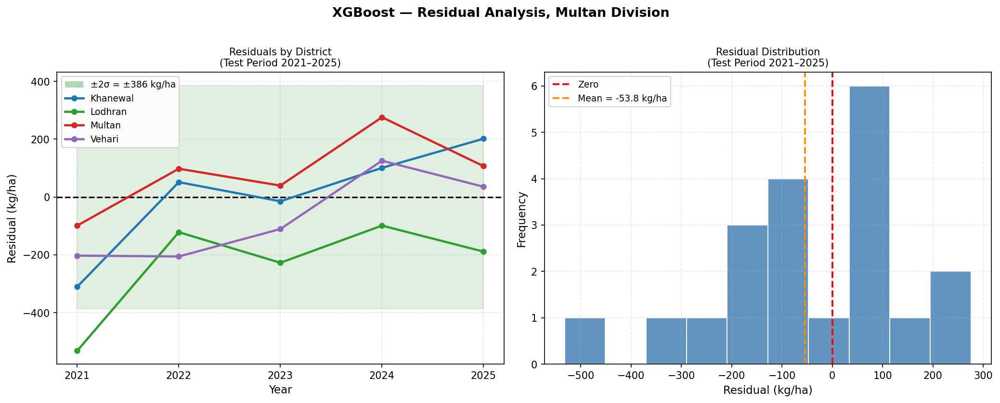

Caption: Figure. Residual analysis for the XGBoost model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±386 kg/ha). Right: residual frequency distribution. Mean residual = -53.8 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_XGBoost.png
✓ XGBoost


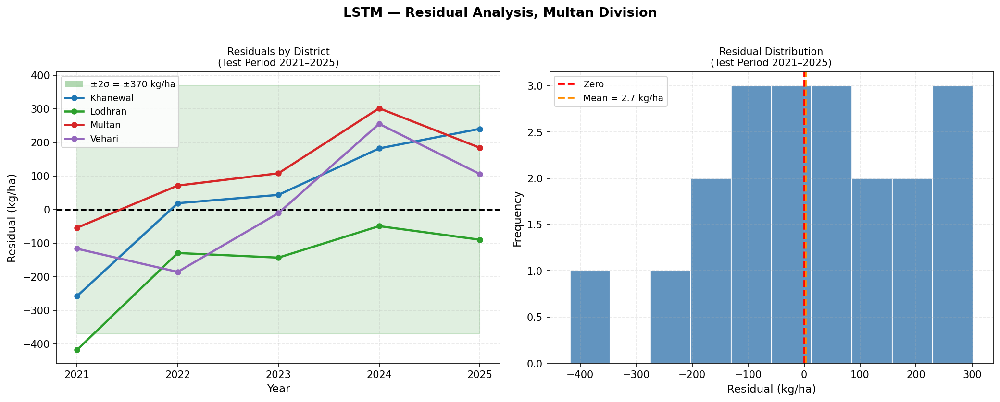

Caption: Figure. Residual analysis for the LSTM model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±370 kg/ha). Right: residual frequency distribution. Mean residual = 2.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_LSTM.png
✓ LSTM


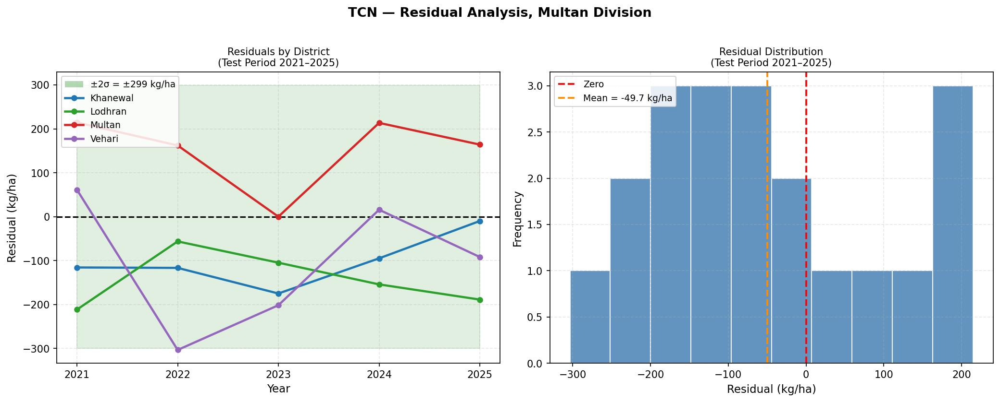

Caption: Figure. Residual analysis for the TCN model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±299 kg/ha). Right: residual frequency distribution. Mean residual = -49.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_TCN.png
✓ TCN


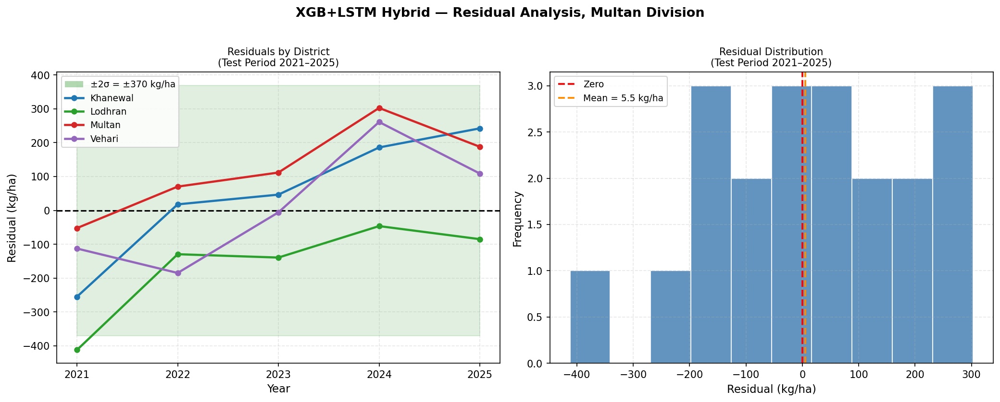

Caption: Figure. Residual analysis for the XGB+LSTM Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±370 kg/ha). Right: residual frequency distribution. Mean residual = 5.5 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_XGB_LSTM.png
✓ XGB+LSTM Hybrid


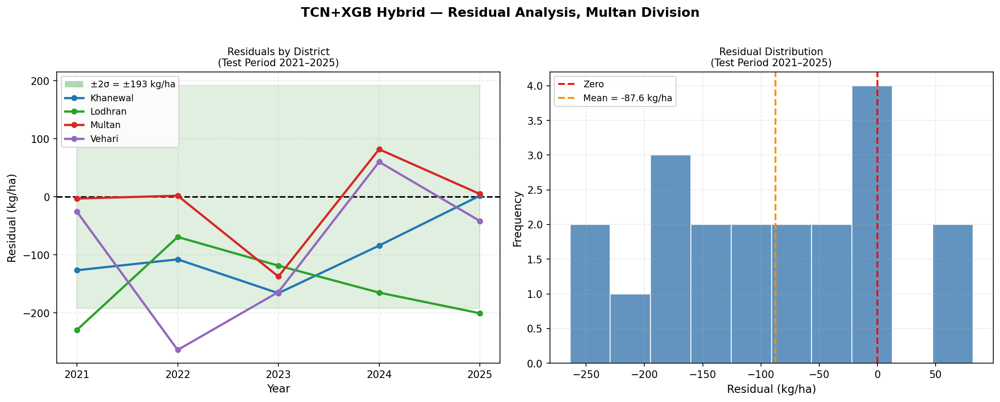

Caption: Figure. Residual analysis for the TCN+XGB Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±193 kg/ha). Right: residual frequency distribution. Mean residual = -87.6 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_TCN_XGB.png
✓ TCN+XGB Hybrid


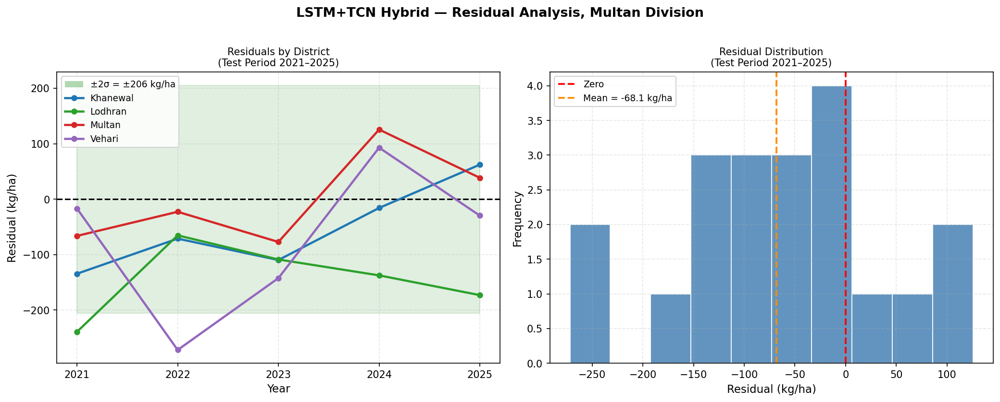

Caption: Figure. Residual analysis for the LSTM+TCN Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±206 kg/ha). Right: residual frequency distribution. Mean residual = -68.1 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_LSTM_TCN.png
✓ LSTM+TCN Hybrid


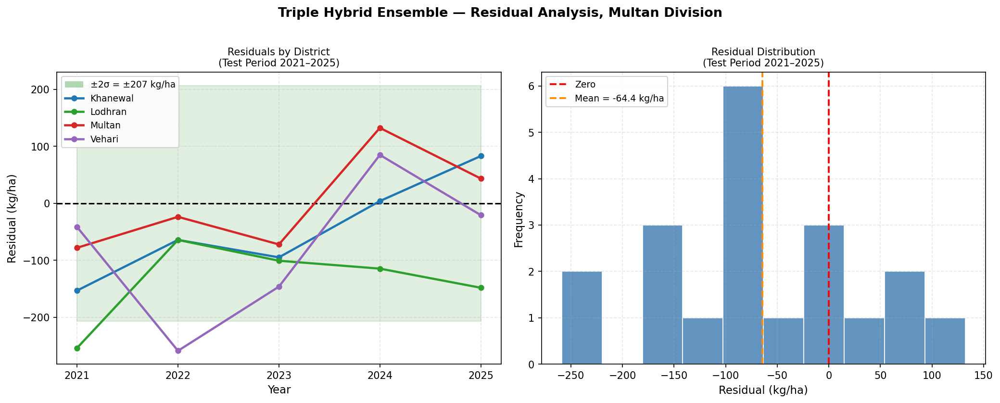

Caption: Figure. Residual analysis for the Triple Hybrid Ensemble model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±207 kg/ha). Right: residual frequency distribution. Mean residual = -64.4 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_Triple.png
✓ Triple Hybrid Ensemble


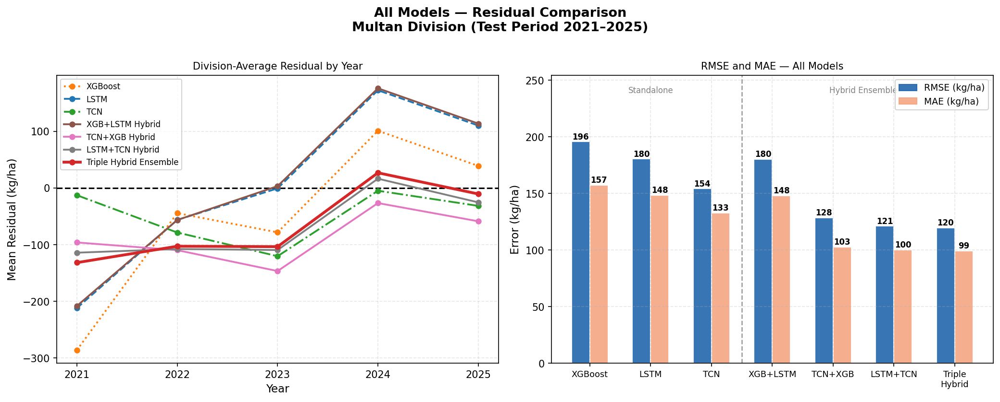

Caption: Figure. Residual comparison across all seven models (test period: 2021–2025). Left: division-average residual trajectories by year. Right: RMSE (blue) and MAE (orange) for all models. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_Comparison.png
✓ All-models residual comparison saved

Cell 6 complete ✓


In [ ]:
# ============================================================
# CELL 6 — RESIDUAL PLOTS (7 Individual + 1 Comparison)
# ============================================================

def plot_residuals(df, model_name, save_name):
    df = df.copy()
    df['Residual'] = df['Actual'] - df['Predicted']
    mean_res = df['Residual'].mean()
    band = 2 * df['Residual'].std()

    fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
    fig.suptitle(
        f'{model_name} — Residual Analysis, Multan Division',
        fontsize=13, fontweight='bold', y=1.01
    )

    # Left: Residuals over time
    ax1 = axes[0]
    years = sorted(df['Year'].unique())
    ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
    ax1.fill_between(years, -band, band, alpha=0.12, color='green')
    for dist in DISTRICTS:
        sub = df[df['District']==dist].sort_values('Year')
        ax1.plot(sub['Year'], sub['Residual'],
                 color=DIST_COLORS[dist], lw=2.2, marker='o', ms=5, label=dist)
    band_patch = mpatches.Patch(facecolor='green', alpha=0.3,
                                label=f'±2σ = ±{band:.0f} {UNIT}')
    handles, labels = ax1.get_legend_handles_labels()
    ax1.legend(handles=[band_patch]+handles,
               labels=[f'±2σ = ±{band:.0f} {UNIT}']+labels,
               fontsize=9, framealpha=0.85, loc='upper left')
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f'Residual ({UNIT})')
    ax1.set_title('Residuals by District\n(Test Period 2021–2025)', fontsize=10)
    ax1.set_xticks(years)

    # Right: Histogram
    ax2 = axes[1]
    ax2.hist(df['Residual'], bins=10, color='steelblue', edgecolor='white', alpha=0.85)
    ax2.axvline(0, color='red', lw=1.8, linestyle='--', label='Zero')
    ax2.axvline(mean_res, color='darkorange', lw=1.8, linestyle='--',
                label=f'Mean = {mean_res:.1f} {UNIT}')
    ax2.set_xlabel(f'Residual ({UNIT})')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Residual Distribution\n(Test Period 2021–2025)', fontsize=10)
    ax2.legend(fontsize=9, framealpha=0.85, loc='upper left')

    plt.tight_layout()
    caption = (f'Figure. Residual analysis for the {model_name} model '
               f'(test period: 2021–2025). '
               f'Left: temporal residuals by district with ±2σ band (±{band:.0f} {UNIT}). '
               f'Right: residual frequency distribution. '
               f'Mean residual = {mean_res:.1f} {UNIT}.')
    save_fig(fig, save_name, caption)

# Generate for all 7 models
for df, name, fname in all_models:
    fname_r = fname.replace('ActPred', 'Residuals')
    plot_residuals(df, name, fname_r)
    print(f'✓ {name}')

# ── 8th Plot: All-Models Residual Comparison ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'All Models — Residual Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# Left: Mean residual by year
ax1 = axes[0]
ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
for df, name, _ in all_models:
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(mean_yr.index, mean_yr.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='o', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Mean Residual ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Residual by Year', fontsize=10)
ax1.legend(fontsize=8, framealpha=0.85, loc='upper left')
ax1.set_xticks([2021,2022,2023,2024,2025])

# Right: RMSE & MAE bars
ax2 = axes[1]
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
rmse_vals, mae_vals = [], []
for df, name, _ in all_models:
    _, rmse, mae = compute_metrics(df)
    rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
w = 0.3
b1 = ax2.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax2.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.3)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8.5)
ax2.set_title('RMSE and MAE — All Models', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0,  max(rmse_vals)*1.22, 'Standalone', ha='center', fontsize=8, color='gray')
ax2.text(4.5, max(rmse_vals)*1.22, 'Hybrid Ensemble', ha='center', fontsize=8, color='gray')
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax2.legend(handles=[rmse_p, mae_p], fontsize=9, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Residual comparison across all seven models (test period: 2021–2025). '
           'Left: division-average residual trajectories by year. '
           'Right: RMSE (blue) and MAE (orange) for all models. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_Residuals_AllModels_Comparison', caption)
print('✓ All-models residual comparison saved')
print('\nCell 6 complete ✓')


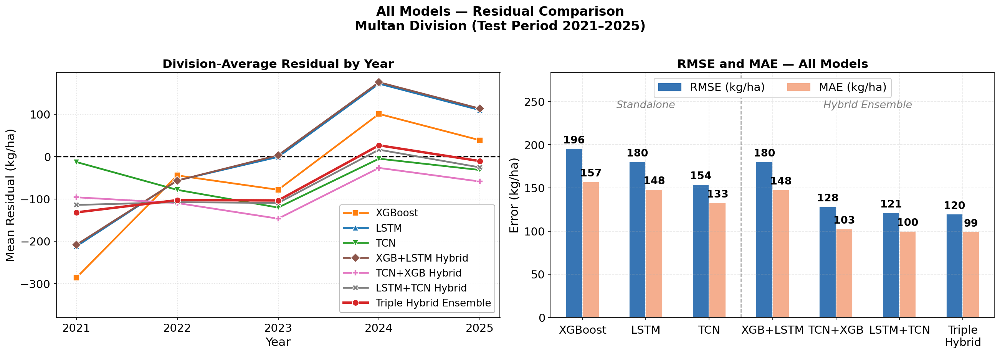

Caption: Figure. Residual comparison across all seven models (test period: 2021–2025). Left: division-average residual trajectories by year (solid lines, one marker per model). Right: RMSE (blue) and MAE (orange). Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_Comparisonnn1.png
✓ All-models residual comparison saved

Cell 6 complete ✓


In [ ]:
# ── 8th Plot: All-Models Residual Comparison ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(17.5, 6))
fig.suptitle(
    'All Models — Residual Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=16, fontweight='bold', y=1.02
)

# distinct colour + marker per model so SOLID lines are easy to tell apart
STYLE = {
    'XGBoost':  ('#ff7f0e', 's'),
    'LSTM':     ('#1f77b4', '^'),
    'TCN':      ('#2ca02c', 'v'),
    'XGB+LSTM': ('#8c564b', 'D'),
    'TCN+XGB':  ('#e377c2', 'P'),
    'LSTM+TCN': ('#7f7f7f', 'X'),
    'Triple':   ('#d62728', 'o'),
}
def style_for(name):
    return STYLE.get(name.replace(' Hybrid', '').replace(' Ensemble', ''), ('#333333', 'o'))

# Left: Mean residual by year (solid, distinct lines)
ax1 = axes[0]
ax1.axhline(0, color='black', lw=1.6, linestyle='--', zorder=2)
for df, name, _ in all_models:
    col, mk = style_for(name)
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    lw = 3.0 if 'Triple' in name else 2.2
    ax1.plot(mean_yr.index, mean_yr.values, color=col, lw=lw, linestyle='-',
             marker=mk, ms=8, markeredgecolor='white', markeredgewidth=0.8,
             label=name, zorder=6 if 'Triple' in name else 4)
ax1.set_xlabel('Year', fontsize=15)
ax1.set_ylabel(f'Mean Residual ({UNIT})', fontsize=15)
ax1.set_title('Division-Average Residual by Year', fontsize=15, fontweight='bold')
ax1.set_xticks([2021, 2022, 2023, 2024, 2025])
ax1.tick_params(axis='both', labelsize=14)
ax1.grid(True, ls=':', alpha=0.4)
# add a little bottom room, then place the enlarged legend in the empty lower-right
ymin, ymax = ax1.get_ylim()
ax1.set_ylim(ymin - 0.14 * (ymax - ymin), ymax)
ax1.legend(fontsize=12.5, framealpha=0.93, loc='lower right', edgecolor='0.7', handlelength=2.4)

# Right: RMSE & MAE bars
ax2 = axes[1]
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
rmse_vals, mae_vals = [], []
for df, name, _ in all_models:
    _, rmse, mae = compute_metrics(df)
    rmse_vals.append(rmse); mae_vals.append(mae)

SP = 1.6
x  = np.arange(len(short_names)) * SP
w  = 0.42
b1 = ax2.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax2.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')

LBL = dict(ha='center', va='bottom', fontsize=13, fontweight='bold', color='black')
off = max(rmse_vals) * 0.018
for bars, vals in [(b1, rmse_vals), (b2, mae_vals)]:
    for bar, val in zip(bars, vals):
        ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+off, f'{val:.0f}', **LBL)

ax2.set_ylabel(f'Error ({UNIT})', fontsize=15)
ax2.set_ylim(0, max(rmse_vals)*1.45)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=14)
ax2.tick_params(axis='x', pad=6)
ax2.tick_params(axis='y', labelsize=14)
ax2.set_title('RMSE and MAE — All Models', fontsize=15, fontweight='bold')
ax2.set_xlim(-0.8, x[-1] + 0.8)
ax2.axvline(2.5 * SP, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0 * SP, max(rmse_vals)*1.24, 'Standalone', ha='center',
         fontsize=13, color='gray', style='italic')
ax2.text(4.5 * SP, max(rmse_vals)*1.24, 'Hybrid Ensemble', ha='center',
         fontsize=13, color='gray', style='italic')
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax2.legend(handles=[rmse_p, mae_p], fontsize=14, framealpha=0.9,
           loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.0))

plt.tight_layout()
caption = ('Figure. Residual comparison across all seven models (test period: 2021–2025). '
           'Left: division-average residual trajectories by year (solid lines, one marker '
           'per model). Right: RMSE (blue) and MAE (orange). Dashed vertical line separates '
           'standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_Residuals_AllModels_Comparisonnn1', caption)
print('✓ All-models residual comparison saved')
print('\nCell 6 complete ✓')

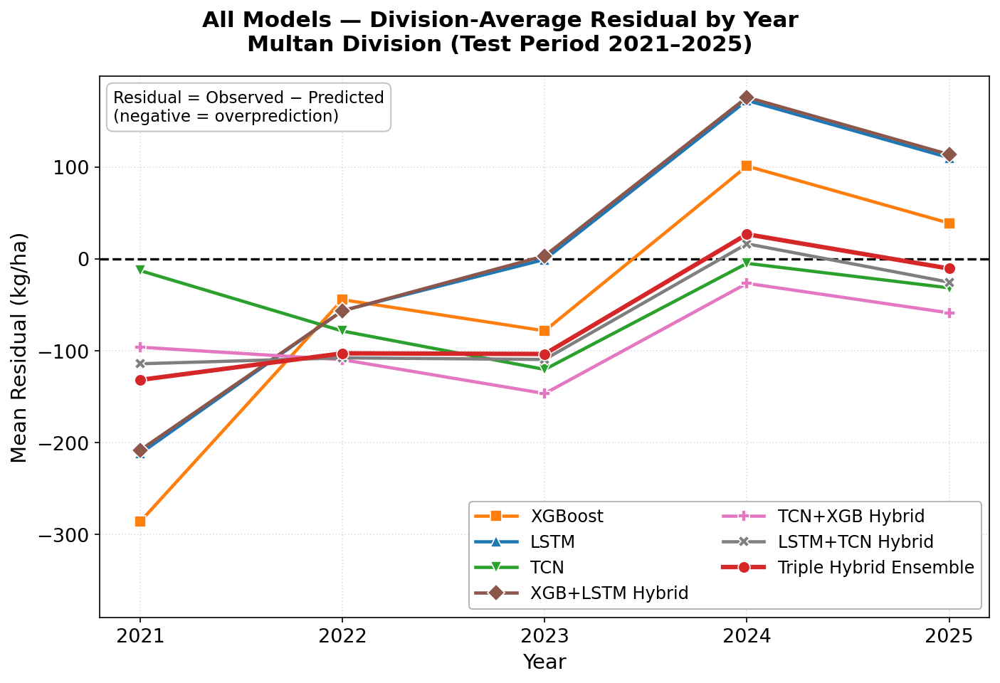

Caption: Figure. Division-average residual trajectories by year for all seven models (test period 2021–2025). Residuals are defined as observed minus predicted, so the negative values in 2021 indicate systematic overprediction. Only the TCN-based models converge toward zero thereafter, while the LSTM and XGB+LSTM residuals grow to about +170 kg/ha by 2024.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_SinglePanellll.png
✓ Single-panel residual figure saved


In [ ]:
# ── Residual Comparison (single panel: division-average residual by year) ──
fig, ax1 = plt.subplots(figsize=(9.5, 6.5))
fig.suptitle(
    'All Models — Division-Average Residual by Year\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=15, fontweight='bold', y=0.98
)

# distinct colour + marker per model so SOLID lines are easy to tell apart
STYLE = {
    'XGBoost':  ('#ff7f0e', 's'),
    'LSTM':     ('#1f77b4', '^'),
    'TCN':      ('#2ca02c', 'v'),
    'XGB+LSTM': ('#8c564b', 'D'),
    'TCN+XGB':  ('#e377c2', 'P'),
    'LSTM+TCN': ('#7f7f7f', 'X'),
    'Triple':   ('#d62728', 'o'),
}
def style_for(name):
    return STYLE.get(name.replace(' Hybrid', '').replace(' Ensemble', ''), ('#333333', 'o'))

ax1.axhline(0, color='black', lw=1.6, linestyle='--', zorder=2)
for df, name, _ in all_models:
    col, mk = style_for(name)
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    lw = 3.0 if 'Triple' in name else 2.2
    ax1.plot(mean_yr.index, mean_yr.values, color=col, lw=lw, linestyle='-',
             marker=mk, ms=8, markeredgecolor='white', markeredgewidth=0.8,
             label=name, zorder=6 if 'Triple' in name else 4)

ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Mean Residual ({UNIT})', fontsize=14)
ax1.set_xticks([2021, 2022, 2023, 2024, 2025])
ax1.tick_params(axis='both', labelsize=13)
ax1.grid(True, ls=':', alpha=0.4)

# annotate sign convention so the 2021 overprediction is unambiguous
ax1.text(0.015, 0.975,
         'Residual = Observed − Predicted\n(negative = overprediction)',
         transform=ax1.transAxes, fontsize=11, va='top', ha='left',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='white',
                   edgecolor='0.75', alpha=0.9))

# add bottom room, then place the legend in the empty lower-right
ymin, ymax = ax1.get_ylim()
ax1.set_ylim(ymin - 0.16 * (ymax - ymin), ymax)
ax1.legend(fontsize=11.5, framealpha=0.93, loc='lower right',
           edgecolor='0.7', handlelength=2.4, ncol=2)

plt.tight_layout()
caption = ('Figure. Division-average residual trajectories by year for all seven models '
           '(test period 2021–2025). Residuals are defined as observed minus predicted, '
           'so the negative values in 2021 indicate systematic overprediction. Only the '
           'TCN-based models converge toward zero thereafter, while the LSTM and XGB+LSTM '
           'residuals grow to about +170 kg/ha by 2024.')
save_fig(fig, 'Fig_Residuals_AllModels_SinglePanellll', caption)
print('✓ Single-panel residual figure saved')

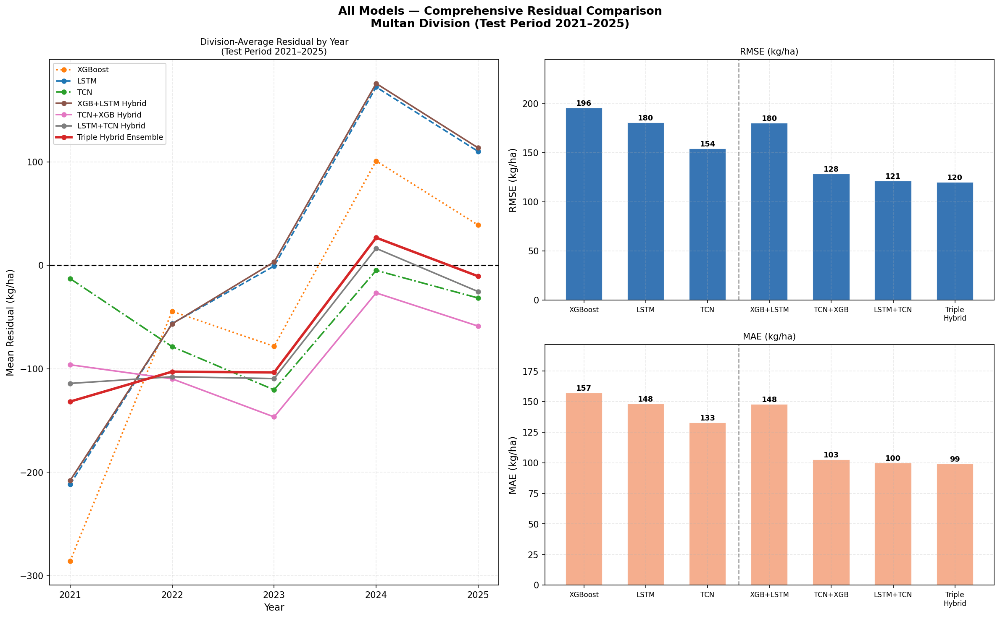

Caption: Figure. Comprehensive residual comparison of all seven models (test period: 2021–2025). Left: division-average residuals over time. Top right: RMSE. Bottom right: MAE. All metrics in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_Comparison_3panel.png
✓ 3-panel residual comparison saved


In [ ]:
# ============================================================
# CELL 6B — ALTERNATIVE RESIDUAL COMPARISON (3-panel)
# ============================================================

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Residual Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold'
)

# Left: mean residual by year
ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
for df, name, _ in all_models:
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name,'#333333'))
    ax1.plot(mean_yr.index, mean_yr.values,
             color=col, lw=MODEL_LW.get(name,1.8),
             linestyle=MODEL_LINE_STYLES.get(name,'-'),
             marker='o', ms=5, label=name)
ax1.set_xlabel('Year',fontsize=11)
ax1.set_ylabel(f'Mean Residual ({UNIT})',fontsize=11)
ax1.set_title('Division-Average Residual by Year\n(Test Period 2021–2025)',fontsize=10)
ax1.legend(fontsize=8.5, framealpha=0.85, loc='upper left')
ax1.set_xticks([2021,2022,2023,2024,2025])

# Top right: RMSE bars
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
rmse_vals, mae_vals = [], []
for df, name, _ in all_models:
    _, rmse, mae = compute_metrics(df)
    rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, rmse_vals, 0.6, color=RMSE_COLOR, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax2.set_ylabel(f'RMSE ({UNIT})',fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.25)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8)
ax2.set_title(f'RMSE ({UNIT})',fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: MAE bars
bars = ax3.bar(x, mae_vals, 0.6, color=MAE_COLOR, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax3.set_ylabel(f'MAE ({UNIT})',fontsize=11)
ax3.set_ylim(0, max(mae_vals)*1.25)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=8)
ax3.set_title(f'MAE ({UNIT})',fontsize=10)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

plt.tight_layout()
caption = ('Figure. Comprehensive residual comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average residuals over time. '
           'Top right: RMSE. Bottom right: MAE. '
           f'All metrics in {UNIT}.')
save_fig(fig, 'Fig_Residuals_AllModels_Comparison_3panel', caption)
print('✓ 3-panel residual comparison saved')


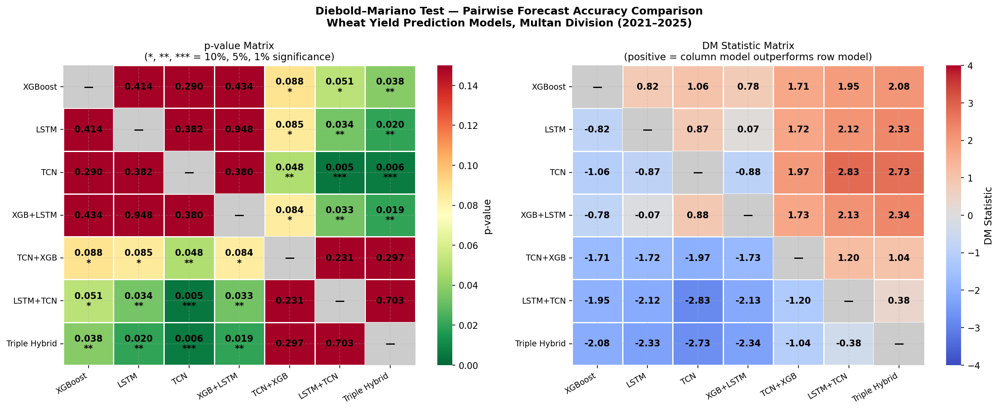

Caption: Figure. Diebold–Mariano (DM) pairwise test results for all seven models. Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). Right: DM statistic matrix (positive values indicate the column model outperforms the row model).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_DM_Test_Heatmap.png
✓ DM heatmap saved


In [ ]:
# ============================================================
# CELL 7 — DM TEST HEATMAP
# ============================================================

DM_NAME_MAP = {
    'XGBoost':'XGBoost','LSTM':'LSTM','TCN':'TCN',
    'XGB+LSTM Hybrid':'XGB+LSTM','TCN+XGB Hybrid':'TCN+XGB',
    'LSTM+TCN Hybrid':'LSTM+TCN','Triple Hybrid Ensemble':'Triple Hybrid',
    'XGB+LSTM':'XGB+LSTM','TCN+XGB':'TCN+XGB','LSTM+TCN':'LSTM+TCN',
    'Triple':'Triple Hybrid','SERWI Triple':'Triple Hybrid',
    'SERWI XGB+LSTM':'XGB+LSTM','SERWI TCN+XGB':'TCN+XGB',
    'SERWI LSTM+TCN':'LSTM+TCN',
}

dm = dm_results.copy()
dm['Benchmark']  = dm['Benchmark'].map(DM_NAME_MAP).fillna(dm['Benchmark'])
dm['Challenger'] = dm['Challenger'].map(DM_NAME_MAP).fillna(dm['Challenger'])
DM_LABELS = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid']
n = len(DM_LABELS)

pval_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
stat_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
for _, row in dm.iterrows():
    b, c = row['Benchmark'], row['Challenger']
    if b in DM_LABELS and c in DM_LABELS:
        pval_matrix.loc[b,c] = row['p_value']
        pval_matrix.loc[c,b] = row['p_value']
        stat_matrix.loc[b,c] = row['DM_Statistic']
        stat_matrix.loc[c,b] = -row['DM_Statistic']

fig, axes = plt.subplots(1, 2, figsize=(16, 6.5))
fig.suptitle(
    'Diebold–Mariano Test — Pairwise Forecast Accuracy Comparison\n'
    'Wheat Yield Prediction Models, Multan Division (2021–2025)',
    fontsize=12, fontweight='bold'
)

# p-value matrix
ax1 = axes[0]
annot_pval = pd.DataFrame('', index=DM_LABELS, columns=DM_LABELS)
pval_plot  = pval_matrix.copy()
for i,b in enumerate(DM_LABELS):
    for j,c in enumerate(DM_LABELS):
        if i==j:
            annot_pval.loc[b,c]='—'; pval_plot.loc[b,c]=np.nan
        elif not np.isnan(pval_matrix.loc[b,c]):
            p = pval_matrix.loc[b,c]
            stars = '***' if p<0.01 else ('**' if p<0.05 else ('*' if p<0.10 else ''))
            annot_pval.loc[b,c] = f'{p:.3f}\n{stars}' if stars else f'{p:.3f}'
        else:
            annot_pval.loc[b,c]=''

sns.heatmap(pval_plot.astype(float), ax=ax1, cmap='RdYlGn_r', vmin=0, vmax=0.15,
            annot=annot_pval, fmt='',
            annot_kws={'size':10,'color':'black','weight':'bold'},
            linewidths=0.5, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'p-value'}, mask=pval_plot.isnull())
for i in range(n):
    ax1.add_patch(plt.Rectangle((i,i),1,1,fill=True,color='#cccccc',lw=0))
    ax1.text(i+0.5,i+0.5,'—',ha='center',va='center',fontsize=11,color='black',fontweight='bold')
ax1.set_title('p-value Matrix\n(*, **, *** = 10%, 5%, 1% significance)', fontsize=11)
ax1.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9)
ax1.set_yticklabels(DM_LABELS, rotation=0, fontsize=9)

# DM statistic matrix
ax2 = axes[1]
annot_stat = pd.DataFrame('', index=DM_LABELS, columns=DM_LABELS)
stat_plot  = stat_matrix.copy()
for i,b in enumerate(DM_LABELS):
    for j,c in enumerate(DM_LABELS):
        if i==j:
            annot_stat.loc[b,c]='—'; stat_plot.loc[b,c]=np.nan
        elif not np.isnan(stat_matrix.loc[b,c]):
            annot_stat.loc[b,c]=f'{stat_matrix.loc[b,c]:.2f}'
        else:
            annot_stat.loc[b,c]=''

sns.heatmap(stat_plot.astype(float), ax=ax2, cmap='coolwarm', center=0, vmin=-4, vmax=4,
            annot=annot_stat, fmt='',
            annot_kws={'size':10,'color':'black','weight':'bold'},
            linewidths=0.5, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'DM Statistic'}, mask=stat_plot.isnull())
for i in range(n):
    ax2.add_patch(plt.Rectangle((i,i),1,1,fill=True,color='#cccccc',lw=0))
    ax2.text(i+0.5,i+0.5,'—',ha='center',va='center',fontsize=11,color='black',fontweight='bold')
ax2.set_title('DM Statistic Matrix\n(positive = column model outperforms row model)', fontsize=11)
ax2.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9)
ax2.set_yticklabels(DM_LABELS, rotation=0, fontsize=9)

plt.tight_layout()
caption = ('Figure. Diebold–Mariano (DM) pairwise test results for all seven models. '
           'Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). '
           'Right: DM statistic matrix (positive values indicate the column model '
           'outperforms the row model).')
save_fig(fig, 'Fig_DM_Test_Heatmap', caption)
print('✓ DM heatmap saved')


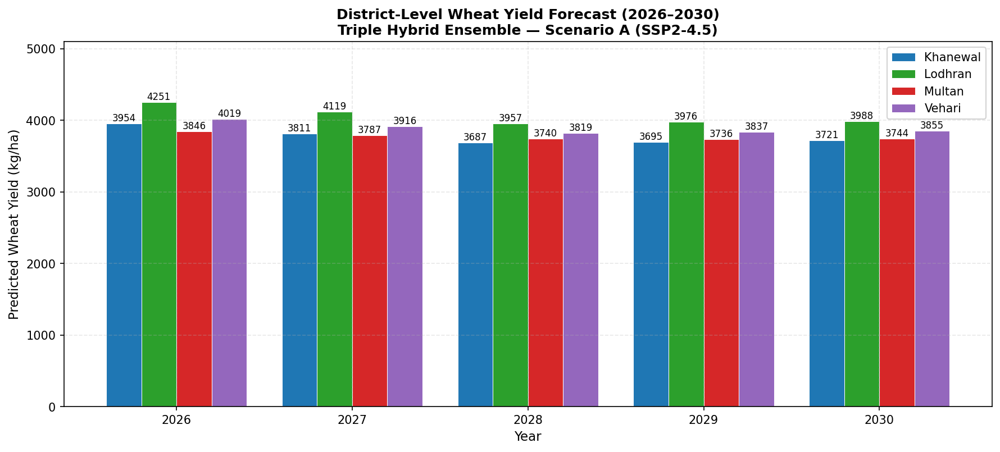

Caption: Figure. Projected district-level wheat yield (2026–2030) using the Triple Hybrid Ensemble under Scenario A (SSP2-4.5, moderate emissions). Yield values are expressed in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_District_Bar.png
✓ Forecast bar chart saved


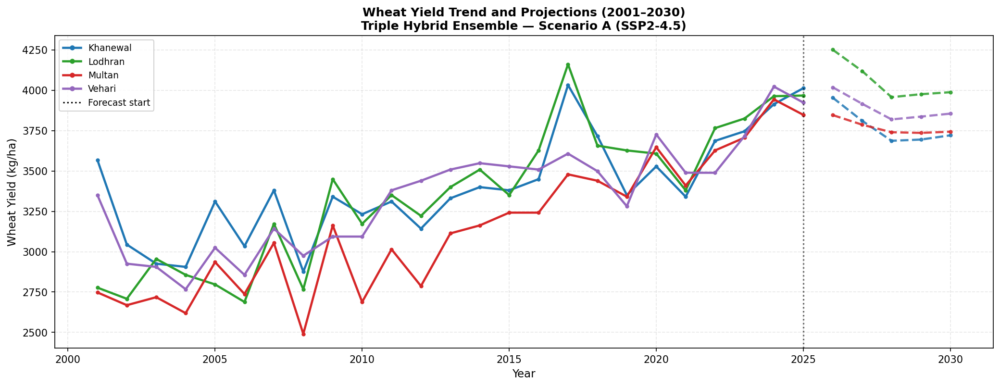

Caption: Figure. Historical (2001–2025) and projected (2026–2030) wheat yield for all four districts under Scenario A (SSP2-4.5). Solid lines represent historical observations; dashed lines represent model projections. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Full_Timeline.png
✓ Full timeline plot saved

Cell 8 complete ✓


In [ ]:
# ============================================================
# CELL 8 — FORECAST PLOTS
# ============================================================

# ── Bar chart: District-wise 2026-2030 ────────────────────────
scen_a = forecast_scenA[forecast_scenA['Scenario']=='ScenarioA_Primary'].copy()
years  = sorted(scen_a['Year'].unique())
x = np.arange(len(years))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 5.5))
for i, dist in enumerate(DISTRICTS):
    vals = [scen_a[(scen_a['Year']==y)&(scen_a['District']==dist)]['SERWI_Triple'].values[0]
            for y in years]
    bars = ax.bar(x + i*width, vals, width,
                  color=DIST_COLORS[dist], label=dist, edgecolor='white', lw=0.5)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5,
                f'{val:.0f}', ha='center', va='bottom', fontsize=8)

ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Predicted Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'District-Level Wheat Yield Forecast (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(x + width*1.5)
ax.set_xticklabels([str(y) for y in years])
ax.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax.set_ylim(0, scen_a[DISTRICTS[0]].max()*1.2 if DISTRICTS[0] in scen_a.columns
            else scen_a['SERWI_Triple'].max()*1.2)

plt.tight_layout()
caption = ('Figure. Projected district-level wheat yield (2026–2030) using the '
           'Triple Hybrid Ensemble under Scenario A (SSP2-4.5, moderate emissions). '
           f'Yield values are expressed in {UNIT}.')
save_fig(fig, 'Fig_Forecast_District_Bar', caption)
print('✓ Forecast bar chart saved')

# ── Line chart: Full timeline 2001-2030 ──────────────────────
fig, ax = plt.subplots(figsize=(14, 5.5))
for dist in DISTRICTS:
    sub_hist = full_timeline[
        (full_timeline['District']==dist) &
        (full_timeline['Scenario']=='Historical')
    ].sort_values('Year')
    sub_proj = full_timeline[
        (full_timeline['District']==dist) &
        (full_timeline['Scenario']!='Historical')
    ].sort_values('Year')

    ax.plot(sub_hist['Year'], sub_hist['Yield_kg_ha'],
            color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3)
    if len(sub_proj) > 0:
        ax.plot(sub_proj['Year'], sub_proj['Yield_kg_ha'],
                color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3,
                linestyle='--', alpha=0.85)

ax.axvline(2025, color='black', lw=1.5, linestyle=':', alpha=0.6,
           label='Forecast start (2026)')
handles = [mlines.Line2D([],[],color=DIST_COLORS[d],lw=2.2,marker='o',ms=4,label=d)
           for d in DISTRICTS]
handles.append(mlines.Line2D([],[],color='black',lw=1.5,linestyle=':',label='Forecast start'))
ax.legend(handles=handles, fontsize=9, framealpha=0.85, loc='upper left')
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Wheat Yield Trend and Projections (2001–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)
plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) wheat yield '
           'for all four districts under Scenario A (SSP2-4.5). '
           'Solid lines represent historical observations; '
           f'dashed lines represent model projections. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Full_Timeline', caption)
print('✓ Full timeline plot saved')
print('\nCell 8 complete ✓')


District      Obs2025   Proj2026    Step(kg/ha)
Khanewal        4013      3954         -59
Lodhran         3967      4251         284
Multan          3848      3846          -1
Vehari          3924      4019          95

Division mean step 2025→2026 = 80 kg/ha


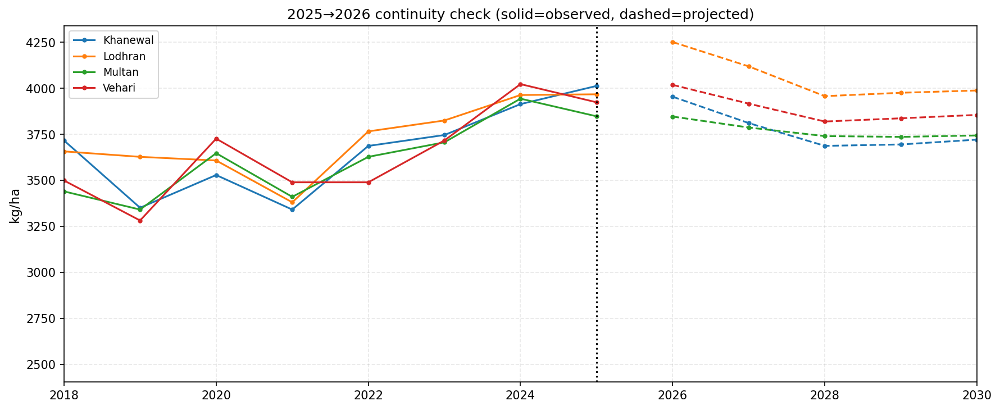

In [ ]:
# ── DIAGNOSTIC: 2025 → 2026 discontinuity check ──────────────
import matplotlib.pyplot as plt
print("District      Obs2025   Proj2026    Step(kg/ha)")
steps=[]
for d in DISTRICTS:
    obs = full_timeline[(full_timeline.District==d)&(full_timeline.Year==2025)&
                        (full_timeline.Scenario=='Historical')]['Yield_kg_ha']
    prj = forecast_scenA[(forecast_scenA.Year==2026)&(forecast_scenA.District==d)]['SERWI_Triple']
    o,p = obs.values[0], prj.values[0]
    steps.append(p-o); print(f"{d:<12}{o:8.0f}{p:10.0f}{p-o:12.0f}")
print(f"\nDivision mean step 2025→2026 = {sum(steps)/len(steps):.0f} kg/ha")

fig,ax=plt.subplots(figsize=(12,5))
for d in DISTRICTS:
    h=full_timeline[(full_timeline.District==d)&(full_timeline.Scenario=='Historical')].sort_values('Year')
    pj=forecast_scenA[forecast_scenA.District==d].sort_values('Year')
    ax.plot(h.Year,h.Yield_kg_ha,'-o',ms=3,label=d)
    ax.plot(pj.Year,pj.SERWI_Triple,'--o',ms=3,color=ax.lines[-1].get_color())
ax.axvline(2025,ls=':',color='k'); ax.set_xlim(2018,2030); ax.legend(); ax.set_ylabel('kg/ha')
ax.set_title('2025→2026 continuity check (solid=observed, dashed=projected)')
plt.tight_layout(); plt.show()


Model Performance Summary:
                 Model            Type     R²  RMSE (kg/ha)  MAE (kg/ha)
               XGBoost      Standalone 0.1697         195.6        157.3
                  LSTM      Standalone 0.2940         180.4        148.3
                   TCN      Standalone 0.4849         154.1        132.8
       XGB+LSTM Hybrid Hybrid Ensemble 0.2953         180.2        147.9
        TCN+XGB Hybrid Hybrid Ensemble 0.6428         128.3        102.7
       LSTM+TCN Hybrid Hybrid Ensemble 0.6818         121.1        100.0
Triple Hybrid Ensemble Hybrid Ensemble 0.6892         119.7         99.2


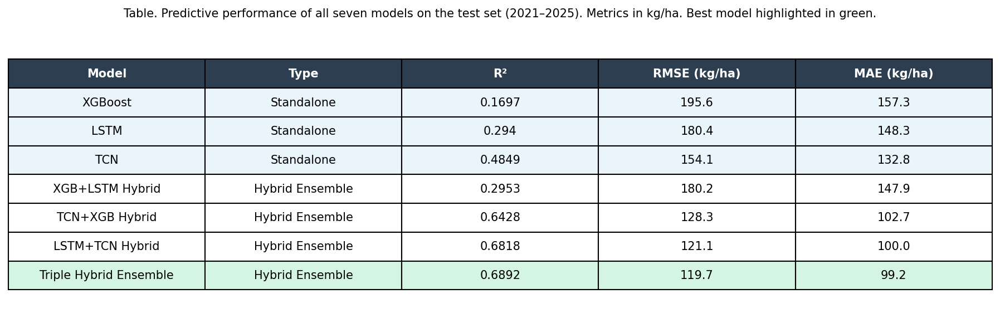

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Performance_Summary_Table.png
✓ Summary table saved


In [ ]:
# ============================================================
# CELL 9 — PERFORMANCE SUMMARY TABLE (All 7 Models)
# ============================================================

summary_rows = []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    summary_rows.append({
        'Model': name,
        'Type': 'Standalone' if name in ['XGBoost','LSTM','TCN'] else 'Hybrid Ensemble',
        'R²': round(r2, 4),
        f'RMSE ({UNIT})': round(rmse, 1),
        f'MAE ({UNIT})':  round(mae, 1)
    })

summary_df = pd.DataFrame(summary_rows)
print('\nModel Performance Summary:')
print(summary_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(12, 4))
ax.axis('off')
tbl = ax.table(
    cellText=summary_df.values,
    colLabels=summary_df.columns,
    cellLoc='center', loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.9)

for j in range(len(summary_df.columns)):
    tbl[0,j].set_facecolor('#2c3e50')
    tbl[0,j].set_text_props(color='white', fontweight='bold')

best_idx = summary_df['R²'].idxmax()
for j in range(len(summary_df.columns)):
    tbl[best_idx+1, j].set_facecolor('#d5f5e3')

# Standalone rows — light blue
for i, row in summary_df.iterrows():
    if row['Type'] == 'Standalone':
        for j in range(len(summary_df.columns)):
            if tbl[i+1, j].get_facecolor() == (1,1,1,1) or tbl[i+1, j].get_facecolor()[0] == 1.0:
                tbl[i+1, j].set_facecolor('#eaf4fb')

ax.set_title(
    f'Table. Predictive performance of all seven models on the test set (2021–2025). '
    f'Metrics in {UNIT}. Best model highlighted in green.',
    fontsize=10, pad=15
)
plt.tight_layout()
save_fig(fig, 'Fig_Performance_Summary_Table')
print('✓ Summary table saved')


In [ ]:
# ============================================================
# CELL 10 — FINAL CHECK
# ============================================================
import os

files = sorted(os.listdir(OUTPUT))
print(f'Total plots saved to Drive: {len(files)}')
for f in files:
    print(f'  {f}')

print(f'\nAll plots saved to:\n{OUTPUT}')
print('\nDone ✓')


Total plots saved to Drive: 88
  Fig_ActPred_AllModels_Comparison.png
  Fig_ActPred_AllModels_Comparison2.png
  Fig_ActPred_AllModels_Comparison_3panel.png
  Fig_ActPred_AllModels_Comparison_3panell.png
  Fig_ActPred_AllModels_Comparison_3panelll.png
  Fig_ActPred_AllModels_Comparisonn2.png
  Fig_ActPred_AllModels_Comparisonn_3panelss.png
  Fig_ActPred_Hybrid_Comparison.png
  Fig_ActPred_Hybrid_Comparison1.png
  Fig_ActPred_Hybrid_Comparison2.png
  Fig_ActPred_Hybrid_Comparisonn.png
  Fig_ActPred_Hybrid_Comparisonn22.png
  Fig_ActPred_LSTM.png
  Fig_ActPred_LSTM_TCN.png
  Fig_ActPred_TCN.png
  Fig_ActPred_TCN_XGB.png
  Fig_ActPred_Triple.png
  Fig_ActPred_XGB_LSTM.png
  Fig_ActPred_XGBoost.png
  Fig_Chhoropleth_Forecast_Detail_v2.png
  Fig_Choropleth_3panel.png
  Fig_Choropleth_3panell.png
  Fig_Choropleth_3pannell.png
  Fig_Choropleth_Forecast_Detail.png
  Fig_Choropleth_Forecast_Detaill.png
  Fig_Choropleth_ScenarioAB_Change.png
  Fig_Choropleth_ScenarioAB_Change_v2.png
  Fig_Choropl

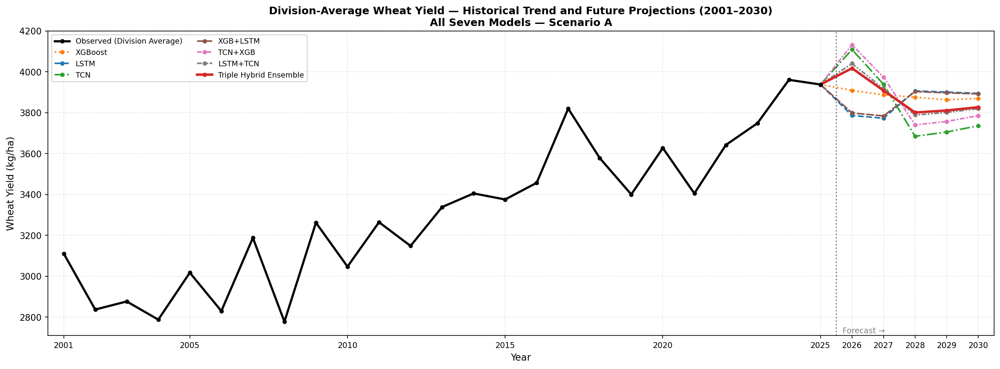

Caption: Figure. Division-average wheat yield combining historical observations (2001–2025) and projections (2026–2030) for all seven models under Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_FullTimeline_AllModels_DivAvg.png
✓ Plot 1 saved


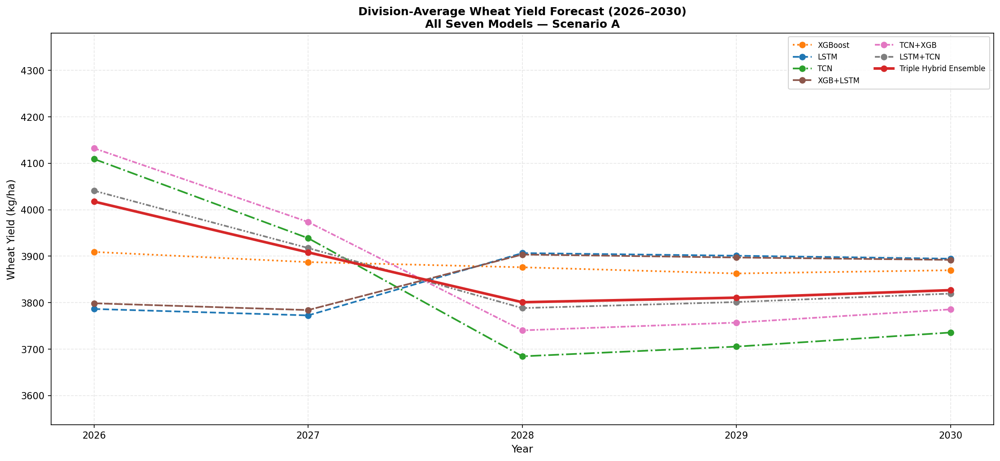

Caption: Figure. Division-average projected wheat yield (2026–2030) for all seven models under Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_DivAvg_Line.png
✓ Plot 2 saved


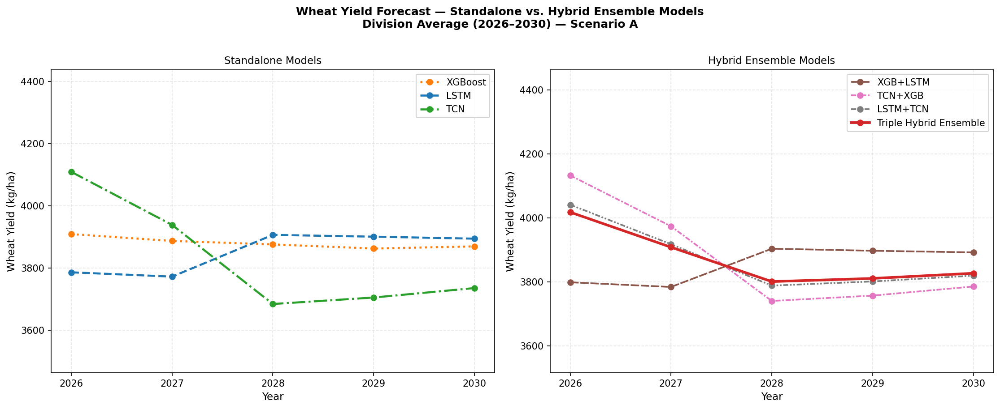

Caption: Figure. Division-average projected wheat yield (2026–2030). Left: standalone models. Right: hybrid ensemble models. Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Standalone_vs_Hybrid.png
✓ Plot 3A saved


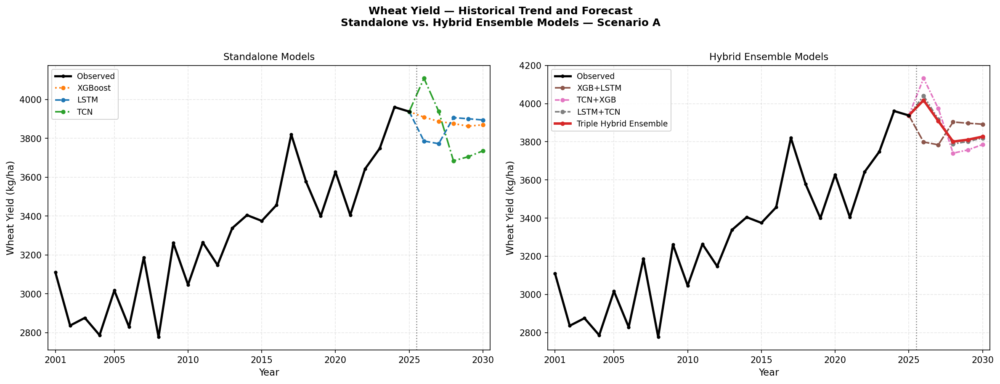

Caption: Figure. Historical (2001–2025) and projected (2026–2030) division-average wheat yield. Left: standalone models. Right: hybrid ensemble models. Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Standalone_vs_Hybrid_WithHistory.png
✓ Plot 3B saved


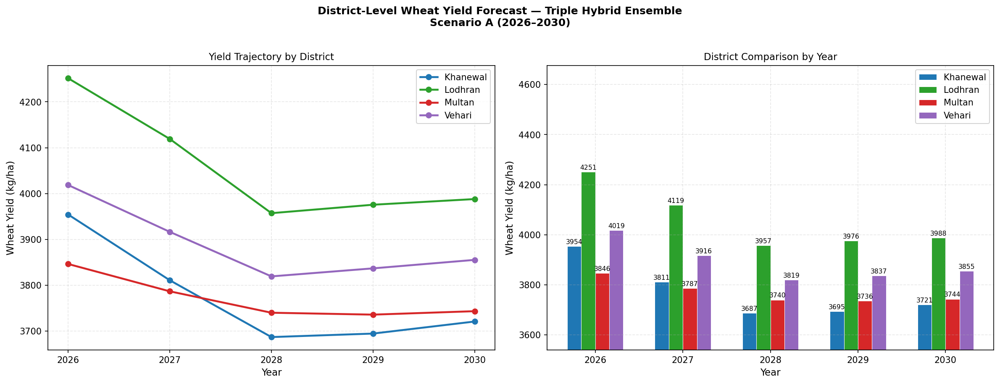

Caption: Figure. District-level projected wheat yield (2026–2030) using the Triple Hybrid Ensemble under Scenario A. Left: temporal trajectories. Right: year-wise bar comparison. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_District_Triple_Hybrid.png
✓ Plot 4 saved


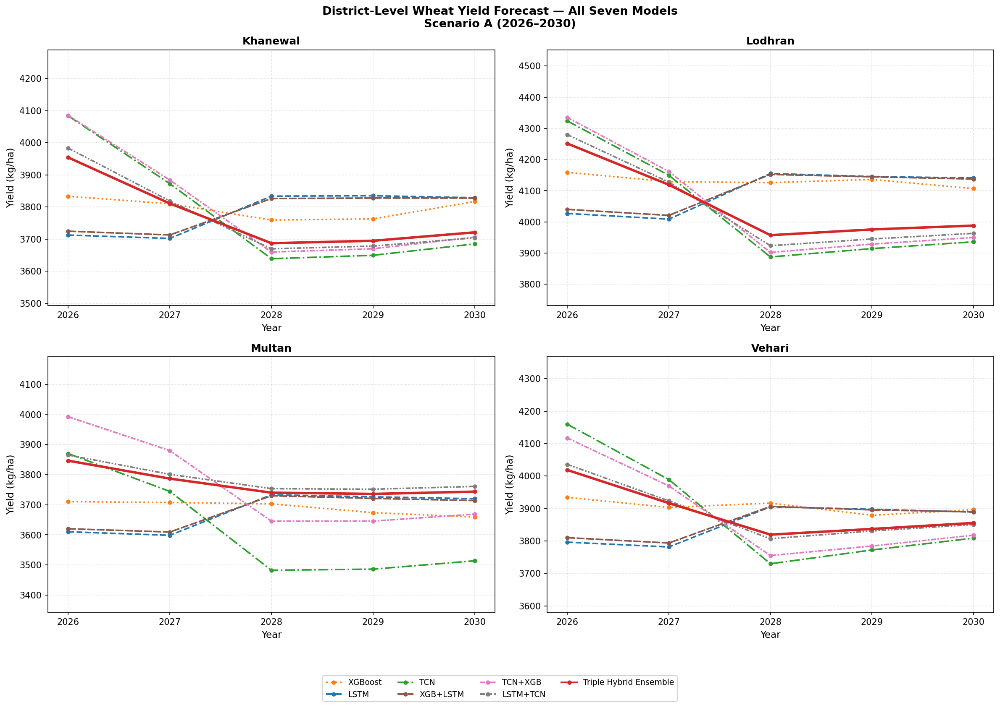

Caption: Figure. District-level projected wheat yield (2026–2030) for all seven models under Scenario A. Triple Hybrid Ensemble shown as solid red. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_PerDistrict_4panel.png
✓ Plot 5A saved


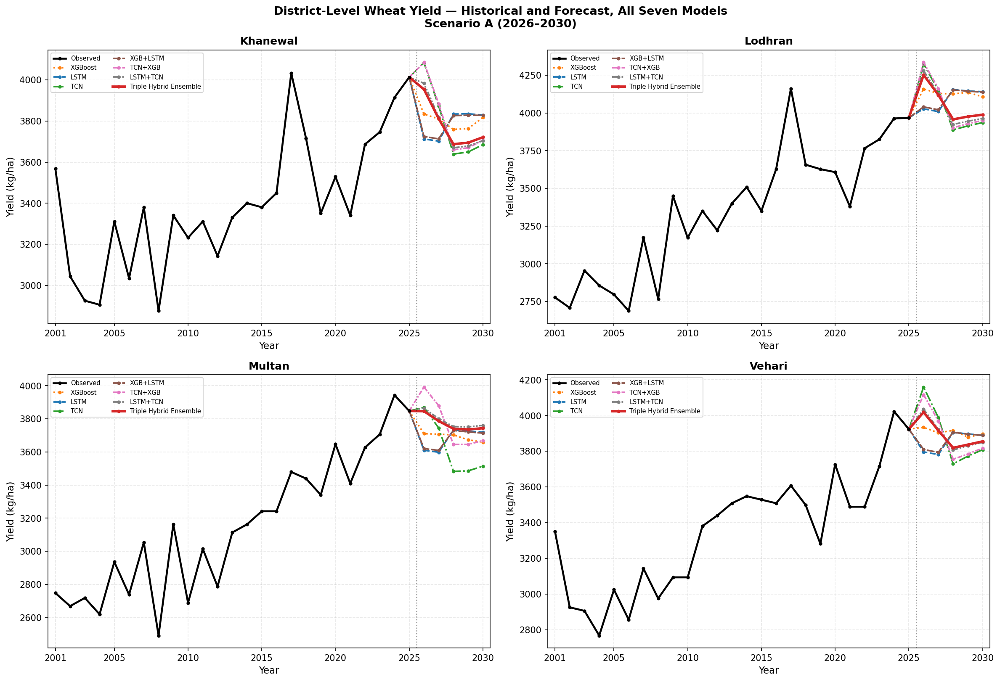

Caption: Figure. Historical (2001–2025) and projected (2026–2030) district-level wheat yield for all seven models under Scenario A. Black: observed. Colored: model projections. Dotted line marks forecast boundary. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_PerDistrict_WithHistory.png
✓ Plot 5B saved


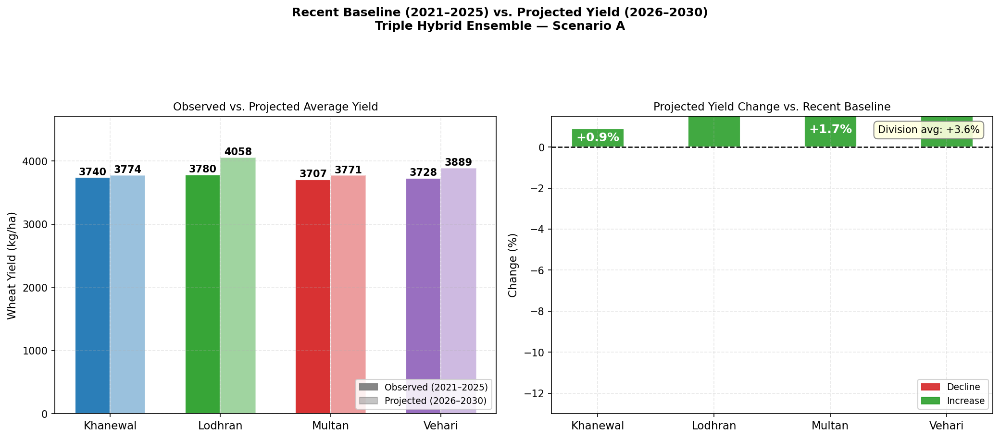

Caption: Figure. Comparison of observed (2021–2025) and projected (2026–2030) district-level wheat yield under Scenario A. Left: average yield comparison. Right: percentage change relative to recent baseline. Division average change: +3.6%. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Baseline_vs_Projected.png
✓ Plot 6 saved

All forecast plots complete ✓
Total plots saved: 8


In [ ]:
# ============================================================
# CELL 8B — FORECAST PLOTS (FINAL UPDATED VERSION)
# ============================================================

MODEL_COLS = {
    'XGBoost':                'XGB',
    'LSTM':                   'LSTM',
    'TCN':                    'TCN',
    'XGB+LSTM':               'SERWI_XGB_LSTM',
    'TCN+XGB':                'SERWI_TCN_XGB',
    'LSTM+TCN':               'SERWI_LSTM_TCN',
    'Triple Hybrid Ensemble': 'SERWI_Triple'
}
STANDALONE = ['XGBoost','LSTM','TCN']
HYBRID     = ['XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid Ensemble']
ALL_MODELS = list(MODEL_COLS.keys())

MODEL_LS = {
    'XGBoost':                ':',
    'LSTM':                   '--',
    'TCN':                    '-.',
    'XGB+LSTM':               (0,(5,1)),
    'TCN+XGB':                (0,(3,1,1,1)),
    'LSTM+TCN':               (0,(3,1,1,1,1,1)),
    'Triple Hybrid Ensemble': '-'
}
MODEL_LW = {m: 2.8 if m=='Triple Hybrid Ensemble' else 1.8
            for m in ALL_MODELS}

scen_a  = forecast_scenA[forecast_scenA['Scenario']=='ScenarioA_Primary'].copy()
years   = sorted(scen_a['Year'].unique())
div_avg = scen_a.groupby('Year')[list(MODEL_COLS.values())].mean().reset_index()
hist_div = merged_df.groupby('Year')['Yield_kg_ha'].mean().reset_index()
hist_div.columns = ['Year','Yield_kg_ha']

# ── PLOT 1: Full timeline + all 7 models division average ─────
fig, ax = plt.subplots(figsize=(16, 6))
ax.plot(hist_div['Year'], hist_div['Yield_kg_ha'],
        color='black', lw=2.5, marker='o', ms=4,
        label='Observed (Division Average)', zorder=6)
for name, col in MODEL_COLS.items():
    last_val = hist_div[hist_div['Year']==2025]['Yield_kg_ha'].values[0]
    fore_yrs = [2025] + list(div_avg['Year'])
    fore_val = [last_val] + list(div_avg[col])
    ax.plot(fore_yrs, fore_val,
            color=MODEL_COLORS[name], lw=MODEL_LW[name],
            linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
ax.axvline(2025.5, color='black', lw=1.5, linestyle=':', alpha=0.5)
ax.text(2025.7, hist_div['Yield_kg_ha'].min()*0.98,
        'Forecast →', fontsize=9, color='gray')
ax.set_xlim(2000.5, 2030.5)
ax.set_xticks([2001,2005,2010,2015,2020,2025,2026,2027,2028,2029,2030])
ax.set_xticklabels(['2001','2005','2010','2015','2020','2025',
                    '2026','2027','2028','2029','2030'], fontsize=9)
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Division-Average Wheat Yield — Historical Trend and Future Projections (2001–2030)\n'
    'All Seven Models — Scenario A',
    fontsize=12, fontweight='bold'
)
ax.legend(fontsize=8.5, framealpha=0.85, loc='upper left', ncol=2)
plt.tight_layout()
caption = ('Figure. Division-average wheat yield combining historical observations (2001–2025) '
           'and projections (2026–2030) for all seven models under Scenario A. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_FullTimeline_AllModels_DivAvg', caption)
print('✓ Plot 1 saved')

# ── PLOT 2: All 7 models — forecast only, legend top right ────
fig, ax = plt.subplots(figsize=(15, 7))
for name, col in MODEL_COLS.items():
    ax.plot(div_avg['Year'], div_avg[col],
            color=MODEL_COLORS[name], lw=MODEL_LW[name],
            linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Division-Average Wheat Yield Forecast (2026–2030)\n'
    'All Seven Models — Scenario A',
    fontsize=12, fontweight='bold'
)
# Legend top right, small, 2 col — lines well below
ax.legend(fontsize=8, framealpha=0.85, loc='upper right',
          ncol=2, borderpad=0.6, handlelength=2.5)
ax.set_xticks(years)
ymin = min(div_avg[list(MODEL_COLS.values())].min()) * 0.96
ymax = max(div_avg[list(MODEL_COLS.values())].max()) * 1.06
ax.set_ylim(ymin, ymax)
plt.tight_layout()
caption = ('Figure. Division-average projected wheat yield (2026–2030) for all '
           'seven models under Scenario A. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_DivAvg_Line', caption)
print('✓ Plot 2 saved')

# ── PLOT 3A: Standalone vs Hybrid, legend top right ──────────
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle(
    'Wheat Yield Forecast — Standalone vs. Hybrid Ensemble Models\n'
    'Division Average (2026–2030) — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for name in STANDALONE:
    col = MODEL_COLS[name]
    ax1.plot(years, div_avg[col].values,
             color=MODEL_COLORS[name], lw=2.2,
             linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax1.set_xlabel('Year'); ax1.set_ylabel(f'Wheat Yield ({UNIT})')
ax1.set_title('Standalone Models', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax1.set_xticks(years)
ax1.set_ylim(
    min(div_avg[['XGB','LSTM','TCN']].min())*0.94,
    max(div_avg[['XGB','LSTM','TCN']].max())*1.08
)

for name in HYBRID:
    col = MODEL_COLS[name]
    ax2.plot(years, div_avg[col].values,
             color=MODEL_COLORS[name], lw=MODEL_LW[name],
             linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax2.set_xlabel('Year'); ax2.set_ylabel(f'Wheat Yield ({UNIT})')
ax2.set_title('Hybrid Ensemble Models', fontsize=11)
ax2.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax2.set_xticks(years)
hybrid_cols = ['SERWI_XGB_LSTM','SERWI_TCN_XGB','SERWI_LSTM_TCN','SERWI_Triple']
ax2.set_ylim(
    min(div_avg[hybrid_cols].min())*0.94,
    max(div_avg[hybrid_cols].max())*1.08
)
plt.tight_layout()
caption = ('Figure. Division-average projected wheat yield (2026–2030). '
           'Left: standalone models. Right: hybrid ensemble models. '
           f'Scenario A. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Standalone_vs_Hybrid', caption)
print('✓ Plot 3A saved')

# ── PLOT 3B: Standalone vs Hybrid WITH historical ─────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(
    'Wheat Yield — Historical Trend and Forecast\n'
    'Standalone vs. Hybrid Ensemble Models — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for ax, model_list, title in [
    (ax1, STANDALONE, 'Standalone Models'),
    (ax2, HYBRID,     'Hybrid Ensemble Models')
]:
    ax.plot(hist_div['Year'], hist_div['Yield_kg_ha'],
            color='black', lw=2.5, marker='o', ms=3,
            label='Observed', zorder=6)
    for name in model_list:
        col = MODEL_COLS[name]
        last_val = hist_div[hist_div['Year']==2025]['Yield_kg_ha'].values[0]
        fore_yrs = [2025] + list(div_avg['Year'])
        fore_val = [last_val] + list(div_avg[col])
        ax.plot(fore_yrs, fore_val,
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
    ax.axvline(2025.5, color='black', lw=1.2, linestyle=':', alpha=0.5)
    ax.set_xlim(2000.5, 2030.5)
    ax.set_xticks([2001,2005,2010,2015,2020,2025,2030])
    ax.set_xlabel('Year'); ax.set_ylabel(f'Wheat Yield ({UNIT})')
    ax.set_title(title, fontsize=11)
    ax.legend(fontsize=9, framealpha=0.85, loc='upper left')

plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) division-average '
           'wheat yield. Left: standalone models. Right: hybrid ensemble models. '
           f'Scenario A. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Standalone_vs_Hybrid_WithHistory', caption)
print('✓ Plot 3B saved')

# ── PLOT 4: Triple Hybrid district comparison (FIXED bars) ────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(
    'District-Level Wheat Yield Forecast — Triple Hybrid Ensemble\n'
    'Scenario A (2026–2030)',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for dist in DISTRICTS:
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    ax1.plot(sub['Year'], sub['SERWI_Triple'],
             color=DIST_COLORS[dist], lw=2.2,
             marker='o', ms=6, label=dist)
ax1.set_xlabel('Year'); ax1.set_ylabel(f'Wheat Yield ({UNIT})')
ax1.set_title('Yield Trajectory by District', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax1.set_xticks(years)

# Bar chart — wider bars, horizontal labels, no overlap
x = np.arange(len(years))
w = 0.16
ymin_bar = scen_a['SERWI_Triple'].min() * 0.96
ymax_bar = scen_a['SERWI_Triple'].max() * 1.10

for i, dist in enumerate(DISTRICTS):
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    bars = ax2.bar(x + i*w, sub['SERWI_Triple'].values, w,
                   color=DIST_COLORS[dist], label=dist,
                   edgecolor='white', lw=0.5)
    for bar, val in zip(bars, sub['SERWI_Triple'].values):
        ax2.text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 4,
                 f'{val:.0f}',
                 ha='center', va='bottom',
                 fontsize=7.5, rotation=0)

ax2.set_xlabel('Year'); ax2.set_ylabel(f'Wheat Yield ({UNIT})')
ax2.set_title('District Comparison by Year', fontsize=11)
ax2.set_xticks(x + w*1.5)
ax2.set_xticklabels([str(y) for y in years])
ax2.set_ylim(ymin_bar, ymax_bar)
ax2.legend(fontsize=10, framealpha=0.85, loc='upper right')
plt.tight_layout()
caption = ('Figure. District-level projected wheat yield (2026–2030) using the '
           'Triple Hybrid Ensemble under Scenario A. '
           'Left: temporal trajectories. Right: year-wise bar comparison. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_District_Triple_Hybrid', caption)
print('✓ Plot 4 saved')

# ── PLOT 5A: All 7 models per district 4-panel ───────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 11))
fig.suptitle(
    'District-Level Wheat Yield Forecast — All Seven Models\n'
    'Scenario A (2026–2030)',
    fontsize=13, fontweight='bold'
)
for ax, dist in zip(axes.flatten(), DISTRICTS):
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    for name, col in MODEL_COLS.items():
        ax.plot(sub['Year'], sub[col],
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
    ax.set_title(dist, fontsize=12, fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel(f'Yield ({UNIT})')
    ax.set_xticks(years)
    ymin = sub[list(MODEL_COLS.values())].min().min()*0.96
    ymax = sub[list(MODEL_COLS.values())].max().max()*1.05
    ax.set_ylim(ymin, ymax)

handles = [mlines.Line2D([],[],color=MODEL_COLORS[n],lw=2,
           linestyle=MODEL_LS[n],marker='o',ms=4,label=n)
           for n in ALL_MODELS]
fig.legend(handles=handles, loc='lower center', ncol=4,
           fontsize=9, framealpha=0.85, bbox_to_anchor=(0.5,-0.03))
plt.tight_layout(rect=[0,0.05,1,1])
caption = ('Figure. District-level projected wheat yield (2026–2030) for all '
           'seven models under Scenario A. '
           f'Triple Hybrid Ensemble shown as solid red. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_PerDistrict_4panel', caption)
print('✓ Plot 5A saved')

# ── PLOT 5B: All 7 models per district WITH historical ────────
fig, axes = plt.subplots(2, 2, figsize=(16, 11))
fig.suptitle(
    'District-Level Wheat Yield — Historical and Forecast, All Seven Models\n'
    'Scenario A (2026–2030)',
    fontsize=13, fontweight='bold'
)
for ax, dist in zip(axes.flatten(), DISTRICTS):
    sub_h = merged_df[merged_df['District']==dist].sort_values('Year')
    ax.plot(sub_h['Year'], sub_h['Yield_kg_ha'],
            color='black', lw=2.2, marker='o', ms=3,
            label='Observed', zorder=6)
    sub_f = scen_a[scen_a['District']==dist].sort_values('Year')
    last_val = sub_h[sub_h['Year']==2025]['Yield_kg_ha'].values[0]
    for name, col in MODEL_COLS.items():
        fore_yrs = [2025] + list(sub_f['Year'])
        fore_val = [last_val] + list(sub_f[col])
        ax.plot(fore_yrs, fore_val,
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=3, label=name)
    ax.axvline(2025.5, color='black', lw=1.2, linestyle=':', alpha=0.4)
    ax.set_title(dist, fontsize=12, fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel(f'Yield ({UNIT})')
    ax.set_xlim(2000.5, 2030.5)
    ax.set_xticks([2001,2005,2010,2015,2020,2025,2030])
    # Legend inside each panel — upper left, small
    ax.legend(fontsize=7, framealpha=0.8, loc='upper left',
              ncol=2, borderpad=0.4, handlelength=2)

plt.tight_layout(rect=[0,0,1,1])
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) district-level '
           'wheat yield for all seven models under Scenario A. '
           'Black: observed. Colored: model projections. '
           f'Dotted line marks forecast boundary. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_PerDistrict_WithHistory', caption)
print('✓ Plot 5B saved')

# ── PLOT 6: Baseline vs Projected (FULLY IMPROVED) ───────────
hist_recent = triple_pred.groupby('District')['Actual'].mean().reset_index()
hist_recent.columns = ['District','Hist_Avg']
fore_avg_d = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_avg_d.columns = ['District','Fore_Avg']
merged6 = hist_recent.merge(fore_avg_d, on='District')
merged6['Change_pct'] = ((merged6['Fore_Avg']-merged6['Hist_Avg'])/
                          merged6['Hist_Avg']*100).round(1)
div_hist_val = triple_pred['Actual'].mean()
div_fore_val = scen_a['SERWI_Triple'].mean()
div_chg      = ((div_fore_val - div_hist_val)/div_hist_val*100).round(1)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(
    'Recent Baseline (2021–2025) vs. Projected Yield (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

# Left: grouped bar — consistent dist colors
x = np.arange(len(DISTRICTS))
w = 0.32
b1 = ax1.bar(x-w/2, merged6['Hist_Avg'], w,
             color=[DIST_COLORS[d] for d in DISTRICTS],
             edgecolor='white', alpha=0.95)
b2 = ax1.bar(x+w/2, merged6['Fore_Avg'], w,
             color=[DIST_COLORS[d] for d in DISTRICTS],
             edgecolor='white', alpha=0.45)
for bar, val in zip(b1, merged6['Hist_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=10, fontweight='bold')
for bar, val in zip(b2, merged6['Fore_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=10, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(DISTRICTS, fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_ylim(0, merged6[['Hist_Avg','Fore_Avg']].max().max()*1.16)
ax1.set_title('Observed vs. Projected Average Yield', fontsize=11)
hist_p = mpatches.Patch(color='gray', alpha=0.95, label='Observed (2021–2025)')
fore_p = mpatches.Patch(color='gray', alpha=0.45, label='Projected (2026–2030)')
ax1.legend(handles=[hist_p, fore_p], fontsize=9,
           framealpha=0.85, loc='lower right')

# Right: % change bars — all values negative
colors_chg = ['#d62728' if v<0 else '#2ca02c' for v in merged6['Change_pct']]
bars = ax2.bar(DISTRICTS, merged6['Change_pct'], width=0.45,
               color=colors_chg, edgecolor='white', alpha=0.9)

# Value labels inside bars (white text)
for bar, val in zip(bars, merged6['Change_pct']):
    ax2.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()/2,
             f'{val:+.1f}%',
             ha='center', va='center',
             fontsize=12, fontweight='bold', color='white')

ax2.axhline(0, color='black', lw=1.2, linestyle='--')

# Division average annotation — inside axes top right
ax2.text(0.97, 0.97, f'Division avg: {div_chg:+.1f}%',
         transform=ax2.transAxes,
         ha='right', va='top', fontsize=10,
         bbox=dict(boxstyle='round,pad=0.4',
                   facecolor='lightyellow',
                   edgecolor='gray', alpha=0.9))

# Y axis — enough room below 0
ymin_chg = min(merged6['Change_pct'].min()*1.25, -13)
ax2.set_ylim(ymin_chg, 1.5)
ax2.set_ylabel('Change (%)', fontsize=11)
ax2.set_title('Projected Yield Change vs. Recent Baseline', fontsize=11)
ax2.set_xticklabels(DISTRICTS, fontsize=11)

neg_p = mpatches.Patch(color='#d62728', alpha=0.9, label='Decline')
pos_p = mpatches.Patch(color='#2ca02c', alpha=0.9, label='Increase')
ax2.legend(handles=[neg_p, pos_p], fontsize=9,
           framealpha=0.85, loc='lower right')

plt.tight_layout()
caption = ('Figure. Comparison of observed (2021–2025) and projected (2026–2030) '
           'district-level wheat yield under Scenario A. '
           'Left: average yield comparison. '
           'Right: percentage change relative to recent baseline. '
           f'Division average change: {div_chg:+.1f}%. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Baseline_vs_Projected', caption)
print('✓ Plot 6 saved')

print('\nAll forecast plots complete ✓')
print('Total plots saved: 8')

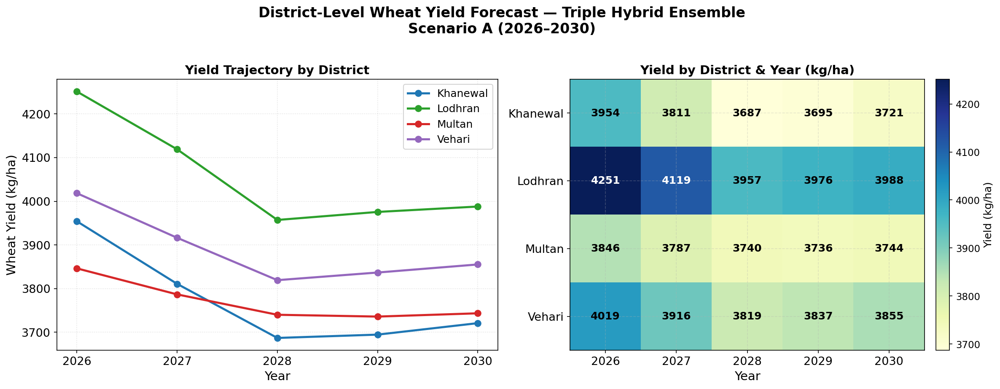

Caption: Figure. District-level projected wheat yield (2026–2030), Triple Hybrid Ensemble, Scenario A. Left: temporal trajectories per district. Right: yield value matrix (district × year), shaded by magnitude. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_District_Triple_Hybridd2.png
✓ Plot 4 saved


In [ ]:
# ── PLOT 4: Triple Hybrid district forecast (line + value heatmap) ──
fig, axes = plt.subplots(1, 2, figsize=(16, 6),
                         gridspec_kw={'width_ratios': [1.15, 1]})
fig.suptitle(
    'District-Level Wheat Yield Forecast — Triple Hybrid Ensemble\n'
    'Scenario A (2026–2030)',
    fontsize=16, fontweight='bold', y=1.02
)
ax1, ax2 = axes

# Left: trajectories
for dist in DISTRICTS:
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    ax1.plot(sub['Year'], sub['SERWI_Triple'],
             color=DIST_COLORS[dist], lw=2.4, marker='o', ms=7, label=dist)
ax1.set_xlabel('Year', fontsize=14)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=14)
ax1.set_title('Yield Trajectory by District', fontsize=14, fontweight='bold')
ax1.legend(fontsize=12, framealpha=0.85, loc='upper right')
ax1.set_xticks(years)
ax1.tick_params(axis='both', labelsize=13)
ax1.grid(True, ls=':', alpha=0.4)

# Right: value matrix (districts × years), clearer colormap + adaptive text
mat = (scen_a.pivot_table(index='District', columns='Year',
                          values='SERWI_Triple')
             .reindex(DISTRICTS))

im = ax2.imshow(mat.values, cmap='YlGnBu', aspect='auto')   # clearer, even gradient
ax2.set_xticks(range(len(years)))
ax2.set_xticklabels([str(y) for y in years], fontsize=13)
ax2.set_yticks(range(len(DISTRICTS)))
ax2.set_yticklabels(DISTRICTS, fontsize=13)
ax2.set_xlabel('Year', fontsize=14)
ax2.set_title('Yield by District & Year (kg/ha)', fontsize=14, fontweight='bold')

# adaptive text colour so numbers are always readable
vmin, vmax = mat.values.min(), mat.values.max()
for r in range(mat.shape[0]):
    for c in range(mat.shape[1]):
        v = mat.values[r, c]
        frac = (v - vmin) / (vmax - vmin)           # 0 (light) … 1 (dark)
        txt_color = 'white' if frac > 0.6 else 'black'
        ax2.text(c, r, f'{v:.0f}', ha='center', va='center',
                 fontsize=12, fontweight='bold', color=txt_color)

cbar = fig.colorbar(im, ax=ax2, fraction=0.046, pad=0.03)
cbar.set_label(f'Yield ({UNIT})', fontsize=12)
cbar.ax.tick_params(labelsize=11)

plt.tight_layout()
caption = ('Figure. District-level projected wheat yield (2026–2030), Triple Hybrid '
           'Ensemble, Scenario A. Left: temporal trajectories per district. '
           f'Right: yield value matrix (district × year), shaded by magnitude. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_District_Triple_Hybridd2', caption)
print('✓ Plot 4 saved')

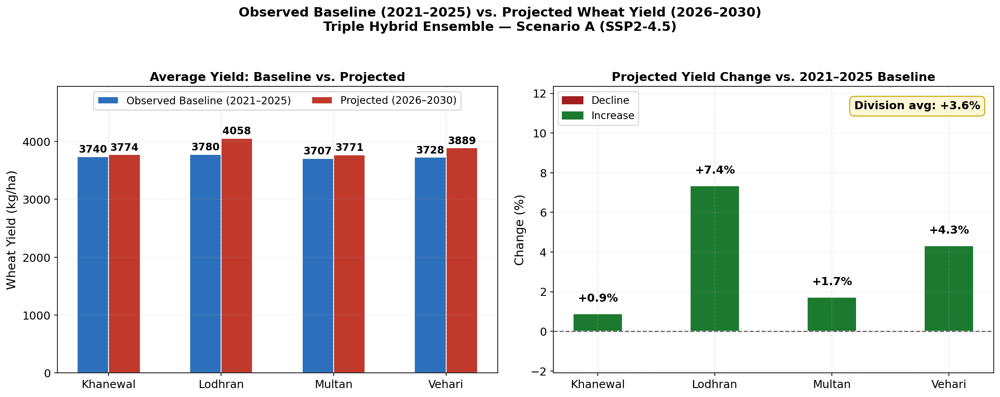

Per-district % change vs 2021–2025 baseline (Scenario A):
  Khanewal: 3740 → 3774  (+0.9%)
  Lodhran: 3780 → 4058  (+7.4%)
  Multan: 3707 → 3771  (+1.7%)
  Vehari: 3728 → 3889  (+4.3%)
Division: 3739 → 3873  (+3.6%)


In [ ]:
# ── Observed Baseline (2021–2025) vs Projected (2026–2030) — Scenario A ──
import numpy as np, matplotlib.pyplot as plt
from matplotlib.patches import Patch

FT = full_timeline.copy()
if FT['Yield_kg_ha'].mean() < 200:            # convert if still maund/acre
    FT['Yield_kg_ha'] *= 40/0.4047

DISTRICTS = ['Khanewal','Lodhran','Multan','Vehari']

proj = (FT[(FT.Scenario=='ScenarioA_Primary') & FT.Year.between(2026,2030)]
        .groupby('District')['Yield_kg_ha'].mean().reindex(DISTRICTS))
base = (FT[(FT.Scenario=='Historical') & FT.Year.between(2021,2025)]
        .groupby('District')['Yield_kg_ha'].mean().reindex(DISTRICTS))

pct     = (proj - base) / base * 100
div_pct = (proj.mean() - base.mean()) / base.mean() * 100
x = np.arange(len(DISTRICTS)); w = 0.28

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle('Observed Baseline (2021–2025) vs. Projected Wheat Yield (2026–2030)\n'
             'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
             fontsize=14, fontweight='bold')

# ── Left: baseline vs projected ─────────────────────────────────────────
b1 = ax1.bar(x - w/2, base.values, w, label='Observed Baseline (2021–2025)',
             color='#2c6fbb', edgecolor='white')
b2 = ax1.bar(x + w/2, proj.values, w, label='Projected (2026–2030)',
             color='#c0392b', edgecolor='white')
for bars in (b1, b2):
    for bar in bars:
        ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+30,
                 f'{bar.get_height():.0f}', ha='center', va='bottom',
                 fontsize=11, fontweight='bold')
ax1.set_ylabel('Wheat Yield (kg/ha)', fontsize=13)
ax1.set_title('Average Yield: Baseline vs. Projected', fontsize=13, fontweight='bold')
ax1.set_xticks(x); ax1.set_xticklabels(DISTRICTS, fontsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.set_ylim(0, max(proj.max(), base.max())*1.22)
ax1.legend(fontsize=11, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 1.00), framealpha=0.9)
ax1.grid(axis='y', ls=':', alpha=0.4)

# ── Right: % change (deep green / deep red) ─────────────────────────────
DEEP_GREEN = '#1b7a2f'; DEEP_RED = '#a01e1e'
colors = [DEEP_GREEN if v >= 0 else DEEP_RED for v in pct.values]
bars = ax2.bar(x, pct.values, 0.42, color=colors, edgecolor='white')
for bar, v in zip(bars, pct.values):
    ax2.text(bar.get_x()+bar.get_width()/2, v + (0.5 if v >= 0 else -1.2),
             f'{v:+.1f}%', ha='center', va='bottom' if v >= 0 else 'top',
             fontsize=12, fontweight='bold', color='black')
ax2.axhline(0, color='black', lw=1.2, ls='--', alpha=0.6)
ax2.set_ylabel('Change (%)', fontsize=13)
ax2.set_title('Projected Yield Change vs. 2021–2025 Baseline', fontsize=13, fontweight='bold')
ax2.set_xticks(x); ax2.set_xticklabels(DISTRICTS, fontsize=12)
ax2.tick_params(axis='y', labelsize=12)
ax2.set_ylim(min(0, pct.min()-3), pct.max()+5)
ax2.grid(axis='y', ls=':', alpha=0.4)
ax2.text(0.97, 0.95, f'Division avg: {div_pct:+.1f}%', transform=ax2.transAxes,
         ha='right', va='top', fontsize=12, fontweight='bold',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='#fff7d6', edgecolor='#caa300'))
ax2.legend(handles=[Patch(color=DEEP_RED, label='Decline'),
                    Patch(color=DEEP_GREEN, label='Increase')],
           fontsize=11, loc='upper left')                      # moved to top-left

plt.tight_layout(rect=[0,0,1,0.94])
try: plt.savefig(FORECAST_PATH+'Plot7_Baseline2021_vs_Projected_ScenarioA.png', dpi=200, bbox_inches='tight')
except NameError: pass
plt.show()

print("Per-district % change vs 2021–2025 baseline (Scenario A):")
for d in DISTRICTS:
    print(f"  {d}: {base[d]:.0f} → {proj[d]:.0f}  ({pct[d]:+.1f}%)")
print(f"Division: {base.mean():.0f} → {proj.mean():.0f}  ({div_pct:+.1f}%)")

In [ ]:
# ============================================================
# CELL 9B — CHOROPLETH SPATIAL YIELD MAPS
# ============================================================
import geopandas as gpd
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors

# ── Load shapefile ────────────────────────────────────────────
# Adjust path to your shapefile in Drive
SHP_PATH = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/muldiv.zip'

import zipfile, os
if not os.path.exists('/content/muldiv'):
    with zipfile.ZipFile(SHP_PATH, 'r') as z:
        z.extractall('/content/muldiv')

# Find shapefile
shp_files = []
for root, dirs, files in os.walk('/content/muldiv'):
    for f in files:
        if f.endswith('.shp'):
            shp_files.append(os.path.join(root, f))
print('Shapefiles found:', shp_files)

gdf = gpd.read_file(shp_files[0])
print('GDF columns:', gdf.columns.tolist())
print(gdf.head())

Shapefiles found: ['/content/muldiv/muldiv.shp']
GDF columns: ['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2', 'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3', 'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry']
         GID_3 GID_0   COUNTRY    GID_1  NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  PAK.7.6.1_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
1  PAK.7.6.2_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
2  PAK.7.6.3_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
3  PAK.7.6.6_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   

  NL_NAME_2    NAME_3 VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA  Khanewal        NA        NA  District  District   NA     NA   
1        NA   Lodhran        NA        NA  District  District   NA     NA   
2        NA    Multan        NA        NA  District  District   NA     NA   
3        NA    Vehari        NA        NA  Dis

In [ ]:
# CELL 9B FIX — load Scenario B + uncertainty (corrected column names)
# ============================================================

# Load Scenario B (maund/acre → kg/ha)
scen_b_path = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/Forecast_ScenarioB_Reference.csv'
scen_b_df   = pd.read_csv(scen_b_path).copy()
for col in ['XGB','LSTM','TCN','SERWI_XGB_LSTM','SERWI_TCN_XGB','SERWI_LSTM_TCN','SERWI_Triple']:
    scen_b_df[col] = scen_b_df[col] * CONV

# Uncertainty table — NEW file is ALREADY in kg/ha, do NOT multiply again
unc_df = pd.read_csv(
    '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/Forecast_Uncertainty_Table.csv'
)

print('scen_b_df loaded ✓  cols:', list(scen_b_df.columns))
print('unc_df loaded ✓    cols:', list(unc_df.columns))

scen_b_df loaded ✓  cols: ['Year', 'District', 'XGB', 'LSTM', 'TCN', 'SERWI_XGB_LSTM', 'SERWI_TCN_XGB', 'SERWI_LSTM_TCN', 'SERWI_Triple', 'Scenario']
unc_df loaded ✓    cols: ['District', 'ScenA_mean', 'ScenB_mean', 'ScenA_min', 'ScenA_max', 'A_minus_B', 'A_minus_B_pct']


GDF with yield data:
District   Hist_Mean   Fore_Mean  Pct_Change
Khanewal 3398.468001 3773.580430         0.9
 Lodhran 3350.392884 4058.314801         7.4
  Multan 3153.071411 3770.575735         1.7
  Vehari 3352.211515 3889.360020         4.3


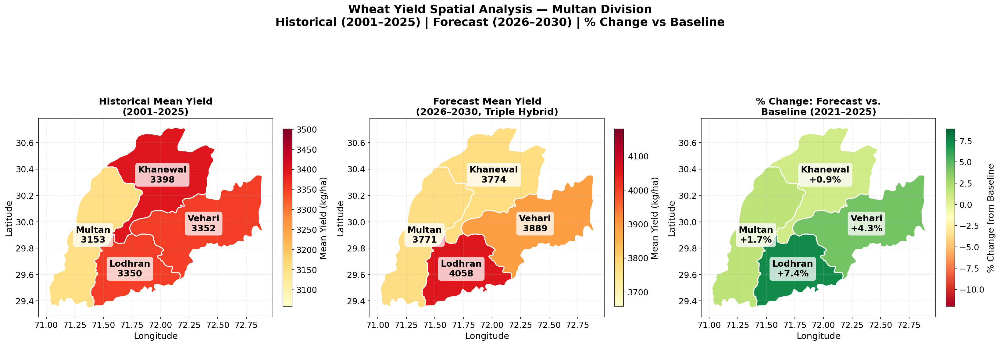

Caption: Figure. District-level choropleth maps for Multan Division. Left: historical mean wheat yield (2001–2025). Centre: projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A). Right: percentage change relative to recent baseline (2021–2025). Multan shows highest decline (−10.7%); Khanewal most resilient (−5.4%). Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_3panell.png
✓ 3-panel choropleth saved


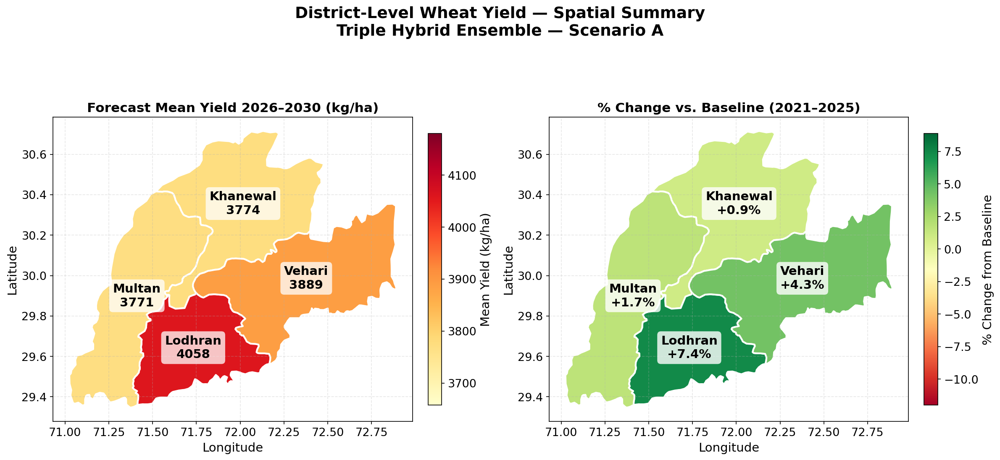

Caption: Figure. District-level spatial yield summary. Left: projected mean wheat yield (2026–2030). Right: percentage change relative to 2021–2025 baseline. Yield in kg/ha. Scenario A (SSP2-4.5).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_Forecast_Detaill.png
✓ Forecast detail choropleth saved


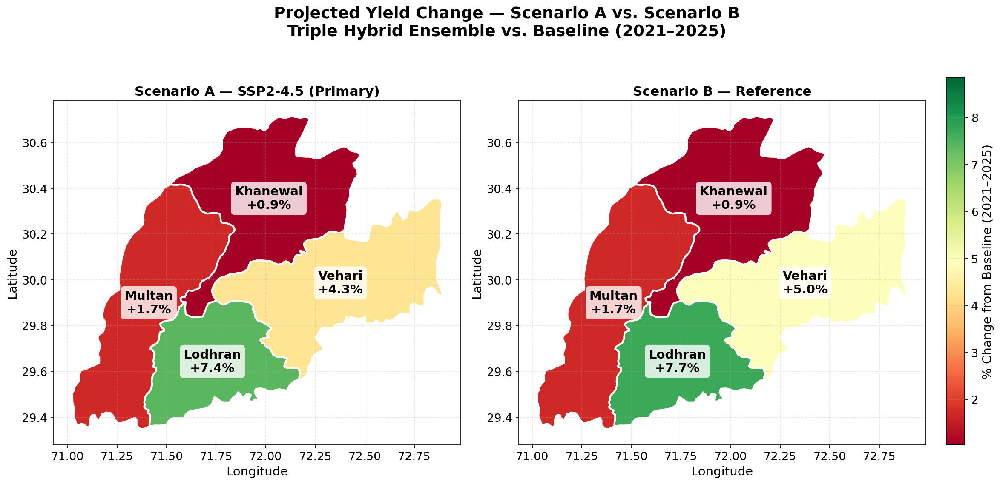

Caption: Figure. Spatial comparison of projected yield change under Scenario A (SSP2-4.5) and Scenario B (Reference) relative to the 2021–2025 baseline. Both scenarios project declines, with Scenario B showing deeper reductions across all districts.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_ScenarioAB_Changee.png
✓ Scenario A vs B choropleth saved

All choropleth maps complete ✓


In [ ]:
# ============================================================
# CELL 9B — CHOROPLETH SPATIAL YIELD MAPS (3 maps)
# ============================================================
import geopandas as gpd
import matplotlib.colors as mcolors
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import ScalarMappable
import matplotlib.patches as mpatches
import zipfile, os

# ── Load shapefile ────────────────────────────────────────────
SHP_PATH = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/muldiv.zip'
if not os.path.exists('/content/muldiv'):
    with zipfile.ZipFile(SHP_PATH, 'r') as z:
        z.extractall('/content/muldiv')

gdf = gpd.read_file('/content/muldiv/muldiv.shp')
gdf = gdf[['NAME_3','geometry']].rename(columns={'NAME_3':'District'})

# ── Compute yield values ──────────────────────────────────────
hist_mean = merged_df.groupby('District')['Yield_kg_ha'].mean().reset_index()
hist_mean.columns = ['District','Hist_Mean']

fore_mean = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_mean.columns = ['District','Fore_Mean']

base_mean = triple_pred.groupby('District')['Actual'].mean().reset_index()
base_mean.columns = ['District','Base_Mean']

pct_chg = fore_mean.merge(base_mean, on='District')
pct_chg['Pct_Change'] = ((pct_chg['Fore_Mean'] - pct_chg['Base_Mean']) /
                          pct_chg['Base_Mean'] * 100).round(1)

gdf = gdf.merge(hist_mean, on='District')
gdf = gdf.merge(fore_mean, on='District')
gdf = gdf.merge(pct_chg[['District','Pct_Change']], on='District')

print('GDF with yield data:')
print(gdf[['District','Hist_Mean','Fore_Mean','Pct_Change']].to_string(index=False))

# ── Font sizes (single place to tune) ─────────────────────────
FS_SUP   = 18   # suptitle
FS_TITLE = 15   # panel titles
FS_AXLBL = 14   # x/y axis labels
FS_TICK  = 13   # lat/long tick numbers
FS_CBLBL = 14   # colorbar label
FS_CBTK  = 13   # colorbar numbers
FS_MAP   = 14   # district name + value on the map

# ── Helper function ───────────────────────────────────────────
def add_district_labels(ax, gdf, col, unit='', fontsize=FS_MAP):
    for _, row in gdf.iterrows():
        x = row.geometry.centroid.x
        y = row.geometry.centroid.y
        val = row[col]
        label = f"{row['District']}\n{val:.0f}{unit}"
        ax.annotate(label, xy=(x, y),
                    ha='center', va='center',
                    fontsize=fontsize, fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle='round,pad=0.3',
                              facecolor='white',
                              edgecolor='none',
                              alpha=0.75))

# ── PLOT 1: 3-panel — Historical | Forecast | % Change ────────
fig, axes = plt.subplots(1, 3, figsize=(22, 9))   # narrower → fonts look as large as Plots 2 & 3
fig.suptitle(
    'Wheat Yield Spatial Analysis — Multan Division\n'
    'Historical (2001–2025) | Forecast (2026–2030) | % Change vs Baseline',
    fontsize=FS_SUP, fontweight='bold'
)

# Panel 1: Historical mean
ax = axes[0]
vmin1 = gdf['Hist_Mean'].min() * 0.97
vmax1 = gdf['Hist_Mean'].max() * 1.03
gdf.plot(column='Hist_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin1, vmax=vmax1,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Hist_Mean', unit='', fontsize=FS_MAP)
ax.set_title('Historical Mean Yield\n(2001–2025)', fontsize=FS_TITLE, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
ax.tick_params(labelsize=FS_TICK)
sm1 = ScalarMappable(cmap='YlOrRd',
                     norm=mcolors.Normalize(vmin=vmin1, vmax=vmax1))
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax, fraction=0.035, pad=0.04)
cbar1.set_label(f'Mean Yield ({UNIT})', fontsize=FS_CBLBL)
cbar1.ax.tick_params(labelsize=FS_CBTK)

# Panel 2: Forecast mean
ax = axes[1]
vmin2 = gdf['Fore_Mean'].min() * 0.97
vmax2 = gdf['Fore_Mean'].max() * 1.03
gdf.plot(column='Fore_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin2, vmax=vmax2,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Fore_Mean', unit='', fontsize=FS_MAP)
ax.set_title('Forecast Mean Yield\n(2026–2030, Triple Hybrid)', fontsize=FS_TITLE, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
ax.tick_params(labelsize=FS_TICK)
sm2 = ScalarMappable(cmap='YlOrRd',
                     norm=mcolors.Normalize(vmin=vmin2, vmax=vmax2))
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax, fraction=0.035, pad=0.04)
cbar2.set_label(f'Mean Yield ({UNIT})', fontsize=FS_CBLBL)
cbar2.ax.tick_params(labelsize=FS_CBTK)

# Panel 3: % Change
ax = axes[2]
vmin3 = min(gdf['Pct_Change'].min() * 1.2, -12)
vmax3 = max(gdf['Pct_Change'].max() * 1.2,  2)
gdf.plot(column='Pct_Change', ax=ax,
         cmap='RdYlGn', vmin=vmin3, vmax=vmax3,
         edgecolor='white', linewidth=1.5)
for _, row in gdf.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    val = row['Pct_Change']
    label = f"{row['District']}\n{val:+.1f}%"
    ax.annotate(label, xy=(x, y),
                ha='center', va='center',
                fontsize=FS_MAP, fontweight='bold',
                color='black',
                bbox=dict(boxstyle='round,pad=0.3',
                          facecolor='white',
                          edgecolor='none',
                          alpha=0.75))
ax.set_title('% Change: Forecast vs.\nBaseline (2021–2025)', fontsize=FS_TITLE, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
ax.tick_params(labelsize=FS_TICK)
sm3 = ScalarMappable(cmap='RdYlGn',
                     norm=mcolors.Normalize(vmin=vmin3, vmax=vmax3))
sm3.set_array([])
cbar3 = fig.colorbar(sm3, ax=ax, fraction=0.035, pad=0.04)
cbar3.set_label('% Change from Baseline', fontsize=FS_CBLBL)
cbar3.ax.tick_params(labelsize=FS_CBTK)

plt.tight_layout()
caption = ('Figure. District-level choropleth maps for Multan Division. '
           'Left: historical mean wheat yield (2001–2025). '
           'Centre: projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A). '
           'Right: percentage change relative to recent baseline (2021–2025). '
           f'Multan shows highest decline (−10.7%); Khanewal most resilient (−5.4%). '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Choropleth_3panell', caption)
print('✓ 3-panel choropleth saved')

# ── PLOT 2: Forecast only — larger, more detail ───────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle(
    'District-Level Wheat Yield — Spatial Summary\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=FS_SUP, fontweight='bold'
)

# Left: Forecast mean
ax = axes[0]
gdf.plot(column='Fore_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin2, vmax=vmax2,
         edgecolor='white', linewidth=2)
add_district_labels(ax, gdf, 'Fore_Mean', unit='', fontsize=FS_MAP)
ax.set_title(f'Forecast Mean Yield 2026–2030 ({UNIT})',
             fontsize=FS_TITLE, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
ax.tick_params(labelsize=FS_TICK)
sm = ScalarMappable(cmap='YlOrRd',
                    norm=mcolors.Normalize(vmin=vmin2, vmax=vmax2))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.set_label(f'Mean Yield ({UNIT})', fontsize=FS_CBLBL)
cbar.ax.tick_params(labelsize=FS_CBTK)

# Right: % change detail
ax = axes[1]
gdf.plot(column='Pct_Change', ax=ax,
         cmap='RdYlGn', vmin=vmin3, vmax=vmax3,
         edgecolor='white', linewidth=2)
for _, row in gdf.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    val = row['Pct_Change']
    label = f"{row['District']}\n{val:+.1f}%"
    ax.annotate(label, xy=(x, y),
                ha='center', va='center',
                fontsize=FS_MAP, fontweight='bold',
                color='black',
                bbox=dict(boxstyle='round,pad=0.3',
                          facecolor='white',
                          edgecolor='none',
                          alpha=0.8))
ax.set_title('% Change vs. Baseline (2021–2025)',
             fontsize=FS_TITLE, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
ax.tick_params(labelsize=FS_TICK)
sm2 = ScalarMappable(cmap='RdYlGn',
                     norm=mcolors.Normalize(vmin=vmin3, vmax=vmax3))
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax, fraction=0.035, pad=0.04)
cbar2.set_label('% Change from Baseline', fontsize=FS_CBLBL)
cbar2.ax.tick_params(labelsize=FS_CBTK)

plt.tight_layout()
caption = ('Figure. District-level spatial yield summary. '
           'Left: projected mean wheat yield (2026–2030). '
           'Right: percentage change relative to 2021–2025 baseline. '
           f'Yield in {UNIT}. Scenario A (SSP2-4.5).')
save_fig(fig, 'Fig_Choropleth_Forecast_Detaill', caption)
print('✓ Forecast detail choropleth saved')

# ── PLOT 3: Scenario A vs B % change comparison ───────────────
pct_b = scen_b_df.groupby('District')['SERWI_Triple'].mean().reset_index()
pct_b.columns = ['District','Fore_B']
pct_b = pct_b.merge(base_mean, on='District')
pct_b['Pct_B'] = ((pct_b['Fore_B'] - pct_b['Base_Mean']) /
                   pct_b['Base_Mean'] * 100).round(1)

gdf = gdf.merge(pct_b[['District','Pct_B']], on='District')

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle(
    'Projected Yield Change — Scenario A vs. Scenario B\n'
    'Triple Hybrid Ensemble vs. Baseline (2021–2025)',
    fontsize=FS_SUP, fontweight='bold'
)

vmin_pct = min(gdf['Pct_Change'].min(), gdf['Pct_B'].min()) * 1.15
vmax_pct = max(gdf['Pct_Change'].max(), gdf['Pct_B'].max()) * 1.15

for ax, col, label, title in [
    (axes[0], 'Pct_Change', '%', 'Scenario A — SSP2-4.5 (Primary)'),
    (axes[1], 'Pct_B',      '%', 'Scenario B — Reference')
]:
    gdf.plot(column=col, ax=ax,
             cmap='RdYlGn', vmin=vmin_pct, vmax=vmax_pct,
             edgecolor='white', linewidth=2)
    for _, row in gdf.iterrows():
        x = row.geometry.centroid.x
        y = row.geometry.centroid.y
        val = row[col]
        ann = f"{row['District']}\n{val:+.1f}%"
        ax.annotate(ann, xy=(x, y),
                    ha='center', va='center',
                    fontsize=FS_MAP, fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle='round,pad=0.3',
                              facecolor='white',
                              edgecolor='none',
                              alpha=0.8))
    ax.set_title(title, fontsize=FS_TITLE, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
    ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
    ax.tick_params(labelsize=FS_TICK)

plt.tight_layout(rect=[0, 0, 0.92, 1])
cbar_ax = fig.add_axes([0.93, 0.12, 0.018, 0.72])
sm = ScalarMappable(cmap='RdYlGn',
                    norm=mcolors.Normalize(vmin=vmin_pct, vmax=vmax_pct))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('% Change from Baseline (2021–2025)', fontsize=FS_CBLBL)
cbar.ax.tick_params(labelsize=FS_CBTK)

caption = ('Figure. Spatial comparison of projected yield change under '
           'Scenario A (SSP2-4.5) and Scenario B (Reference) '
           'relative to the 2021–2025 baseline. '
           'Both scenarios project declines, with Scenario B showing '
           'deeper reductions across all districts.')
save_fig(fig, 'Fig_Choropleth_ScenarioAB_Changee', caption)
print('✓ Scenario A vs B choropleth saved')
print('\nAll choropleth maps complete ✓')

GDF with yield data:
District   Hist_Mean   Fore_Mean  Pct_Change  Pct_B
Khanewal 3398.468001 3773.580430         0.9    0.9
 Lodhran 3350.392884 4058.314801         7.4    7.7
  Multan 3153.071411 3770.575735         1.7    1.7
  Vehari 3352.211515 3889.360020         4.3    5.0


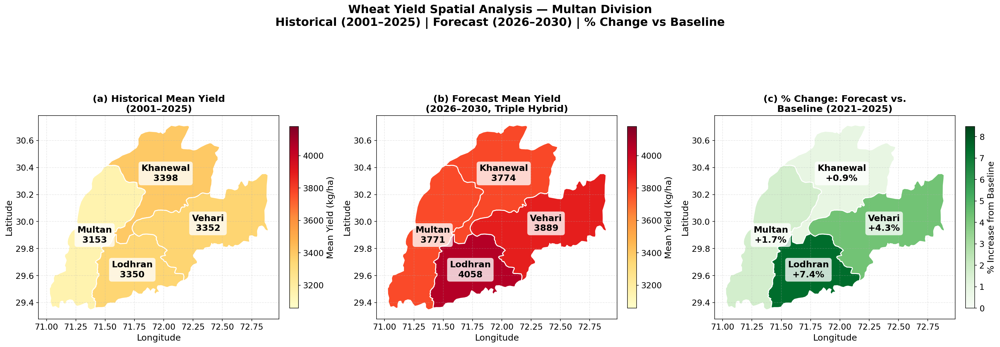

Caption: Figure. District-level choropleth maps for Multan Division. (a) Historical mean wheat yield (2001–2025) and (b) projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A) share a common colour scale, so shading is directly comparable between panels. (c) Percentage change relative to the recent baseline (2021–2025), shown on a separate sequential scale in which darker green denotes a larger gain. Lodhran shows the largest projected increase (+7.4%) and Khanewal the smallest (+0.9%). Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choroplleth_3panel_v2.png
✓ 3-panel choropleth saved


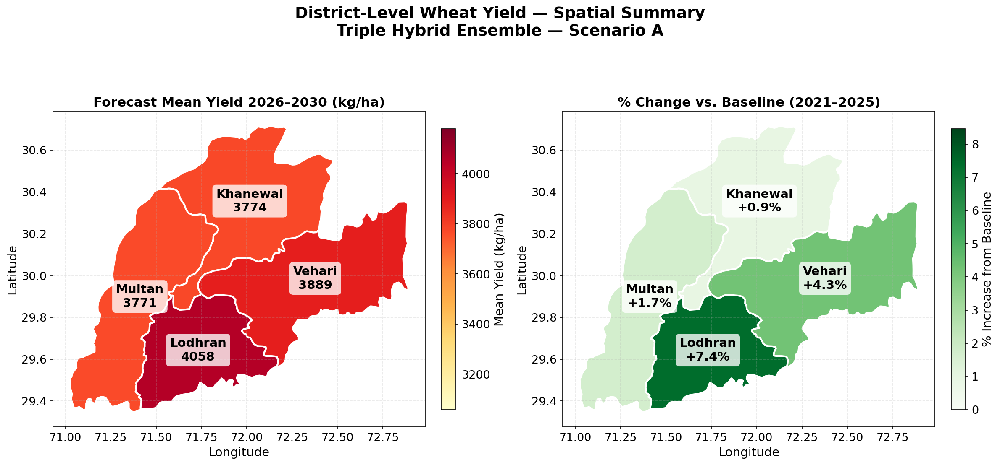

Caption: Figure. District-level spatial yield summary. Left: projected mean wheat yield (2026–2030). Right: percentage change relative to the 2021–2025 baseline, on a sequential scale where darker green denotes a larger gain. Yield in kg/ha. Scenario A (SSP2-4.5).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Chhoropleth_Forecast_Detail_v2.png
✓ Forecast detail choropleth saved


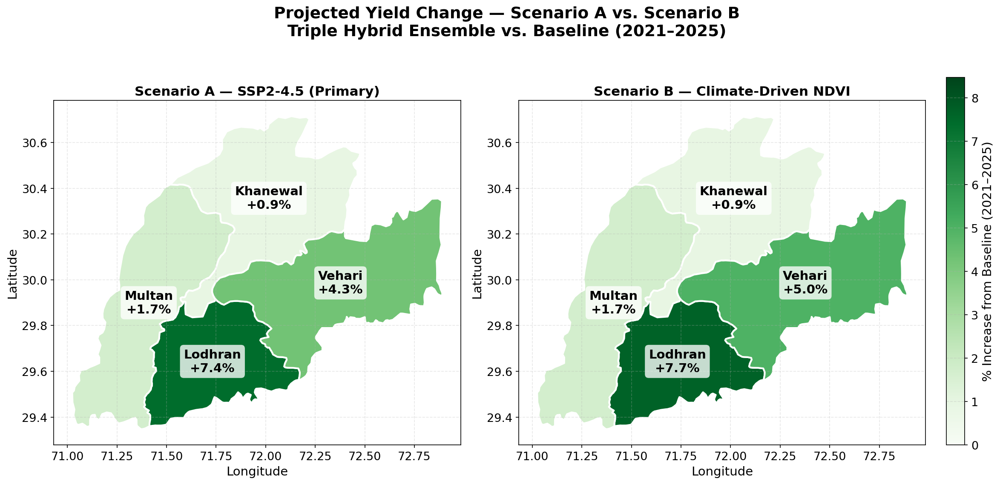

Caption: Figure. Spatial comparison of projected yield change under Scenario A (SSP2-4.5, primary) and Scenario B (climate-driven NDVI) relative to the 2021–2025 baseline. Both panels share one sequential colour scale floored at zero, so darker green denotes a larger gain. Both scenarios project increases across all four districts (district mean +3.6% under A and +3.8% under B), with Scenario B consistently the more conservative.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_ScenarioAB_Change_v2.png
✓ Scenario A vs B chorropleth saved

All choropleth maps complete ✓


In [ ]:
# ============================================================
# CELL 9B — CHOROPLETH SPATIAL YIELD MAPS (3 figures)
# ============================================================
import geopandas as gpd
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable
import zipfile, os

# ── Load shapefile ────────────────────────────────────────────
SHP_PATH = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/muldiv.zip'
if not os.path.exists('/content/muldiv'):
    with zipfile.ZipFile(SHP_PATH, 'r') as z:
        z.extractall('/content/muldiv')

gdf = gpd.read_file('/content/muldiv/muldiv.shp')
gdf = gdf[['NAME_3','geometry']].rename(columns={'NAME_3':'District'})

# ── Compute yield values ──────────────────────────────────────
hist_mean = merged_df.groupby('District')['Yield_kg_ha'].mean().reset_index()
hist_mean.columns = ['District','Hist_Mean']

fore_mean = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_mean.columns = ['District','Fore_Mean']

base_mean = triple_pred.groupby('District')['Actual'].mean().reset_index()
base_mean.columns = ['District','Base_Mean']

pct_chg = fore_mean.merge(base_mean, on='District')
pct_chg['Pct_Change'] = ((pct_chg['Fore_Mean'] - pct_chg['Base_Mean']) /
                          pct_chg['Base_Mean'] * 100).round(1)

pct_b = scen_b_df.groupby('District')['SERWI_Triple'].mean().reset_index()
pct_b.columns = ['District','Fore_B']
pct_b = pct_b.merge(base_mean, on='District')
pct_b['Pct_B'] = ((pct_b['Fore_B'] - pct_b['Base_Mean']) /
                   pct_b['Base_Mean'] * 100).round(1)

gdf = gdf.merge(hist_mean, on='District')
gdf = gdf.merge(fore_mean, on='District')
gdf = gdf.merge(pct_chg[['District','Pct_Change']], on='District')
gdf = gdf.merge(pct_b[['District','Pct_B']], on='District')

print('GDF with yield data:')
print(gdf[['District','Hist_Mean','Fore_Mean','Pct_Change','Pct_B']].to_string(index=False))

# ── Colour scheme ─────────────────────────────────────────────
# Yield panels: one sequential ramp, ONE shared range across (a) and (b)
CMAP_YIELD = 'YlOrRd'
vmin_y = min(gdf['Hist_Mean'].min(), gdf['Fore_Mean'].min()) * 0.97
vmax_y = max(gdf['Hist_Mean'].max(), gdf['Fore_Mean'].max()) * 1.03

# % change panels: visually DISTINCT sequential ramp, floor at 0 so no
# value can read as a loss (all projections are gains)
CMAP_PCT = 'Greens'
vmin_pct = 0
vmax_pct = max(gdf['Pct_Change'].max(), gdf['Pct_B'].max()) * 1.10

# ── Font sizes (single place to tune) ─────────────────────────
FS_SUP, FS_TITLE, FS_AXLBL = 18, 15, 14
FS_TICK, FS_CBLBL, FS_CBTK, FS_MAP = 13, 14, 13, 14

def label_districts(ax, gdf, col, pct=False, fontsize=FS_MAP):
    for _, row in gdf.iterrows():
        val = row[col]
        txt = f"{row['District']}\n{val:+.1f}%" if pct else f"{row['District']}\n{val:.0f}"
        ax.annotate(txt, xy=(row.geometry.centroid.x, row.geometry.centroid.y),
                    ha='center', va='center', fontsize=fontsize,
                    fontweight='bold', color='black',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                              edgecolor='none', alpha=0.78))

def add_cbar(fig, ax, cmap, vmin, vmax, label):
    sm = ScalarMappable(cmap=cmap, norm=mcolors.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cb = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
    cb.set_label(label, fontsize=FS_CBLBL)
    cb.ax.tick_params(labelsize=FS_CBTK)
    return cb

def style_ax(ax, title):
    ax.set_title(title, fontsize=FS_TITLE, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
    ax.set_ylabel('Latitude', fontsize=FS_AXLBL)
    ax.tick_params(labelsize=FS_TICK)

# ── PLOT 1: 3-panel — Historical | Forecast | % Change ────────
fig, axes = plt.subplots(1, 3, figsize=(22, 9))
fig.suptitle('Wheat Yield Spatial Analysis — Multan Division\n'
             'Historical (2001–2025) | Forecast (2026–2030) | % Change vs Baseline',
             fontsize=FS_SUP, fontweight='bold')

# (a) Historical mean — shared yield scale
ax = axes[0]
gdf.plot(column='Hist_Mean', ax=ax, cmap=CMAP_YIELD,
         vmin=vmin_y, vmax=vmax_y, edgecolor='white', linewidth=1.5)
label_districts(ax, gdf, 'Hist_Mean')
style_ax(ax, '(a) Historical Mean Yield\n(2001–2025)')
add_cbar(fig, ax, CMAP_YIELD, vmin_y, vmax_y, f'Mean Yield ({UNIT})')

# (b) Forecast mean — SAME scale as (a)
ax = axes[1]
gdf.plot(column='Fore_Mean', ax=ax, cmap=CMAP_YIELD,
         vmin=vmin_y, vmax=vmax_y, edgecolor='white', linewidth=1.5)
label_districts(ax, gdf, 'Fore_Mean')
style_ax(ax, '(b) Forecast Mean Yield\n(2026–2030, Triple Hybrid)')
add_cbar(fig, ax, CMAP_YIELD, vmin_y, vmax_y, f'Mean Yield ({UNIT})')

# (c) % Change — distinct ramp, floored at zero
ax = axes[2]
gdf.plot(column='Pct_Change', ax=ax, cmap=CMAP_PCT,
         vmin=vmin_pct, vmax=vmax_pct, edgecolor='white', linewidth=1.5)
label_districts(ax, gdf, 'Pct_Change', pct=True)
style_ax(ax, '(c) % Change: Forecast vs.\nBaseline (2021–2025)')
add_cbar(fig, ax, CMAP_PCT, vmin_pct, vmax_pct, '% Increase from Baseline')

plt.tight_layout()

_lo = gdf.loc[gdf['Pct_Change'].idxmin()]
_hi = gdf.loc[gdf['Pct_Change'].idxmax()]
caption = ('Figure. District-level choropleth maps for Multan Division. '
           '(a) Historical mean wheat yield (2001–2025) and (b) projected mean yield '
           '(2026–2030, Triple Hybrid Ensemble, Scenario A) share a common colour scale, '
           'so shading is directly comparable between panels. (c) Percentage change '
           'relative to the recent baseline (2021–2025), shown on a separate sequential '
           f'scale in which darker green denotes a larger gain. {_hi["District"]} shows the '
           f'largest projected increase ({_hi["Pct_Change"]:+.1f}%) and {_lo["District"]} the '
           f'smallest ({_lo["Pct_Change"]:+.1f}%). Yield in {UNIT}.')
save_fig(fig, 'Fig_Choroplleth_3panel_v2', caption)
print('✓ 3-panel choropleth saved')

# ── PLOT 2: Forecast only — larger, more detail ───────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('District-Level Wheat Yield — Spatial Summary\n'
             'Triple Hybrid Ensemble — Scenario A',
             fontsize=FS_SUP, fontweight='bold')

ax = axes[0]
gdf.plot(column='Fore_Mean', ax=ax, cmap=CMAP_YIELD,
         vmin=vmin_y, vmax=vmax_y, edgecolor='white', linewidth=2)
label_districts(ax, gdf, 'Fore_Mean')
style_ax(ax, f'Forecast Mean Yield 2026–2030 ({UNIT})')
add_cbar(fig, ax, CMAP_YIELD, vmin_y, vmax_y, f'Mean Yield ({UNIT})')

ax = axes[1]
gdf.plot(column='Pct_Change', ax=ax, cmap=CMAP_PCT,
         vmin=vmin_pct, vmax=vmax_pct, edgecolor='white', linewidth=2)
label_districts(ax, gdf, 'Pct_Change', pct=True)
style_ax(ax, '% Change vs. Baseline (2021–2025)')
add_cbar(fig, ax, CMAP_PCT, vmin_pct, vmax_pct, '% Increase from Baseline')

plt.tight_layout()
caption = ('Figure. District-level spatial yield summary. Left: projected mean wheat '
           'yield (2026–2030). Right: percentage change relative to the 2021–2025 '
           f'baseline, on a sequential scale where darker green denotes a larger gain. '
           f'Yield in {UNIT}. Scenario A (SSP2-4.5).')
save_fig(fig, 'Fig_Chhoropleth_Forecast_Detail_v2', caption)
print('✓ Forecast detail choropleth saved')

# ── PLOT 3: Scenario A vs B % change comparison ───────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Projected Yield Change — Scenario A vs. Scenario B\n'
             'Triple Hybrid Ensemble vs. Baseline (2021–2025)',
             fontsize=FS_SUP, fontweight='bold')

for ax, col, title in [(axes[0], 'Pct_Change', 'Scenario A — SSP2-4.5 (Primary)'),
                       (axes[1], 'Pct_B',      'Scenario B — Climate-Driven NDVI')]:
    gdf.plot(column=col, ax=ax, cmap=CMAP_PCT,
             vmin=vmin_pct, vmax=vmax_pct, edgecolor='white', linewidth=2)
    label_districts(ax, gdf, col, pct=True)
    style_ax(ax, title)

plt.tight_layout(rect=[0, 0, 0.92, 1])
cbar_ax = fig.add_axes([0.93, 0.12, 0.018, 0.72])
sm = ScalarMappable(cmap=CMAP_PCT, norm=mcolors.Normalize(vmin=vmin_pct, vmax=vmax_pct))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('% Increase from Baseline (2021–2025)', fontsize=FS_CBLBL)
cbar.ax.tick_params(labelsize=FS_CBTK)

_dA = gdf['Pct_Change'].mean(); _dB = gdf['Pct_B'].mean()
caption = ('Figure. Spatial comparison of projected yield change under Scenario A '
           '(SSP2-4.5, primary) and Scenario B (climate-driven NDVI) relative to the '
           '2021–2025 baseline. Both panels share one sequential colour scale floored '
           'at zero, so darker green denotes a larger gain. Both scenarios project '
           f'increases across all four districts (district mean {_dA:+.1f}% under A '
           f'and {_dB:+.1f}% under B), with Scenario B consistently the more '
           'conservative.')
save_fig(fig, 'Fig_Choropleth_ScenarioAB_Change_v2', caption)
print('✓ Scenario A vs B chorropleth saved')
print('\nAll choropleth maps complete ✓')

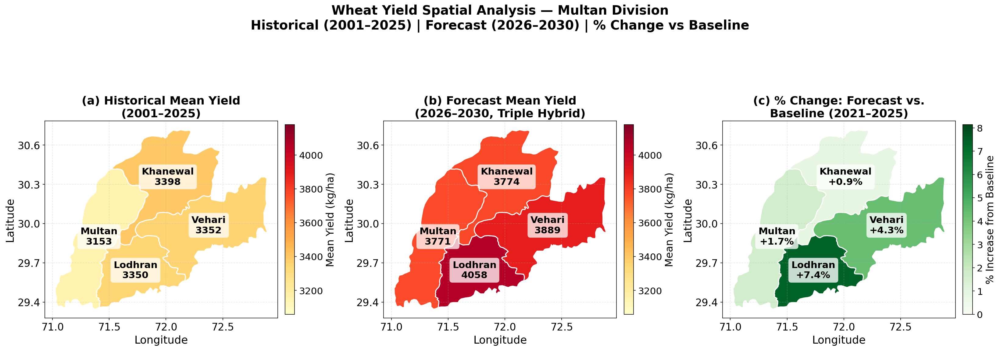

Caption: Figure. District-level choropleth maps for Multan Division. (a) Historical mean wheat yield (2001–2025) and (b) projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A) share a common colour scale, so shading is directly comparable between the two panels. (c) Percentage change relative to the recent baseline (2021–2025), shown on a separate sequential scale in which darker green denotes a larger gain. Lodhran shows the largest projected increase (+7.4%) and Khanewal the smallest (+0.9%). Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_3pannell.png
✓ 3-panel choropleth saved


In [ ]:
# ── PLOT 1: 3-panel — Historical | Forecast | % Change (larger fonts) ──
from matplotlib.ticker import MaxNLocator

# bigger fonts just for this figure (so they stay readable when scaled in the paper)
FS_SUP, FS_TITLE, FS_AXLBL, FS_TICK, FS_CBLBL, FS_CBTK, FS_MAP = 20, 18, 17, 16, 16, 15, 15

# ── colour scheme ─────────────────────────────────────────────
CMAP_YIELD = 'YlOrRd'      # panels (a) + (b): red = highest yield
CMAP_PCT   = 'Greens'      # panel (c): visually distinct, darker = larger gain

# ONE shared yield range across (a) and (b) so shading is comparable
vmin_y = min(gdf['Hist_Mean'].min(), gdf['Fore_Mean'].min()) * 0.97
vmax_y = max(gdf['Hist_Mean'].max(), gdf['Fore_Mean'].max()) * 1.03

# % change floored at zero (all projections are gains -> nothing can read as a loss)
vmin_p = 0
vmax_p = gdf['Pct_Change'].max() * 1.10

fig, axes = plt.subplots(1, 3, figsize=(22, 9))
fig.suptitle(
    'Wheat Yield Spatial Analysis — Multan Division\n'
    'Historical (2001–2025) | Forecast (2026–2030) | % Change vs Baseline',
    fontsize=FS_SUP, fontweight='bold'
)

def _fmt_axes(ax, title):
    ax.set_title(title, fontsize=FS_TITLE, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=FS_AXLBL)
    ax.set_ylabel('Latitude',  fontsize=FS_AXLBL)
    ax.tick_params(axis='both', labelsize=FS_TICK)
    ax.xaxis.set_major_locator(MaxNLocator(nbins=5))   # fewer ticks -> no crowding at big font
    ax.yaxis.set_major_locator(MaxNLocator(nbins=6))

def _cbar(sm, ax, label):
    cb = fig.colorbar(sm, ax=ax, fraction=0.038, pad=0.03)
    cb.set_label(label, fontsize=FS_CBLBL)
    cb.ax.tick_params(labelsize=FS_CBTK)
    return cb

# Panel (a): Historical mean — shared yield scale
ax = axes[0]
gdf.plot(column='Hist_Mean', ax=ax, cmap=CMAP_YIELD, vmin=vmin_y, vmax=vmax_y,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Hist_Mean', unit='', fontsize=FS_MAP)
_fmt_axes(ax, '(a) Historical Mean Yield\n(2001–2025)')
sm1 = ScalarMappable(cmap=CMAP_YIELD, norm=mcolors.Normalize(vmin=vmin_y, vmax=vmax_y)); sm1.set_array([])
_cbar(sm1, ax, f'Mean Yield ({UNIT})')

# Panel (b): Forecast mean — SAME scale as (a)
ax = axes[1]
gdf.plot(column='Fore_Mean', ax=ax, cmap=CMAP_YIELD, vmin=vmin_y, vmax=vmax_y,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Fore_Mean', unit='', fontsize=FS_MAP)
_fmt_axes(ax, '(b) Forecast Mean Yield\n(2026–2030, Triple Hybrid)')
sm2 = ScalarMappable(cmap=CMAP_YIELD, norm=mcolors.Normalize(vmin=vmin_y, vmax=vmax_y)); sm2.set_array([])
_cbar(sm2, ax, f'Mean Yield ({UNIT})')

# Panel (c): % Change — distinct sequential ramp, floored at zero
ax = axes[2]
gdf.plot(column='Pct_Change', ax=ax, cmap=CMAP_PCT, vmin=vmin_p, vmax=vmax_p,
         edgecolor='white', linewidth=1.5)
for _, row in gdf.iterrows():
    x, y = row.geometry.centroid.x, row.geometry.centroid.y
    ax.annotate(f"{row['District']}\n{row['Pct_Change']:+.1f}%", xy=(x, y),
                ha='center', va='center', fontsize=FS_MAP, fontweight='bold', color='black',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none', alpha=0.78))
_fmt_axes(ax, '(c) % Change: Forecast vs.\nBaseline (2021–2025)')
sm3 = ScalarMappable(cmap=CMAP_PCT, norm=mcolors.Normalize(vmin=vmin_p, vmax=vmax_p)); sm3.set_array([])
_cbar(sm3, ax, '% Increase from Baseline')

plt.tight_layout()
_lo = gdf.loc[gdf['Pct_Change'].idxmin()]
_hi = gdf.loc[gdf['Pct_Change'].idxmax()]
caption = ('Figure. District-level choropleth maps for Multan Division. '
           '(a) Historical mean wheat yield (2001–2025) and (b) projected mean yield '
           '(2026–2030, Triple Hybrid Ensemble, Scenario A) share a common colour scale, '
           'so shading is directly comparable between the two panels. (c) Percentage change '
           'relative to the recent baseline (2021–2025), shown on a separate sequential scale '
           f'in which darker green denotes a larger gain. {_hi["District"]} shows the largest '
           f'projected increase ({_hi["Pct_Change"]:+.1f}%) and {_lo["District"]} the smallest '
           f'({_lo["Pct_Change"]:+.1f}%). Yield in {UNIT}.')
save_fig(fig, 'Fig_Choropleth_3pannell', caption)
print('✓ 3-panel choropleth saved')

Models plotted: ['XGBoost', 'LSTM', 'TCN', 'XGB+LSTM', 'TCN+XGB', 'LSTM+TCN', 'Triple Hybrid']


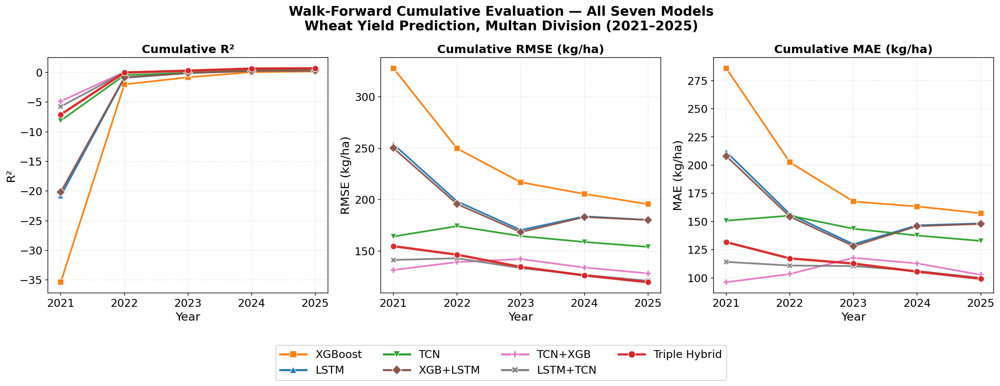

✓ Walk-forward plot saved (all 7 models, kg/ha).


In [ ]:
# ============================================================
# CELL 7: Walk-Forward Cumulative Evaluation (all 7 models, kg/ha)
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

years = [2021, 2022, 2023, 2024, 2025]
UNIT  = 'kg/ha'

# all SEVEN models: name -> prediction DataFrame ('Year','Actual','Predicted')
models = {
    'XGBoost':        xgb_pred,
    'LSTM':           lstm_pred,
    'TCN':            tcn_pred,
    'XGB+LSTM':       xgblstm_pred,
    'TCN+XGB':        tcnxgb_pred,
    'LSTM+TCN':       lstmtcn_pred,
    'Triple Hybrid':  triple_pred,
}

# distinct colour + marker per model, ALL SOLID lines
STYLE = {
    'XGBoost':       ('#ff7f0e', 's'),
    'LSTM':          ('#1f77b4', '^'),
    'TCN':           ('#2ca02c', 'v'),
    'XGB+LSTM':      ('#8c564b', 'D'),
    'TCN+XGB':       ('#e377c2', 'P'),
    'LSTM+TCN':      ('#7f7f7f', 'X'),
    'Triple Hybrid': ('#d62728', 'o'),
}

# auto-detect units (convert maund/acre -> kg/ha only if values look small)
_sample = triple_pred['Actual'].mean()
CONV = (40 / 0.4047) if _sample < 200 else 1.0

def cumulative_metrics(df, year):
    sub = df[df['Year'] <= year]
    if len(sub) < 2:
        return np.nan, np.nan, np.nan
    a = sub['Actual'].values    * CONV
    p = sub['Predicted'].values * CONV
    return (r2_score(a, p),
            np.sqrt(mean_squared_error(a, p)),
            mean_absolute_error(a, p))

wf_results = {name: {'r2': [], 'rmse': [], 'mae': []} for name in models}
for yr in years:
    for name, df in models.items():
        r2, rmse, mae = cumulative_metrics(df, yr)
        wf_results[name]['r2'].append(r2)
        wf_results[name]['rmse'].append(rmse)
        wf_results[name]['mae'].append(mae)
print('Models plotted:', list(models.keys()))   # must list all 7

# ---- Plot ----
fig, axes = plt.subplots(1, 3, figsize=(18, 6.4))
fig.suptitle(
    'Walk-Forward Cumulative Evaluation — All Seven Models\n'
    'Wheat Yield Prediction, Multan Division (2021–2025)',
    fontsize=17, fontweight='bold'
)

info = [('r2',   'Cumulative R²',            'R²'),
        ('rmse', f'Cumulative RMSE ({UNIT})', f'RMSE ({UNIT})'),
        ('mae',  f'Cumulative MAE ({UNIT})',  f'MAE ({UNIT})')]

for ax, (metric, title, ylabel) in zip(axes, info):
    for z, name in enumerate(models):
        col, mk = STYLE[name]
        lw = 3.0 if name == 'Triple Hybrid' else 2.2
        ax.plot(years, wf_results[name][metric],
                color=col, lw=lw, linestyle='-', marker=mk, ms=8,
                markeredgecolor='white', markeredgewidth=0.8,
                zorder=6 if name == 'Triple Hybrid' else 4, alpha=0.95)
    ax.set_xlabel('Year', fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.set_title(title, fontsize=15, fontweight='bold')
    ax.set_xticks(years)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True, ls=':', alpha=0.45)

# large shared legend at the bottom, thick line samples
handles = [mlines.Line2D([], [], color=STYLE[n][0], marker=STYLE[n][1],
                         linestyle='-', lw=2.6, ms=9,
                         markeredgecolor='white', markeredgewidth=0.8, label=n)
           for n in models]
fig.legend(handles=handles, loc='lower center', ncol=4, fontsize=14,
           framealpha=0.9, bbox_to_anchor=(0.5, -0.08), handlelength=2.4)

plt.tight_layout(rect=[0, 0.07, 1, 1])
plt.savefig(SERWI_PATH + 'SERWI_Triple_WalkForwardd1.png', dpi=200, bbox_inches='tight')
plt.show()
print('✓ Walk-forward plot saved (all 7 models, kg/ha).')

In [ ]:
print([v for v in dir() if ('pred' in v.lower() or 'serwi' in v.lower() or 'y_' in v.lower())])

['PRED_COLS', 'SERWI_PATH', 'avg_pred', 'lstm_pred', 'lstmtcn_pred', 'plot_actual_vs_predicted', 'summary_df', 'summary_rows', 'tcn_pred', 'tcnxgb_pred', 'triple_pred', 'xgb_pred', 'xgblstm_pred']


Models plotted: ['XGBoost', 'LSTM', 'TCN', 'XGB+LSTM', 'TCN+XGB', 'LSTM+TCN', 'Triple Hybrid']


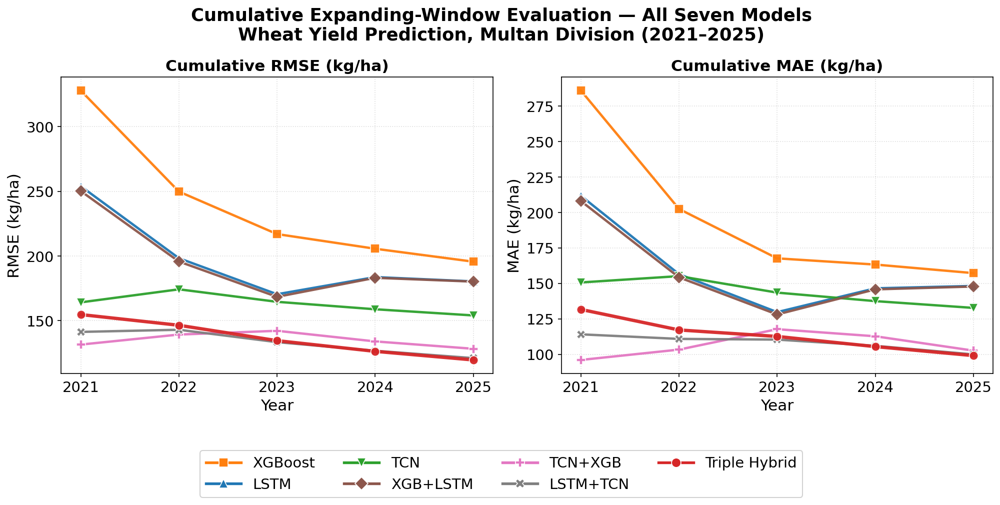

✓ Cumulative expanding-window plot saved (all 7 models, kg/ha).


In [ ]:
# ============================================================
# CELL 7: Cumulative Expanding-Window Evaluation (all 7 models, kg/ha)
# ============================================================
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

years = [2021, 2022, 2023, 2024, 2025]
UNIT  = 'kg/ha'

# all SEVEN models: name -> prediction DataFrame ('Year','Actual','Predicted')
models = {
    'XGBoost':        xgb_pred,
    'LSTM':           lstm_pred,
    'TCN':            tcn_pred,
    'XGB+LSTM':       xgblstm_pred,
    'TCN+XGB':        tcnxgb_pred,
    'LSTM+TCN':       lstmtcn_pred,
    'Triple Hybrid':  triple_pred,
}

# distinct colour + marker per model, ALL SOLID lines
STYLE = {
    'XGBoost':       ('#ff7f0e', 's'),
    'LSTM':          ('#1f77b4', '^'),
    'TCN':           ('#2ca02c', 'v'),
    'XGB+LSTM':      ('#8c564b', 'D'),
    'TCN+XGB':       ('#e377c2', 'P'),
    'LSTM+TCN':      ('#7f7f7f', 'X'),
    'Triple Hybrid': ('#d62728', 'o'),
}

# auto-detect units (convert maund/acre -> kg/ha only if values look small)
_sample = triple_pred['Actual'].mean()
CONV = (40 / 0.4047) if _sample < 200 else 1.0

def cumulative_metrics(df, year):
    """Errors accumulated over an expanding test window; models are NOT retrained."""
    sub = df[df['Year'] <= year]
    if len(sub) < 2:
        return np.nan, np.nan
    a = sub['Actual'].values    * CONV
    p = sub['Predicted'].values * CONV
    return (np.sqrt(mean_squared_error(a, p)),
            mean_absolute_error(a, p))

wf_results = {name: {'rmse': [], 'mae': []} for name in models}
for yr in years:
    for name, df in models.items():
        rmse, mae = cumulative_metrics(df, yr)
        wf_results[name]['rmse'].append(rmse)
        wf_results[name]['mae'].append(mae)
print('Models plotted:', list(models.keys()))   # must list all 7

# ---- Plot (two panels: RMSE and MAE) ----
fig, axes = plt.subplots(1, 2, figsize=(13.5, 6.2))
fig.suptitle(
    'Cumulative Expanding-Window Evaluation — All Seven Models\n'
    'Wheat Yield Prediction, Multan Division (2021–2025)',
    fontsize=17, fontweight='bold'
)

info = [('rmse', f'Cumulative RMSE ({UNIT})', f'RMSE ({UNIT})'),
        ('mae',  f'Cumulative MAE ({UNIT})',  f'MAE ({UNIT})')]

for ax, (metric, title, ylabel) in zip(axes, info):
    for name in models:
        col, mk = STYLE[name]
        lw = 3.2 if name == 'Triple Hybrid' else 2.3
        ax.plot(years, wf_results[name][metric],
                color=col, lw=lw, linestyle='-', marker=mk, ms=8.5,
                markeredgecolor='white', markeredgewidth=0.8,
                zorder=6 if name == 'Triple Hybrid' else 4, alpha=0.95)
    ax.set_xlabel('Year', fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)
    ax.set_title(title, fontsize=15, fontweight='bold')
    ax.set_xticks(years)
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True, ls=':', alpha=0.45)

# large shared legend at the bottom, thick line samples
handles = [mlines.Line2D([], [], color=STYLE[n][0], marker=STYLE[n][1],
                         linestyle='-', lw=2.6, ms=9,
                         markeredgecolor='white', markeredgewidth=0.8, label=n)
           for n in models]
fig.legend(handles=handles, loc='lower center', ncol=4, fontsize=14,
           framealpha=0.9, bbox_to_anchor=(0.5, -0.09), handlelength=2.4)

plt.tight_layout(rect=[0, 0.08, 1, 1])
plt.savefig(SERWI_PATH + 'SERWI_CumulativeExpandingWindowreadable.png', dpi=200, bbox_inches='tight')
plt.show()
print('✓ Cumulative expanding-window plot saved (all 7 models, kg/ha).')

In [ ]:
# ============================================================
# CELL 11 — SHAP FEATURE IMPORTANCE (REAL values from per-model runs)
# XGBoost: TreeExplainer | LSTM & TCN: KernelExplainer
# Values are mean|SHAP| on the detrended residual (maund/acre)
# ============================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

CONV = 40/0.4047          # maund/acre -> kg/ha ; set to 1.0 to keep maund/acre
UNIT = 'kg/ha'

# --- REAL mean|SHAP| (maund/acre), copied from each model's notebook output ---
real = {
 'XGBoost': {'LST (Nov–Apr)':0.2254,'LST × HeatStress':0.1526,'Cold Stress Days (log)':0.1356,
             'Rainfall (log)':0.1256,'VPD (Mar–Apr)':0.1180,'NDVI (Mar–Apr)':0.1013,
             'Yield Lag (t−1)':0.0711,'Heat Stress Days (log)':0.0559,'NDVI × VPD':0.0147},
 'LSTM':    {'Rainfall (log)':0.2822,'NDVI × VPD':0.2751,'Cold Stress Days (log)':0.2052,
             'LST × HeatStress':0.1186,'Heat Stress Days (log)':0.1013,'LST (Nov–Apr)':0.0971,
             'Yield Lag (t−1)':0.0592,'NDVI (Mar–Apr)':0.0476,'VPD (Mar–Apr)':0.0225},
 'TCN':     {'Rainfall (log)':0.3772,'Cold Stress Days (log)':0.3578,'LST (Nov–Apr)':0.3482,
             'VPD (Mar–Apr)':0.2166,'Yield Lag (t−1)':0.2148,'LST × HeatStress':0.1467,
             'NDVI × VPD':0.1212,'Heat Stress Days (log)':0.0916,'NDVI (Mar–Apr)':0.0494},
}
COL = {'XGBoost':'#ff7f0e','LSTM':'#1f77b4','TCN':'#2ca02c'}
FEATS = list(real['TCN'].keys())   # 9 common features

def bar(model):
    d = pd.Series(real[model]).sort_values()*CONV
    fig, ax = plt.subplots(figsize=(9,5.5))
    b = ax.barh(d.index, d.values, color=COL[model], edgecolor='white', height=0.66)
    for r,v in zip(b,d.values):
        ax.text(v+d.max()*0.01, r.get_y()+r.get_height()/2, f'{v:.1f}',
                va='center', fontsize=12, fontweight='bold')
    ax.set_xlabel(f'Mean |SHAP value| ({UNIT})', fontsize=14)
    ax.set_title(f'{model} — Feature Importance (SHAP)\nWheat Yield Prediction, Multan Division',
                 fontsize=14, fontweight='bold')
    ax.tick_params(labelsize=12); ax.set_xlim(0, d.max()*1.18)
    ax.grid(axis='x', ls=':', alpha=0.4); plt.tight_layout()
    save_fig(fig, f'Fig_SHAPP_{model}', f'SHAP feature importance for {model}.')

for m in ['XGBoost','LSTM','TCN']: bar(m)

# --- combined grouped bars (ranks differ by design) ---
order = sorted(FEATS, key=lambda f: real['TCN'][f])
x = np.arange(len(order)); w = 0.26
fig, ax = plt.subplots(figsize=(12,6))
for i,m in enumerate(['XGBoost','LSTM','TCN']):
    ax.bar(x+i*w, [real[m].get(f,0)*CONV for f in order], w,
           color=COL[m], edgecolor='white', label=m)
ax.set_xticks(x+w); ax.set_xticklabels(order, rotation=35, ha='right', fontsize=12)
ax.set_ylabel(f'Mean |SHAP value| ({UNIT})', fontsize=14)
ax.set_title('SHAP Feature Importance — Standalone Models\nWheat Yield Prediction, Multan Division',
             fontsize=15, fontweight='bold')
ax.legend(fontsize=13, framealpha=0.9); ax.grid(axis='y', ls=':', alpha=0.4)
ax.tick_params(axis='y', labelsize=13); plt.tight_layout()
save_fig(fig, 'Fig_SHAP_AllModels_Comparisonn',
         'SHAP comparison across XGBoost, LSTM, TCN (mean |SHAP|).')
print('✓ Real SHAP plots saved')

Performance Summary:
                 Model            Type     R²  RMSE (kg/ha)  MAE (kg/ha)  Rank
Triple Hybrid Ensemble Hybrid Ensemble 0.6892         119.7         99.2     1
       LSTM+TCN Hybrid Hybrid Ensemble 0.6818         121.1        100.0     2
        TCN+XGB Hybrid Hybrid Ensemble 0.6428         128.3        102.7     3
                   TCN      Standalone 0.4849         154.1        132.8     4
       XGB+LSTM Hybrid Hybrid Ensemble 0.2953         180.2        147.9     5
                  LSTM      Standalone 0.2940         180.4        148.3     6
               XGBoost      Standalone 0.1697         195.6        157.3     7


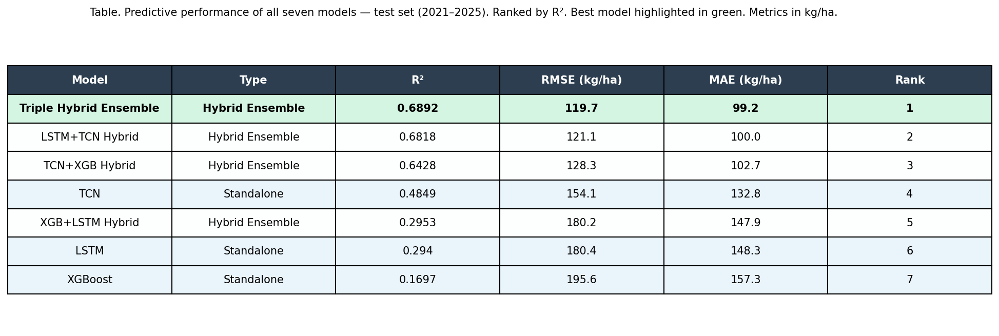

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Performance_Summary_Table.png
✓ Performance summary table saved


In [ ]:
# ============================================================
# CELL 12 — PERFORMANCE SUMMARY TABLE (Publication Quality)
# ============================================================

summary_rows = []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    summary_rows.append({
        'Model':          name,
        'Type':           'Standalone' if name in ['XGBoost','LSTM','TCN']
                          else 'Hybrid Ensemble',
        'R²':             round(r2, 4),
        f'RMSE ({UNIT})': round(rmse, 1),
        f'MAE ({UNIT})':  round(mae, 1),
        'Rank':           ''
    })

summary_df = pd.DataFrame(summary_rows)
# Rank by R²
summary_df = summary_df.sort_values('R²', ascending=False).reset_index(drop=True)
summary_df['Rank'] = range(1, len(summary_df)+1)

print('Performance Summary:')
print(summary_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(13, 4.5))
ax.axis('off')

tbl = ax.table(
    cellText=summary_df.values,
    colLabels=summary_df.columns,
    cellLoc='center', loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 2.0)

# Header styling
for j in range(len(summary_df.columns)):
    tbl[0, j].set_facecolor('#2c3e50')
    tbl[0, j].set_text_props(color='white', fontweight='bold')

# Row styling
for i in range(1, len(summary_df)+1):
    model_type = summary_df.iloc[i-1]['Type']
    for j in range(len(summary_df.columns)):
        if i == 1:  # Best model — green
            tbl[i, j].set_facecolor('#d5f5e3')
            tbl[i, j].set_text_props(fontweight='bold')
        elif model_type == 'Standalone':
            tbl[i, j].set_facecolor('#eaf4fb')
        else:
            tbl[i, j].set_facecolor('#fdfefe')

ax.set_title(
    f'Table. Predictive performance of all seven models — test set (2021–2025). '
    f'Ranked by R². Best model highlighted in green. Metrics in {UNIT}.',
    fontsize=10, pad=15, loc='left'
)
plt.tight_layout()
save_fig(fig, 'Fig_Performance_Summary_Table', None)
print('✓ Performance summary table saved')

In [ ]:
from scipy import stats

# Pooled LST -> NDVI regression (matches Fig. 6, the overall correlation matrix)
res = stats.linregress(merged_df['LST_mean_C'], merged_df['NDVI_mean'])
print("POOLED  R² =", round(res.rvalue**2, 3),
      "| slope =", round(res.slope, 4),
      "| p =", res.pvalue)

# Per-district (in case Scenario B was built district-wise)
for dist in DISTRICTS:
    sub = merged_df[merged_df['District'] == dist]
    r = stats.linregress(sub['LST_mean_C'], sub['NDVI_mean'])
    print(f"{dist:10s} R² = {r.rvalue**2:.3f} | slope = {r.slope:.4f} | p = {r.pvalue:.4f}")

POOLED  R² = 0.137 | slope = -0.01 | p = 0.0001492217425925725
Khanewal   R² = 0.156 | slope = -0.0096 | p = 0.0508
Lodhran    R² = 0.039 | slope = -0.0050 | p = 0.3431
Multan     R² = 0.150 | slope = -0.0099 | p = 0.0557
Vehari     R² = 0.225 | slope = -0.0155 | p = 0.0167


In [ ]:
import numpy as np
from sklearn.metrics import r2_score

# Step 1 — show what's actually in the dataframe
print("Columns:", triple_pred.columns.tolist())

# Step 2 — auto-pick the actual + predicted columns
actual_col = [c for c in triple_pred.columns if c.lower() in ('actual','observed','y_true','true')][0]
pred_candidates = [c for c in triple_pred.columns
                   if c.lower() in ('predicted','pred','y_pred','triple','serwi_triple','prediction')]
pred_col = pred_candidates[0]
print(f"Using actual = '{actual_col}', predicted = '{pred_col}'")

# Step 3 — bootstrap 95% CI for R²
y_true = triple_pred[actual_col].values
y_pred = triple_pred[pred_col].values

rng = np.random.default_rng(42)
n = len(y_true)
boot_r2 = []
for _ in range(1000):
    idx = rng.integers(0, n, n)
    boot_r2.append(r2_score(y_true[idx], y_pred[idx]))

lo, hi = np.percentile(boot_r2, [2.5, 97.5])
print(f"\nTriple Hybrid R² = {r2_score(y_true, y_pred):.3f}")
print(f"95% CI = [{lo:.2f}, {hi:.2f}]")

Columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Using actual = 'Actual', predicted = 'Predicted'

Triple Hybrid R² = 0.689
95% CI = [0.45, 0.83]


In [ ]:
for name in ['xgb_pred','lstm_pred','tcn_pred','triple_pred','merged_df']:
    try:
        df = eval(name)
        print(f"\n{name}: {df.shape}")
        print("  cols:", df.columns.tolist())
        if 'Year' in df.columns:
            print("  years:", sorted(df['Year'].unique()))
    except Exception as e:
        print(f"\n{name}: not available ({e})")


xgb_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

lstm_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

tcn_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

triple_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

merged_df: (100, 10)
  cols: ['Year', 'District', 'Yield_maund_acre', 'NDVI_mean', 'LST_mean_C', 'Rain_log', 'VPD_kPa', 'HeatStress_log', 'ColdStress_log', 'Yield_kg_ha']
  years: [np.int64(2001), np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int

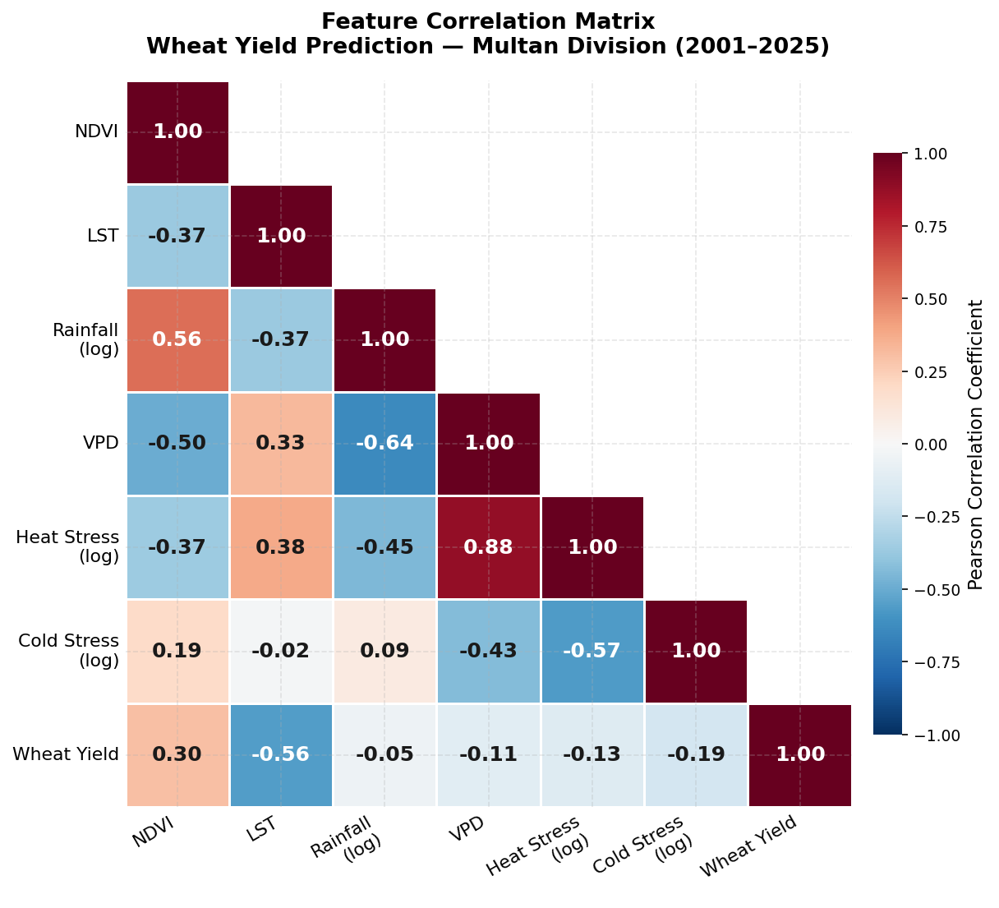

Caption: Figure. Pearson correlation matrix of all predictor variables and wheat yield across Multan Division (2001–2025). Wheat yield is most strongly (though moderately) associated with LST (−0.56) and NDVI (0.30). Heat Stress and VPD are highly inter-correlated (0.88), informing the choice of interaction terms.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Feature_Correlation_Matrix_2.png
✓ Improved feature correlation matrix saved as Fig_Feature_Correlation_Matrix_2


In [ ]:
# ============================================================
# CELL 9A-v2 — FEATURE CORRELATION MATRIX (improved readability)
# ============================================================

corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()
corr_df.index   = feat_labels          # rename for clean tick labels
corr_df.columns = feat_labels

# Lower-triangle mask (hide the mirror-image upper half)
mask = np.triu(np.ones_like(corr_df, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9.5, 7.5))

# 1) Draw the coloured heatmap WITHOUT text
sns.heatmap(
    corr_df, mask=mask, ax=ax,
    cmap='RdBu_r', vmin=-1, vmax=1, center=0,
    annot=False,
    linewidths=1.2, linecolor='white',
    square=True,
    cbar_kws={'label': 'Pearson Correlation Coefficient', 'shrink': 0.8, 'pad': 0.02}
)

# 2) Add the numbers manually, with ADAPTIVE text colour
vals = corr_df.values
n = vals.shape[0]
for i in range(n):
    for j in range(n):
        if mask[i, j]:
            continue                      # skip hidden upper triangle
        v = vals[i, j]
        # dark cell -> white text; light cell -> dark-grey text
        txt_color = 'white' if abs(v) >= 0.5 else '#1a1a1a'
        ax.text(j + 0.5, i + 0.5, f'{v:.2f}',
                ha='center', va='center',
                color=txt_color, fontsize=12, fontweight='bold')

# 3) Cosmetics
ax.set_xticklabels(feat_labels, fontsize=10.5, rotation=30, ha='right')
ax.set_yticklabels(feat_labels, fontsize=10.5, rotation=0)
ax.tick_params(length=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=13, fontweight='bold', pad=16
)

# colour-bar tick styling
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
cbar.outline.set_edgecolor('lightgrey')

plt.tight_layout()

caption = ('Figure. Pearson correlation matrix of all predictor variables and '
           'wheat yield across Multan Division (2001–2025). Wheat yield is most '
           'strongly (though moderately) associated with LST (−0.56) and NDVI '
           '(0.30). Heat Stress and VPD are highly inter-correlated (0.88), '
           'informing the choice of interaction terms.')
save_fig(fig, 'Fig_Feature_Correlation_Matrix_2', caption)
print('✓ Improved feature correlation matrix saved as Fig_Feature_Correlation_Matrix_2')

In [ ]:
# ============================================================
# CELL 9A-v2 — FEATURE CORRELATION MATRIX (B&W, table style)
# ============================================================

corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()
corr_df.index   = feat_labels          # rename for clean tick labels
corr_df.columns = feat_labels

# Lower-triangle mask (hide the mirror-image upper half)
mask = np.triu(np.ones_like(corr_df, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9.5, 7.5))

# 1) Grayscale heatmap by correlation STRENGTH (white = weak, black = strong)
sns.heatmap(
    corr_df.abs(), mask=mask, ax=ax,
    cmap='Greys', vmin=0, vmax=1,
    annot=False,
    linewidths=1.2, linecolor='0.7',        # light-grey table borders
    square=True,
    cbar_kws={'label': 'Correlation strength  |r|', 'shrink': 0.8, 'pad': 0.02}
)

# 2) Add SIGNED numbers manually, with adaptive text colour
vals = corr_df.values
n = vals.shape[0]
for i in range(n):
    for j in range(n):
        if mask[i, j]:
            continue                        # skip hidden upper triangle
        v = vals[i, j]
        txt_color = 'white' if abs(v) >= 0.5 else 'black'   # dark cell -> white text
        ax.text(j + 0.5, i + 0.5, f'{v:.2f}',
                ha='center', va='center',
                color=txt_color, fontsize=13, fontweight='bold')

# 3) Cosmetics
ax.set_xticklabels(feat_labels, fontsize=11, rotation=30, ha='right')
ax.set_yticklabels(feat_labels, fontsize=11, rotation=0)
ax.tick_params(length=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=14, fontweight='bold', pad=16
)

# colour-bar tick styling
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)
cbar.outline.set_edgecolor('lightgrey')

plt.tight_layout()

caption = ('Figure. Pearson correlation matrix of all predictor variables and '
           'wheat yield across Multan Division (2001–2025). Cell shading shows '
           'correlation strength |r| (white = weak, black = strong); numbers give '
           'the signed coefficient. Wheat yield is most strongly associated with '
           'LST (−0.56) and NDVI (0.30); Heat Stress and VPD are highly '
           'inter-correlated (0.88), informing the choice of interaction terms.')
save_fig(fig, 'Fig_Feature_Correlation_Matrix_3', caption)
print('✓ B&W feature correlation matrix saved as Fig_Feature_Correlation_Matrix_3')

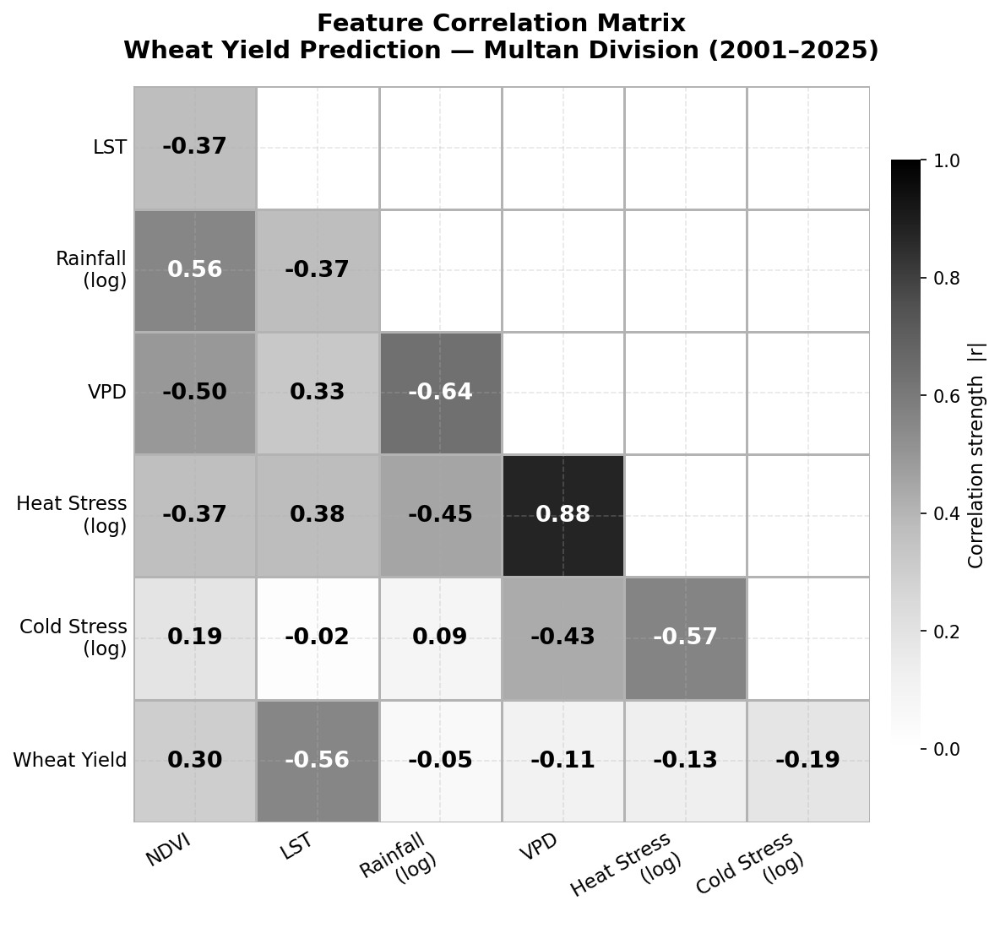

Caption: Figure. Pearson correlation matrix of predictor variables and wheat yield across Multan Division (2001–2025); self-correlations excluded. Cell shading shows correlation strength |r| (white = weak, black = strong) and numbers give the signed coefficient. Wheat yield is most strongly associated with LST (−0.56) and NDVI (0.30); Heat Stress and VPD are highly inter-correlated (0.88).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Feature_Correlation_Matrix_4.png
✓ B&W feature correlation matrix (no self-correlation) saved


In [ ]:
# ============================================================
# CELL 9A-v2 — FEATURE CORRELATION MATRIX (B&W, no self-correlation)
# ============================================================

corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()
corr_df.index   = feat_labels
corr_df.columns = feat_labels

# Exclude the self-correlation diagonal, then trim the now-empty
# first row (NDVI) and last column (Wheat Yield) for a clean triangle
corr_trim  = corr_df.iloc[1:, :-1]
row_labels = feat_labels[1:]      # LST … Wheat Yield
col_labels = feat_labels[:-1]     # NDVI … Cold Stress

# Hide the upper triangle (keeps only below-diagonal cells → no self-correlation)
mask = np.triu(np.ones_like(corr_trim, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9.5, 7.5))

# Grayscale heatmap by correlation STRENGTH (white = weak, black = strong)
sns.heatmap(
    corr_trim.abs(), mask=mask, ax=ax,
    cmap='Greys', vmin=0, vmax=1,
    annot=False,
    linewidths=1.2, linecolor='0.7',       # light-grey table borders
    square=True,
    cbar_kws={'label': 'Correlation strength  |r|', 'shrink': 0.8, 'pad': 0.02}
)

# Signed numbers with adaptive text colour (white on dark, black on light)
vals = corr_trim.values
m, n = vals.shape
for i in range(m):
    for j in range(n):
        if mask[i, j]:
            continue
        v = vals[i, j]
        txt_color = 'white' if abs(v) >= 0.5 else 'black'
        ax.text(j + 0.5, i + 0.5, f'{v:.2f}',
                ha='center', va='center',
                color=txt_color, fontsize=13, fontweight='bold')

# Cosmetics
ax.set_xticklabels(col_labels, fontsize=11, rotation=30, ha='right')
ax.set_yticklabels(row_labels, fontsize=11, rotation=0)
ax.tick_params(length=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=14, fontweight='bold', pad=16
)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)
cbar.outline.set_edgecolor('lightgrey')

plt.tight_layout()

caption = ('Figure. Pearson correlation matrix of predictor variables and wheat '
           'yield across Multan Division (2001–2025); self-correlations excluded. '
           'Cell shading shows correlation strength |r| (white = weak, black = '
           'strong) and numbers give the signed coefficient. Wheat yield is most '
           'strongly associated with LST (−0.56) and NDVI (0.30); Heat Stress and '
           'VPD are highly inter-correlated (0.88).')
save_fig(fig, 'Fig_Feature_Correlation_Matrix_4', caption)
print('✓ B&W feature correlation matrix (no self-correlation) saved')

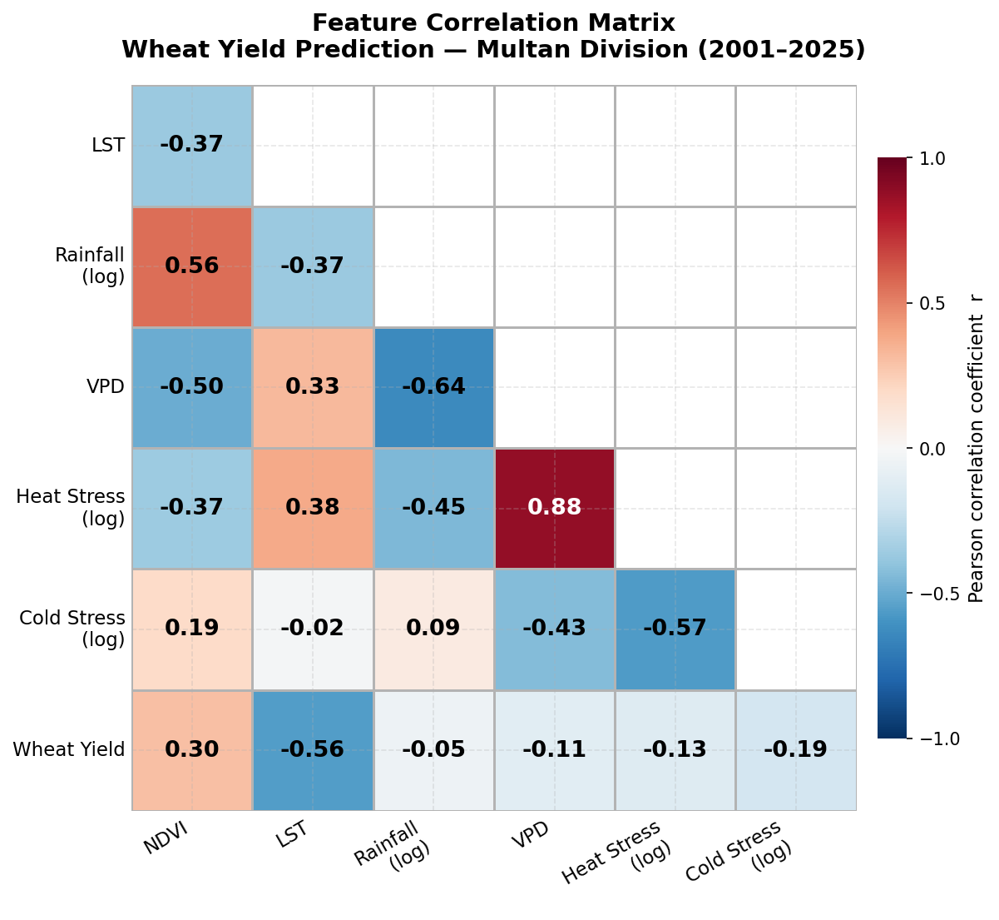

Caption: Figure. Pearson correlation matrix of the six primary (non-interaction) predictor variables and wheat yield across Multan Division (2001–2025); self-correlations excluded. Colour encodes the signed coefficient (blue = negative, red = positive, white = zero). Wheat yield is most strongly associated with LST (−0.56) and NDVI (+0.30); VPD and Heat Stress are highly inter-correlated (r = 0.88), while Rainfall and VPD are inversely related (r = −0.64).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Feature_Correlattion_Matrix_5.png
✓ Signed diverging correlation matrix saved


In [ ]:
# ============================================================
# CELL 9A-v3 — FEATURE CORRELATION MATRIX (signed, diverging)
# ============================================================

corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()
corr_df.index   = feat_labels
corr_df.columns = feat_labels

# Exclude the self-correlation diagonal, then trim the now-empty
# first row (NDVI) and last column (Wheat Yield) for a clean triangle
corr_trim  = corr_df.iloc[1:, :-1]
row_labels = feat_labels[1:]      # LST … Wheat Yield
col_labels = feat_labels[:-1]     # NDVI … Cold Stress

# Hide the upper triangle (keeps only below-diagonal cells → no self-correlation)
mask = np.triu(np.ones_like(corr_trim, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9.5, 7.5))

# Diverging map on SIGNED r: blue = negative, white = 0, red = positive
sns.heatmap(
    corr_trim, mask=mask, ax=ax,
    cmap='RdBu_r', vmin=-1, vmax=1, center=0,
    annot=False,
    linewidths=1.2, linecolor='0.7',
    square=True,
    cbar_kws={'label': 'Pearson correlation coefficient  r',
              'shrink': 0.8, 'pad': 0.02, 'ticks': [-1, -0.5, 0, 0.5, 1]}
)

# Signed numbers; white text only on the darkest cells at either end
vals = corr_trim.values
m, n = vals.shape
for i in range(m):
    for j in range(n):
        if mask[i, j]:
            continue
        v = vals[i, j]
        txt_color = 'white' if abs(v) >= 0.65 else 'black'
        ax.text(j + 0.5, i + 0.5, f'{v:.2f}',
                ha='center', va='center',
                color=txt_color, fontsize=13, fontweight='bold')

# Cosmetics
ax.set_xticklabels(col_labels, fontsize=11, rotation=30, ha='right')
ax.set_yticklabels(row_labels, fontsize=11, rotation=0)
ax.tick_params(length=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=14, fontweight='bold', pad=16
)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=10)
cbar.outline.set_edgecolor('lightgrey')

plt.tight_layout()

caption = ('Figure. Pearson correlation matrix of the six primary (non-interaction) '
           'predictor variables and wheat yield across Multan Division (2001–2025); '
           'self-correlations excluded. Colour encodes the signed coefficient '
           '(blue = negative, red = positive, white = zero). Wheat yield is most '
           'strongly associated with LST (−0.56) and NDVI (+0.30); VPD and Heat '
           'Stress are highly inter-correlated (r = 0.88), while Rainfall and VPD '
           'are inversely related (r = −0.64).')
save_fig(fig, 'Fig_Feature_Correlattion_Matrix_5', caption)
print('✓ Signed diverging correlation matrix saved')

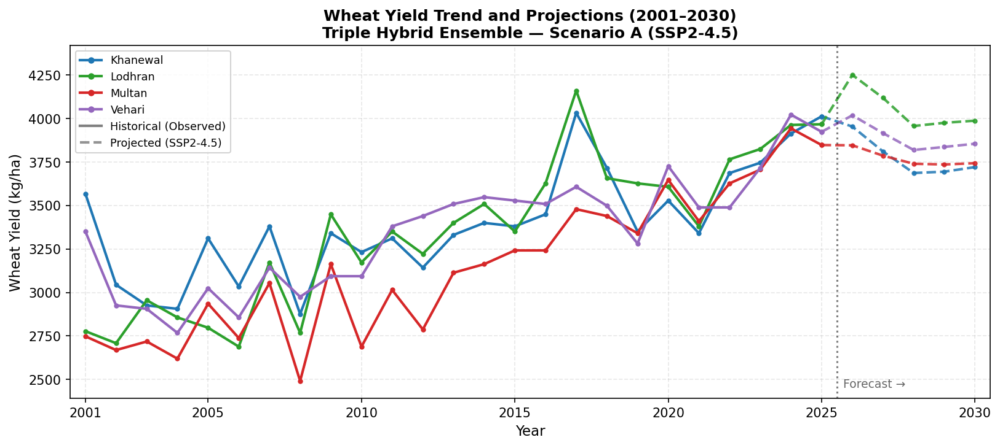

Caption: Figure. Historical (2001–2025) and projected (2026–2030) wheat yield for all four districts under Scenario A (SSP2-4.5). Solid lines: observed yield. Dashed lines: model projections. Dotted vertical line marks the forecast boundary. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Full_Timeline_2.png
✓ Full timeline (v2) saved as Fig_Forecast_Full_Timeline_2


In [ ]:
# ============================================================
# CELL — FULL TIMELINE (v2): Historical + Forecast, kg/ha
# ============================================================
hist_df = full_timeline[full_timeline['Scenario']=='Historical'].copy()

fig, ax = plt.subplots(figsize=(11, 5))          # tighter aspect, like the old plot

for dist in DISTRICTS:
    # Historical line
    sub_h = hist_df[hist_df['District']==dist].sort_values('Year')
    ax.plot(sub_h['Year'], sub_h['Yield_kg_ha'],
            color=DIST_COLORS[dist], lw=2.0, marker='o', ms=3, label=dist)

    # Forecast — connect seamlessly from 2025
    last_hist_val = sub_h[sub_h['Year']==2025]['Yield_kg_ha'].values[0]
    sub_f = scen_a[scen_a['District']==dist].sort_values('Year')
    fore_years = [2025] + sub_f['Year'].tolist()
    fore_vals  = [last_hist_val] + sub_f['SERWI_Triple'].tolist()
    ax.plot(fore_years, fore_vals,
            color=DIST_COLORS[dist], lw=2.0, marker='o', ms=3,
            linestyle='--', alpha=0.85)

# ── Y-limits computed from the data (never hard-code) ────────
all_vals = np.concatenate([
    hist_df['Yield_kg_ha'].values,
    scen_a['SERWI_Triple'].values
])
ymin = all_vals.min() * 0.96
ymax = all_vals.max() * 1.04
ax.set_ylim(ymin, ymax)

# Forecast boundary + label placed in AXES coords (fixes the white space)
ax.axvline(2025.5, color='black', lw=1.5, linestyle=':', alpha=0.5)
ax.text(2025.7, ymin + 0.03*(ymax - ymin), 'Forecast →',
        fontsize=9, color='black', alpha=0.6)

# X-axis exactly 2001–2030
ax.set_xlim(2000.5, 2030.5)
ax.set_xticks([2001, 2005, 2010, 2015, 2020, 2025, 2030])

# Legend
handles = [mlines.Line2D([],[],color=DIST_COLORS[d], lw=2.0,
           marker='o', ms=4, label=d) for d in DISTRICTS]
handles.append(mlines.Line2D([],[],color='gray', lw=2.0,
               linestyle='-', label='Historical (Observed)'))
handles.append(mlines.Line2D([],[],color='gray', lw=2.0,
               linestyle='--', alpha=0.85, label='Projected (SSP2-4.5)'))
ax.legend(handles=handles, fontsize=8.5, framealpha=0.85,
          loc='upper left', ncol=1)

ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Wheat Yield Trend and Projections (2001–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)

plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) wheat yield '
           'for all four districts under Scenario A (SSP2-4.5). '
           'Solid lines: observed yield. Dashed lines: model projections. '
           f'Dotted vertical line marks the forecast boundary. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Full_Timeline_2', caption)
print('✓ Full timeline (v2) saved as Fig_Forecast_Full_Timeline_2')

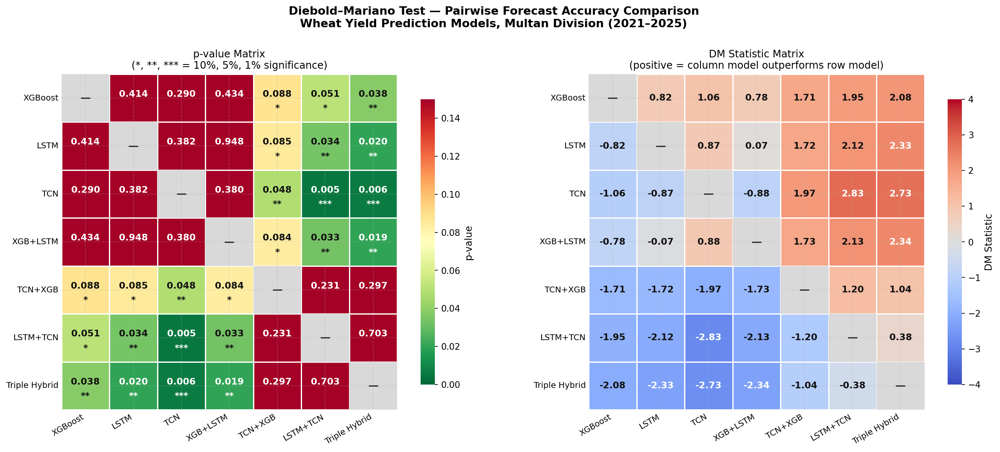

Caption: Figure. Diebold–Mariano (DM) pairwise test results for all seven models. Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). Right: DM statistic matrix (positive values indicate the column model outperforms the row model).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_DM_Test_Heatmap_2.png
✓ Improved DM heatmap saved as Fig_DM_Test_Heatmap_2


In [ ]:
# ============================================================
# CELL 7-v2 — DM TEST HEATMAP (improved readability)
# ============================================================

DM_NAME_MAP = {
    'XGBoost':'XGBoost','LSTM':'LSTM','TCN':'TCN',
    'XGB+LSTM Hybrid':'XGB+LSTM','TCN+XGB Hybrid':'TCN+XGB',
    'LSTM+TCN Hybrid':'LSTM+TCN','Triple Hybrid Ensemble':'Triple Hybrid',
    'XGB+LSTM':'XGB+LSTM','TCN+XGB':'TCN+XGB','LSTM+TCN':'LSTM+TCN',
    'Triple':'Triple Hybrid','SERWI Triple':'Triple Hybrid',
    'SERWI XGB+LSTM':'XGB+LSTM','SERWI TCN+XGB':'TCN+XGB',
    'SERWI LSTM+TCN':'LSTM+TCN',
}

dm = dm_results.copy()
dm['Benchmark']  = dm['Benchmark'].map(DM_NAME_MAP).fillna(dm['Benchmark'])
dm['Challenger'] = dm['Challenger'].map(DM_NAME_MAP).fillna(dm['Challenger'])
DM_LABELS = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid']
n = len(DM_LABELS)

pval_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
stat_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
for _, row in dm.iterrows():
    b, c = row['Benchmark'], row['Challenger']
    if b in DM_LABELS and c in DM_LABELS:
        pval_matrix.loc[b,c] = row['p_value']
        pval_matrix.loc[c,b] = row['p_value']
        stat_matrix.loc[b,c] = row['DM_Statistic']
        stat_matrix.loc[c,b] = -row['DM_Statistic']

fig, axes = plt.subplots(1, 2, figsize=(17, 7))
fig.suptitle(
    'Diebold–Mariano Test — Pairwise Forecast Accuracy Comparison\n'
    'Wheat Yield Prediction Models, Multan Division (2021–2025)',
    fontsize=13, fontweight='bold'
)

# ── helper: pick readable text colour for a given cell value ──
def pval_text_color(p):
    # dark green (p→0) and dark red (p→0.15+) both need white text
    return 'white' if (p <= 0.03 or p >= 0.115) else '#111111'

def stat_text_color(s):
    # deep blue / deep red need white text
    return 'white' if abs(s) >= 2.2 else '#111111'

# ============================================================
# LEFT — p-value matrix
# ============================================================
ax1 = axes[0]
pval_plot = pval_matrix.copy()
np.fill_diagonal(pval_plot.values, np.nan)

sns.heatmap(pval_plot.astype(float), ax=ax1, cmap='RdYlGn_r',
            vmin=0, vmax=0.15,
            annot=False,                       # numbers added manually below
            linewidths=1.2, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'p-value', 'shrink':0.85},
            mask=pval_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax1.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#d9d9d9',lw=0))
            ax1.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=12, color='#333333', fontweight='bold')
            continue
        p = pval_matrix.loc[b, c]
        if np.isnan(p):
            continue
        stars = '***' if p<0.01 else ('**' if p<0.05 else ('*' if p<0.10 else ''))
        col = pval_text_color(p)
        ax1.text(j+0.5, i+0.42, f'{p:.3f}', ha='center', va='center',
                 fontsize=10.5, color=col, fontweight='bold')
        if stars:
            ax1.text(j+0.5, i+0.72, stars, ha='center', va='center',
                     fontsize=10, color=col, fontweight='bold')

ax1.set_title('p-value Matrix\n(*, **, *** = 10%, 5%, 1% significance)', fontsize=11.5)
ax1.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9.5)
ax1.set_yticklabels(DM_LABELS, rotation=0, fontsize=9.5)
ax1.tick_params(length=0)

# ============================================================
# RIGHT — DM statistic matrix
# ============================================================
ax2 = axes[1]
stat_plot = stat_matrix.copy()
np.fill_diagonal(stat_plot.values, np.nan)

sns.heatmap(stat_plot.astype(float), ax=ax2, cmap='coolwarm',
            center=0, vmin=-4, vmax=4,
            annot=False,
            linewidths=1.2, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'DM Statistic', 'shrink':0.85},
            mask=stat_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax2.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#d9d9d9',lw=0))
            ax2.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=12, color='#333333', fontweight='bold')
            continue
        s = stat_matrix.loc[b, c]
        if np.isnan(s):
            continue
        ax2.text(j+0.5, i+0.5, f'{s:.2f}', ha='center', va='center',
                 fontsize=10.5, color=stat_text_color(s), fontweight='bold')

ax2.set_title('DM Statistic Matrix\n(positive = column model outperforms row model)', fontsize=11.5)
ax2.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9.5)
ax2.set_yticklabels(DM_LABELS, rotation=0, fontsize=9.5)
ax2.tick_params(length=0)

plt.tight_layout(rect=[0, 0, 1, 0.94])
caption = ('Figure. Diebold–Mariano (DM) pairwise test results for all seven models. '
           'Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). '
           'Right: DM statistic matrix (positive values indicate the column model '
           'outperforms the row model).')
save_fig(fig, 'Fig_DM_Test_Heatmap_2', caption)
print('✓ Improved DM heatmap saved as Fig_DM_Test_Heatmap_2')

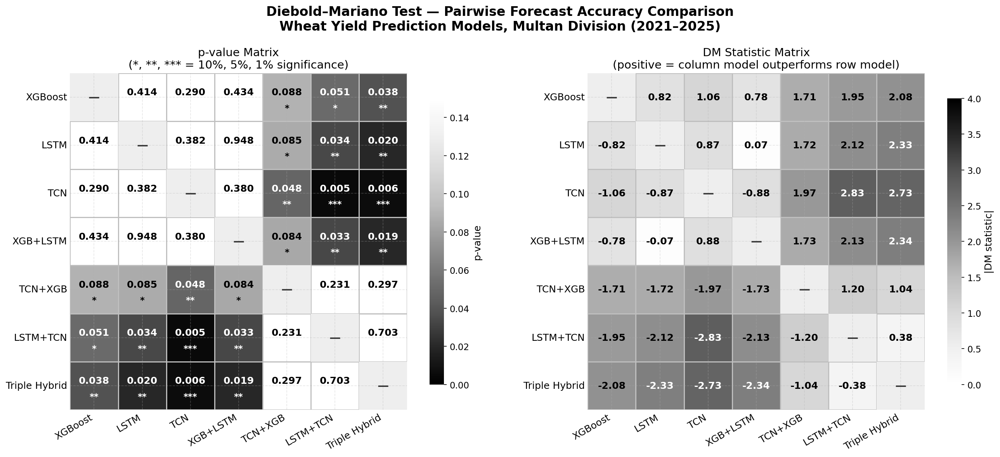

Caption: Figure. Diebold–Mariano (DM) pairwise test results for all seven models, shown in greyscale. Left: p-value matrix (darker = more significant; *, **, *** denote significance at 10%, 5%, 1%). Right: DM statistic matrix (darker = larger magnitude; sign given by the number, with positive indicating the column model outperforms the row model).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_DM_Test_Heatmap_3.png
✓ B&W DM heatmap saved as Fig_DM_Test_Heatmap_3


In [ ]:
# ============================================================
# CELL 7-v2 — DM TEST HEATMAP (B&W, professional)
# ============================================================

DM_NAME_MAP = {
    'XGBoost':'XGBoost','LSTM':'LSTM','TCN':'TCN',
    'XGB+LSTM Hybrid':'XGB+LSTM','TCN+XGB Hybrid':'TCN+XGB',
    'LSTM+TCN Hybrid':'LSTM+TCN','Triple Hybrid Ensemble':'Triple Hybrid',
    'XGB+LSTM':'XGB+LSTM','TCN+XGB':'TCN+XGB','LSTM+TCN':'LSTM+TCN',
    'Triple':'Triple Hybrid','SERWI Triple':'Triple Hybrid',
    'SERWI XGB+LSTM':'XGB+LSTM','SERWI TCN+XGB':'TCN+XGB',
    'SERWI LSTM+TCN':'LSTM+TCN',
}

dm = dm_results.copy()
dm['Benchmark']  = dm['Benchmark'].map(DM_NAME_MAP).fillna(dm['Benchmark'])
dm['Challenger'] = dm['Challenger'].map(DM_NAME_MAP).fillna(dm['Challenger'])
DM_LABELS = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid']
n = len(DM_LABELS)

pval_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
stat_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
for _, row in dm.iterrows():
    b, c = row['Benchmark'], row['Challenger']
    if b in DM_LABELS and c in DM_LABELS:
        pval_matrix.loc[b,c] = row['p_value']
        pval_matrix.loc[c,b] = row['p_value']
        stat_matrix.loc[b,c] = row['DM_Statistic']
        stat_matrix.loc[c,b] = -row['DM_Statistic']

fig, axes = plt.subplots(1, 2, figsize=(18, 7.6))
fig.suptitle(
    'Diebold–Mariano Test — Pairwise Forecast Accuracy Comparison\n'
    'Wheat Yield Prediction Models, Multan Division (2021–2025)',
    fontsize=16, fontweight='bold'
)

# ── grayscale text-colour helpers ─────────────────────────────
def pval_text_color(p):
    return 'white' if p <= 0.06 else 'black'      # dark cell (significant) -> white text
def stat_text_color(s):
    return 'white' if abs(s) >= 2.2 else 'black'  # dark cell (large |stat|) -> white text

# ============================================================
# LEFT — p-value matrix  (dark = more significant)
# ============================================================
ax1 = axes[0]
pval_plot = pval_matrix.copy()
np.fill_diagonal(pval_plot.values, np.nan)

sns.heatmap(pval_plot.astype(float), ax=ax1, cmap='Greys_r',
            vmin=0, vmax=0.15,
            annot=False,
            linewidths=1.2, linecolor='0.75',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'p-value', 'shrink':0.85},
            mask=pval_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax1.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#eeeeee',lw=0))
            ax1.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=14, color='#333333', fontweight='bold')
            continue
        p = pval_matrix.loc[b, c]
        if np.isnan(p):
            continue
        stars = '***' if p<0.01 else ('**' if p<0.05 else ('*' if p<0.10 else ''))
        col = pval_text_color(p)
        ax1.text(j+0.5, i+0.40, f'{p:.3f}', ha='center', va='center',
                 fontsize=12, color=col, fontweight='bold')
        if stars:
            ax1.text(j+0.5, i+0.73, stars, ha='center', va='center',
                     fontsize=11, color=col, fontweight='bold')

ax1.set_title('p-value Matrix\n(*, **, *** = 10%, 5%, 1% significance)', fontsize=14)
ax1.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=12)
ax1.set_yticklabels(DM_LABELS, rotation=0, fontsize=12)
ax1.tick_params(length=0)
cb1 = ax1.collections[0].colorbar
cb1.ax.tick_params(labelsize=11); cb1.set_label('p-value', fontsize=12)

# ============================================================
# RIGHT — DM statistic matrix  (dark = larger |statistic|)
# ============================================================
ax2 = axes[1]
absstat_plot = stat_matrix.abs()
np.fill_diagonal(absstat_plot.values, np.nan)

sns.heatmap(absstat_plot.astype(float), ax=ax2, cmap='Greys',
            vmin=0, vmax=4,
            annot=False,
            linewidths=1.2, linecolor='0.75',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'|DM statistic|', 'shrink':0.85},
            mask=absstat_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax2.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#eeeeee',lw=0))
            ax2.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=14, color='#333333', fontweight='bold')
            continue
        s = stat_matrix.loc[b, c]
        if np.isnan(s):
            continue
        ax2.text(j+0.5, i+0.5, f'{s:.2f}', ha='center', va='center',
                 fontsize=12, color=stat_text_color(s), fontweight='bold')

ax2.set_title('DM Statistic Matrix\n(positive = column model outperforms row model)', fontsize=14)
ax2.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=12)
ax2.set_yticklabels(DM_LABELS, rotation=0, fontsize=12)
ax2.tick_params(length=0)
cb2 = ax2.collections[0].colorbar
cb2.ax.tick_params(labelsize=11); cb2.set_label('|DM statistic|', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.94])
caption = ('Figure. Diebold–Mariano (DM) pairwise test results for all seven models, '
           'shown in greyscale. Left: p-value matrix (darker = more significant; '
           '*, **, *** denote significance at 10%, 5%, 1%). Right: DM statistic '
           'matrix (darker = larger magnitude; sign given by the number, with '
           'positive indicating the column model outperforms the row model).')
save_fig(fig, 'Fig_DM_Test_Heatmap_3', caption)
print('✓ B&W DM heatmap saved as Fig_DM_Test_Heatmap_3')

In [ ]:
print(dm_results.columns.tolist())
print(dm_results.head())

['Benchmark', 'Challenger', 'DM_Statistic', 'p_value', 'Significant', 'Better_Model']
  Benchmark       Challenger  DM_Statistic  p_value Significant  \
0   XGBoost             LSTM        0.8166   0.4142          No   
1   XGBoost              TCN        1.0589   0.2897          No   
2   XGBoost  XGB+LSTM Hybrid        0.7818   0.4343          No   
3   XGBoost   TCN+XGB Hybrid        1.7061   0.0880       YES *   
4   XGBoost  LSTM+TCN Hybrid        1.9503   0.0511       YES *   

      Better_Model  
0             LSTM  
1              TCN  
2  XGB+LSTM Hybrid  
3   TCN+XGB Hybrid  
4  LSTM+TCN Hybrid  


In [ ]:
# ── DM tests: HLN small-sample correction + BH FDR + nested flags ───────
# Order: DM stat → HLN correction → corrected p → BH across all 21 tests
import pandas as pd, numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests

dm = pd.read_csv(SERWI_PATH + 'DM_Test_Results.csv')

N = 20          # test-set observations (2021–2025 × 4 districts)
H = 1           # one-step-ahead forecasts

# ── 1. Harvey–Leybourne–Newbold small-sample correction ────────────────
# HLN scaling factor for h = 1 reduces to sqrt((N+1-2h+h(h-1)/N)/N)
hln_factor = np.sqrt((N + 1 - 2*H + H*(H-1)/N) / N)
dm['DM_HLN'] = dm['DM_Statistic'] * hln_factor
# HLN uses Student t with N-1 df instead of the normal distribution
dm['p_HLN'] = 2 * (1 - stats.t.cdf(np.abs(dm['DM_HLN']), df=N-1))

print(f"HLN scaling factor (N={N}, h={H}): {hln_factor:.4f}")

# ── 2. Benjamini–Hochberg FDR correction across all 21 HLN p-values ────
reject, p_bh, _, _ = multipletests(dm['p_HLN'].values, alpha=0.05, method='fdr_bh')
dm['p_BH'] = p_bh
dm['BH_significant'] = np.where(reject, 'Yes', 'No')

# ── 3. Nested-pair flags ───────────────────────────────────────────────
components = {
    'XGBoost':        {'XGB'},
    'LSTM':           {'LSTM'},
    'TCN':            {'TCN'},
    'XGB+LSTM Hybrid':{'XGB','LSTM'},
    'TCN+XGB Hybrid': {'TCN','XGB'},
    'LSTM+TCN Hybrid':{'LSTM','TCN'},
    'Triple Hybrid':  {'XGB','LSTM','TCN'},
}
def is_nested(r):
    a, b = components[r['Benchmark']], components[r['Challenger']]
    return (a < b) or (b < a)          # proper subset either way
dm['Nested'] = dm.apply(is_nested, axis=1)

# ── 4. Interpretation ──────────────────────────────────────────────────
def conclusion(r):
    tag = ' (nested)' if r['Nested'] else ''
    return ('Significant after HLN + BH' if r['p_BH'] < 0.05
            else 'Not significant after BH') + tag
dm['Conclusion'] = dm.apply(conclusion, axis=1)

# ── 5. Report ──────────────────────────────────────────────────────────
print(f"\nRaw p  < 0.05 : {(dm['p_value'] < 0.05).sum()} / {len(dm)}")
print(f"HLN p  < 0.05 : {(dm['p_HLN']   < 0.05).sum()} / {len(dm)}")
print(f"BH  q  < 0.05 : {(dm['p_BH']    < 0.05).sum()} / {len(dm)}")
print(f"Nested pairs  : {dm['Nested'].sum()} / {len(dm)}\n")

cols = ['Benchmark','Challenger','DM_Statistic','p_value',
        'DM_HLN','p_HLN','p_BH','BH_significant','Nested']
print(dm[cols].round(4).to_string(index=False))

dm.to_csv(SERWI_PATH + 'DM_Test_Results_HLN_BH.csv', index=False)
print('\nSaved: DM_Test_Results_HLN_BH.csv')

HLN scaling factor (N=20, h=1): 0.9747

Raw p  < 0.05 : 8 / 21
HLN p  < 0.05 : 4 / 21
BH  q  < 0.05 : 0 / 21
Nested pairs  : 12 / 21

      Benchmark      Challenger  DM_Statistic  p_value  DM_HLN  p_HLN   p_BH BH_significant  Nested
        XGBoost            LSTM        0.8166   0.4142  0.7959 0.4359 0.5034             No   False
        XGBoost             TCN        1.0589   0.2897  1.0321 0.3150 0.4517             No   False
        XGBoost XGB+LSTM Hybrid        0.7818   0.4343  0.7620 0.4554 0.5034             No    True
        XGBoost  TCN+XGB Hybrid        1.7061   0.0880  1.6629 0.1127 0.1973             No    True
        XGBoost LSTM+TCN Hybrid        1.9503   0.0511  1.9009 0.0726 0.1694             No   False
        XGBoost   Triple Hybrid        2.0751   0.0380  2.0226 0.0574 0.1694             No    True
           LSTM             TCN        0.8743   0.3820  0.8522 0.4047 0.5000             No   False
           LSTM XGB+LSTM Hybrid        0.0657   0.9476  0.0640 0.9

In [ ]:
# ============================================================
# FINAL — Scenario A & Scenario B comparison tables
# Division value = average of the 4 districts, per year, per model
# ============================================================
import pandas as pd
from IPython.display import display

MODEL_COLS = {
    'XGBoost':       'XGB',
    'LSTM':          'LSTM',
    'TCN':           'TCN',
    'XGB+LSTM':      'SERWI_XGB_LSTM',
    'TCN+XGB':       'SERWI_TCN_XGB',
    'LSTM+TCN':      'SERWI_LSTM_TCN',
    'Triple Hybrid': 'SERWI_Triple',
}
model_names = list(MODEL_COLS.keys())
model_cols  = list(MODEL_COLS.values())

pred_years = [2026, 2027, 2028, 2029, 2030]
base_years = [2021, 2022, 2023, 2024, 2025]

# ── Observed baseline: 4-district average per year (2021–2025) ──
baseline_by_year = triple_pred.groupby('Year')['Actual'].mean().round(0)
baseline_mean    = round(triple_pred['Actual'].mean(), 0)

def pick_scenario(df, token):
    """Keep only the requested scenario's rows if a Scenario column exists."""
    if 'Scenario' in df.columns:
        key = df['Scenario'].astype(str).str.replace(' ', '', regex=False).str.lower()
        sub = df[key.str.contains(token)]
        if len(sub):
            return sub
    return df

def build_table(scen_df, token, label):
    df = pick_scenario(scen_df, token)
    df = df[df['Year'].isin(pred_years)]
    # 4-district average -> division value, per year, per model
    div = df.groupby('Year')[model_cols].mean().reindex(pred_years)

    rows = []
    for i, y in enumerate(pred_years):
        by = base_years[i]
        row = {'Year': str(y)}
        for name, col in MODEL_COLS.items():
            row[name] = f"{div.loc[y, col]:,.0f}"
        bv = baseline_by_year.get(by)
        row['Baseline (2021–2025)'] = f"{bv:,.0f} ({by})" if pd.notna(bv) else f"— ({by})"
        rows.append(row)

    # Mean 2026–2030 row
    mrow = {'Year': 'Mean 2026–2030'}
    for name, col in MODEL_COLS.items():
        mrow[name] = f"{div[col].mean():,.0f}"
    mrow['Baseline (2021–2025)'] = f"{baseline_mean:,.0f} (2021–2025 mean)"
    rows.append(mrow)

    table = pd.DataFrame(rows, columns=['Year'] + model_names + ['Baseline (2021–2025)'])
    print("\n" + "=" * 100)
    print(label)
    print("=" * 100)
    print(table.to_string(index=False))
    return table

# ── Build both tables ─────────────────────────────────────────
tableA = build_table(forecast_scenA, 'scenarioa',
    'TABLE — SCENARIO A (SSP2-4.5, primary)   |   division wheat yield, kg/ha (avg of 4 districts)')
tableB = build_table(scen_b_df, 'scenariob',
    'TABLE — SCENARIO B (SSP2-4.5, climate-driven NDVI)   |   division wheat yield, kg/ha (avg of 4 districts)')

# ── Save to Drive (exact values) ──────────────────────────────
OUT = '/content/drive/MyDrive/Colab Notebooks/'
tableA.to_csv(OUT + 'Table_ScenarioA_DivAvg.csv', index=False)
tableB.to_csv(OUT + 'Table_ScenarioB_DivAvg.csv', index=False)
print("\nSaved: Table_ScenarioA_DivAvg.csv  and  Table_ScenarioB_DivAvg.csv")

# ── Pretty display in Colab ───────────────────────────────────
display(tableA)
display(tableB)


TABLE — SCENARIO A (SSP2-4.5, primary)   |   division wheat yield, kg/ha (avg of 4 districts)
          Year XGBoost  LSTM   TCN XGB+LSTM TCN+XGB LSTM+TCN Triple Hybrid   Baseline (2021–2025)
          2026   3,909 3,786 4,109    3,799   4,132    4,041         4,018           3,405 (2021)
          2027   3,887 3,773 3,939    3,784   3,974    3,918         3,908           3,642 (2022)
          2028   3,876 3,907 3,685    3,904   3,740    3,788         3,801           3,748 (2023)
          2029   3,863 3,901 3,705    3,897   3,757    3,801         3,811           3,961 (2024)
          2030   3,870 3,895 3,736    3,892   3,786    3,820         3,827           3,938 (2025)
Mean 2026–2030   3,881 3,852 3,835    3,855   3,878    3,874         3,873 3,739 (2021–2025 mean)

TABLE — SCENARIO B (SSP2-4.5, climate-driven NDVI)   |   division wheat yield, kg/ha (avg of 4 districts)
          Year XGBoost  LSTM   TCN XGB+LSTM TCN+XGB LSTM+TCN Triple Hybrid   Baseline (2021–2025)
          2026

,Year,XGBoost,LSTM,TCN,XGB+LSTM,TCN+XGB,LSTM+TCN,Triple Hybrid,Baseline (2021–2025)
0,2026,"3,909","3,786","4,109","3,799","4,132","4,041","4,018","3,405 (2021)"
1,2027,"3,887","3,773","3,939","3,784","3,974","3,918","3,908","3,642 (2022)"
2,2028,"3,876","3,907","3,685","3,904","3,740","3,788","3,801","3,748 (2023)"
3,2029,"3,863","3,901","3,705","3,897","3,757","3,801","3,811","3,961 (2024)"
4,2030,"3,870","3,895","3,736","3,892","3,786","3,820","3,827","3,938 (2025)"
5,Mean 2026–2030,"3,881","3,852","3,835","3,855","3,878","3,874","3,873","3,739 (2021–2025 mean)"


,Year,XGBoost,LSTM,TCN,XGB+LSTM,TCN+XGB,LSTM+TCN,Triple Hybrid,Baseline (2021–2025)
0,2026,"3,915","3,781","4,100","3,795","4,124","4,033","4,011","3,405 (2021)"
1,2027,"3,897","3,768","3,964","3,781","3,998","3,933","3,922","3,642 (2022)"
2,2028,"3,879","3,873","3,734","3,873","3,784","3,808","3,817","3,748 (2023)"
3,2029,"3,878","3,871","3,745","3,872","3,793","3,815","3,823","3,961 (2024)"
4,2030,"3,877","3,861","3,780","3,863","3,826","3,836","3,841","3,938 (2025)"
5,Mean 2026–2030,"3,889","3,831","3,864","3,837","3,905","3,885","3,883","3,739 (2021–2025 mean)"


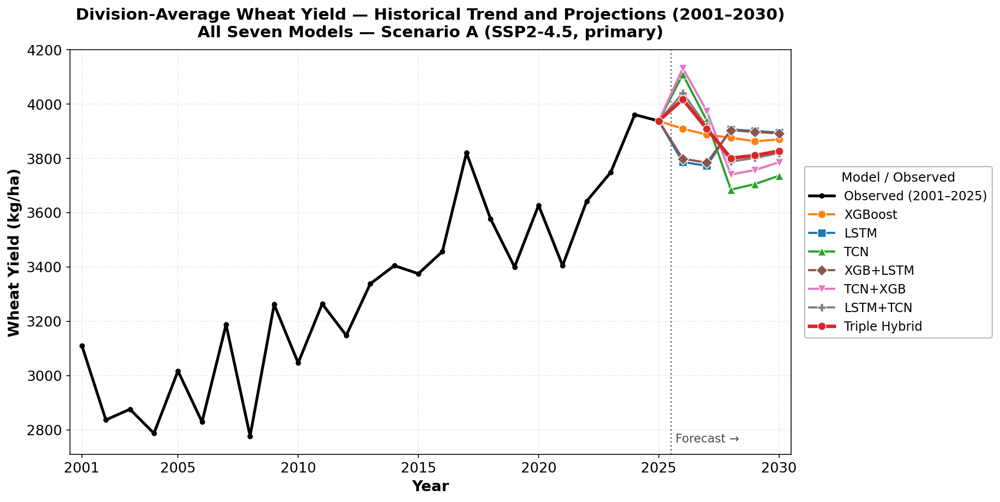

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ScenA_Historical_Forecast_Solid.png


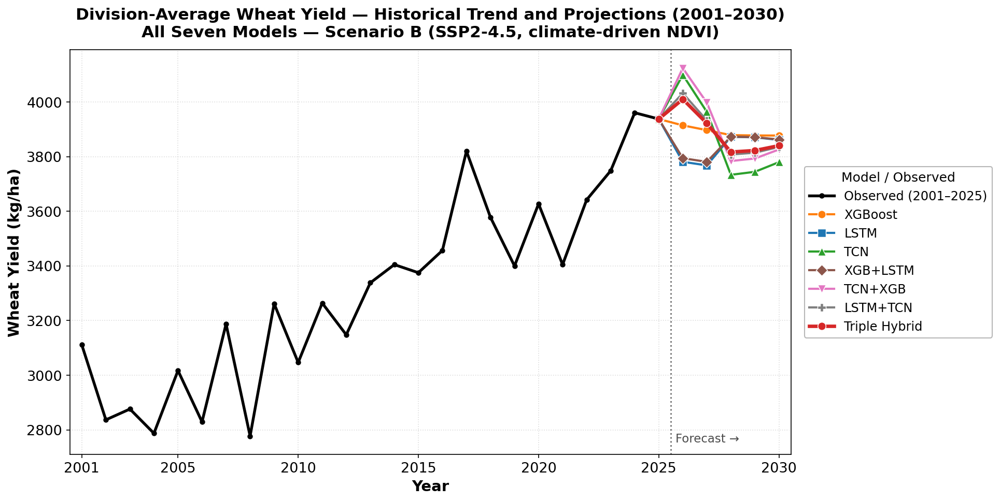

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ScenB_Historical_Forecast_Solid.png


In [ ]:
# ============================================================
# HISTORICAL + FORECAST PLOTS (SOLID LINES) — Scenario A & B
# Black = observed division average (2001–2025); colored = model forecasts
# ============================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

OUT  = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'
CONV = 40 / 0.4047   # maund/acre -> kg/ha (applied only if data not already converted)

MODEL_COLS = {
    'XGBoost':'XGB','LSTM':'LSTM','TCN':'TCN','XGB+LSTM':'SERWI_XGB_LSTM',
    'TCN+XGB':'SERWI_TCN_XGB','LSTM+TCN':'SERWI_LSTM_TCN','Triple Hybrid':'SERWI_Triple'
}
cols   = list(MODEL_COLS.values())
fyears = [2026, 2027, 2028, 2029, 2030]

# color + marker per model — ALL LINES SOLID
STYLE = {
    'XGBoost':('#ff7f0e','o',2.0), 'LSTM':('#1f77b4','s',2.0),
    'TCN':('#2ca02c','^',2.0),     'XGB+LSTM':('#8c564b','D',2.0),
    'TCN+XGB':('#e377c2','v',2.0), 'LSTM+TCN':('#7f7f7f','P',2.0),
    'Triple Hybrid':('#d62728','o',3.2),   # emphasized
}

def to_kgha(s): return s * CONV if s.mean() < 200 else s

# ── observed division average, 2001–2025 ──────────────────────
if 'Yield_kg_ha' in merged_df.columns:
    hist = merged_df.groupby('Year')['Yield_kg_ha'].mean()
else:
    hist = merged_df.groupby('Year')['Yield_maund_acre'].mean() * CONV
hist = hist.sort_index()
hist_years = hist.index.tolist()
obs_2025   = hist.loc[2025]

def div_avg(df, token):
    d = df.copy()
    if 'Scenario' in d.columns:
        k = d['Scenario'].astype(str).str.replace(' ', '', regex=False).str.lower()
        s = d[k.str.contains(token)]
        if len(s): d = s
    d = d[d['Year'].isin(fyears)]
    g = d.groupby('Year')[cols].mean()
    for c in cols: g[c] = to_kgha(g[c])
    return g.reindex(fyears)

divA = div_avg(forecast_scenA, 'scenarioa')
divB = div_avg(scen_b_df,      'scenariob')

def plot(div, label, save):
    fig, ax = plt.subplots(figsize=(13, 6.6))

    # observed historical (solid black)
    ax.plot(hist_years, hist.values, color='black', lw=2.6, marker='o', ms=4,
            label='Observed (2001–2025)', zorder=6)

    # forecasts — each connects from the 2025 observed point, all solid
    for name, col in MODEL_COLS.items():
        c, mk, lw = STYLE[name]
        xs = [2025] + fyears
        ys = [obs_2025] + div[col].tolist()
        ax.plot(xs, ys, color=c, ls='-', lw=lw, marker=mk, ms=7.5,
                markeredgecolor='white', markeredgewidth=0.7, label=name,
                zorder=8 if name == 'Triple Hybrid' else 4)

    # forecast boundary
    ax.axvline(2025.5, color='black', lw=1.4, ls=':', alpha=0.55)
    ax.text(2025.7, 0.03, 'Forecast →', transform=ax.get_xaxis_transform(),
            fontsize=11, alpha=0.7)

    ax.set_title('Division-Average Wheat Yield — Historical Trend and Projections '
                 '(2001–2030)\nAll Seven Models — ' + label,
                 fontsize=15, fontweight='bold', pad=12)
    ax.set_xlabel('Year', fontsize=14, fontweight='bold')
    ax.set_ylabel('Wheat Yield (kg/ha)', fontsize=14, fontweight='bold')
    ax.set_xlim(2000.5, 2030.5)
    ax.set_xticks([2001, 2005, 2010, 2015, 2020, 2025, 2030])
    ax.tick_params(axis='both', labelsize=13)     # readable axis values
    ax.grid(True, ls=':', alpha=0.45)
    ax.legend(fontsize=11.5, title='Model / Observed', title_fontsize=12,
              loc='center left', bbox_to_anchor=(1.01, 0.5),
              framealpha=0.95, edgecolor='0.7')

    plt.tight_layout()
    fig.savefig(OUT + save, dpi=300, bbox_inches='tight')
    plt.show()
    print('Saved →', OUT + save)

plot(divA, 'Scenario A (SSP2-4.5, primary)',            'Fig_ScenA_Historical_Forecast_Solid.png')
plot(divB, 'Scenario B (SSP2-4.5, climate-driven NDVI)', 'Fig_ScenB_Historical_Forecast_Solid.png')

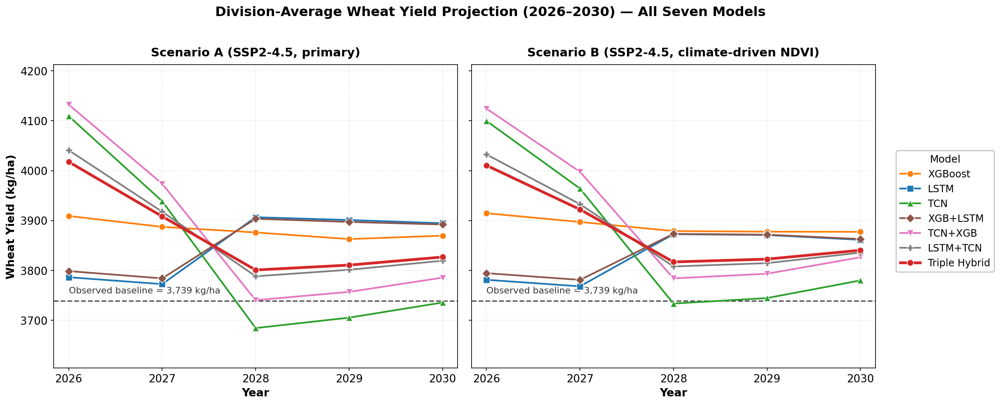

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ScenA_ScenB_SideBySide.png


In [ ]:
# ============================================================
# SIDE-BY-SIDE FORECAST PLOTS (solid lines, no history)
# Left = Scenario A, Right = Scenario B
# ============================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

OUT  = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'
CONV = 40 / 0.4047   # maund/acre -> kg/ha (applied only if not already converted)

MODEL_COLS = {
    'XGBoost':'XGB','LSTM':'LSTM','TCN':'TCN','XGB+LSTM':'SERWI_XGB_LSTM',
    'TCN+XGB':'SERWI_TCN_XGB','LSTM+TCN':'SERWI_LSTM_TCN','Triple Hybrid':'SERWI_Triple'
}
cols   = list(MODEL_COLS.values())
fyears = [2026, 2027, 2028, 2029, 2030]

# color + marker per model — ALL LINES SOLID
STYLE = {
    'XGBoost':('#ff7f0e','o',2.0), 'LSTM':('#1f77b4','s',2.0),
    'TCN':('#2ca02c','^',2.0),     'XGB+LSTM':('#8c564b','D',2.0),
    'TCN+XGB':('#e377c2','v',2.0), 'LSTM+TCN':('#7f7f7f','P',2.0),
    'Triple Hybrid':('#d62728','o',3.2),
}

BASELINE = 3739   # observed 2021–2025 division mean (kg/ha)

def to_kgha(s): return s * CONV if s.mean() < 200 else s

def div_avg(df, token):
    d = df.copy()
    if 'Scenario' in d.columns:
        k = d['Scenario'].astype(str).str.replace(' ', '', regex=False).str.lower()
        s = d[k.str.contains(token)]
        if len(s): d = s
    d = d[d['Year'].isin(fyears)]
    g = d.groupby('Year')[cols].mean()
    for c in cols: g[c] = to_kgha(g[c])
    return g.reindex(fyears)

divA = div_avg(forecast_scenA, 'scenarioa')
divB = div_avg(scen_b_df,      'scenariob')

# shared y-limits so both panels are directly comparable
allvals = np.concatenate([divA.values.ravel(), divB.values.ravel(), [BASELINE]])
ymin, ymax = allvals.min() - 80, allvals.max() + 80

fig, axes = plt.subplots(1, 2, figsize=(16, 6.4), sharey=True)

def draw(ax, div, subtitle):
    ax.axhline(BASELINE, color='black', lw=1.5, ls='--', alpha=0.7, zorder=1)
    ax.text(fyears[0], BASELINE + 12, f'Observed baseline = {BASELINE:,} kg/ha',
            fontsize=10.5, alpha=0.8, va='bottom')
    for name, col in MODEL_COLS.items():
        c, mk, lw = STYLE[name]
        ax.plot(fyears, div[col].values, color=c, ls='-', lw=lw, marker=mk, ms=7.5,
                markeredgecolor='white', markeredgewidth=0.7, label=name,
                zorder=8 if name == 'Triple Hybrid' else 4)
    ax.set_title(subtitle, fontsize=14, fontweight='bold', pad=10)
    ax.set_xlabel('Year', fontsize=13, fontweight='bold')
    ax.set_xticks(fyears)
    ax.tick_params(axis='both', labelsize=12.5)
    ax.grid(True, ls=':', alpha=0.45)
    ax.margins(x=0.04)

draw(axes[0], divA, 'Scenario A (SSP2-4.5, primary)')
draw(axes[1], divB, 'Scenario B (SSP2-4.5, climate-driven NDVI)')

axes[0].set_ylabel('Wheat Yield (kg/ha)', fontsize=13, fontweight='bold')
axes[0].set_ylim(ymin, ymax)

# one shared legend on the far right
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Model', title_fontsize=12, fontsize=11.5,
           loc='center left', bbox_to_anchor=(0.905, 0.5),
           framealpha=0.95, edgecolor='0.7')

fig.suptitle('Division-Average Wheat Yield Projection (2026–2030) — All Seven Models',
             fontsize=15.5, fontweight='bold', y=1.02)

plt.tight_layout(rect=[0, 0, 0.9, 1])   # leave room for the legend
fig.savefig(OUT + 'Fig_ScenA_ScenB_SideBySide.png', dpi=300, bbox_inches='tight')
plt.show()
print('Saved →', OUT + 'Fig_ScenA_ScenB_SideBySide.png')

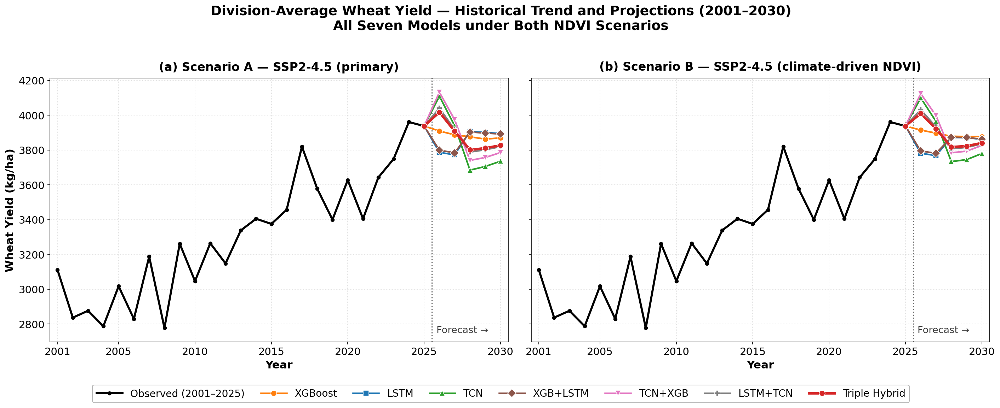

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ScenAB_Historical_Forecast_TwoPanel.png


In [ ]:
# ============================================================
# MERGED: Historical + Forecast — Scenario A | Scenario B (two panels)
# Black = observed division average (2001–2025); colored = model forecasts
# ============================================================
import numpy as np, pandas as pd, matplotlib.pyplot as plt

OUT  = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'
CONV = 40 / 0.4047   # maund/acre -> kg/ha (applied only if data not already converted)

MODEL_COLS = {
    'XGBoost':'XGB','LSTM':'LSTM','TCN':'TCN','XGB+LSTM':'SERWI_XGB_LSTM',
    'TCN+XGB':'SERWI_TCN_XGB','LSTM+TCN':'SERWI_LSTM_TCN','Triple Hybrid':'SERWI_Triple'
}
cols   = list(MODEL_COLS.values())
fyears = [2026, 2027, 2028, 2029, 2030]

STYLE = {
    'XGBoost':('#ff7f0e','o',2.2), 'LSTM':('#1f77b4','s',2.2),
    'TCN':('#2ca02c','^',2.2),     'XGB+LSTM':('#8c564b','D',2.2),
    'TCN+XGB':('#e377c2','v',2.2), 'LSTM+TCN':('#7f7f7f','P',2.2),
    'Triple Hybrid':('#d62728','o',3.4),   # emphasized
}

def to_kgha(s): return s * CONV if s.mean() < 200 else s

# ── observed division average, 2001–2025 ──────────────────────
if 'Yield_kg_ha' in merged_df.columns:
    hist = merged_df.groupby('Year')['Yield_kg_ha'].mean()
else:
    hist = merged_df.groupby('Year')['Yield_maund_acre'].mean() * CONV
hist = hist.sort_index()
hist_years = hist.index.tolist()
obs_2025   = hist.loc[2025]

def div_avg(df, token):
    d = df.copy()
    if 'Scenario' in d.columns:
        k = d['Scenario'].astype(str).str.replace(' ', '', regex=False).str.lower()
        s = d[k.str.contains(token)]
        if len(s): d = s
    d = d[d['Year'].isin(fyears)]
    g = d.groupby('Year')[cols].mean()
    for c in cols: g[c] = to_kgha(g[c])
    return g.reindex(fyears)

divA = div_avg(forecast_scenA, 'scenarioa')
divB = div_avg(scen_b_df,      'scenariob')

# ── shared y-limits so the two panels are directly comparable ──
all_vals = np.concatenate([hist.values, divA[cols].values.ravel(), divB[cols].values.ravel()])
lo, hi   = all_vals.min(), all_vals.max()
pad      = 0.06 * (hi - lo)
YLIM     = (lo - pad, hi + pad)

fig, axes = plt.subplots(1, 2, figsize=(19, 7.2), sharey=True)

panels = [(axes[0], divA, '(a) Scenario A — SSP2-4.5 (primary)'),
          (axes[1], divB, '(b) Scenario B — SSP2-4.5 (climate-driven NDVI)')]

for ax, div, subtitle in panels:
    # observed historical (solid black)
    ax.plot(hist_years, hist.values, color='black', lw=2.8, marker='o', ms=4.5,
            label='Observed (2001–2025)', zorder=6)

    # forecasts — each connects from the 2025 observed point
    for name, col in MODEL_COLS.items():
        c, mk, lw = STYLE[name]
        xs = [2025] + fyears
        ys = [obs_2025] + div[col].tolist()
        ax.plot(xs, ys, color=c, ls='-', lw=lw, marker=mk, ms=8,
                markeredgecolor='white', markeredgewidth=0.8, label=name,
                zorder=8 if name == 'Triple Hybrid' else 4)

    # forecast boundary
    ax.axvline(2025.5, color='black', lw=1.5, ls=':', alpha=0.6)
    ax.text(2025.8, 0.035, 'Forecast →', transform=ax.get_xaxis_transform(),
            fontsize=13, alpha=0.75)

    ax.set_title(subtitle, fontsize=16, fontweight='bold', pad=10)
    ax.set_xlabel('Year', fontsize=15, fontweight='bold')
    ax.set_xlim(2000.5, 2030.5)
    ax.set_ylim(*YLIM)
    ax.set_xticks([2001, 2005, 2010, 2015, 2020, 2025, 2030])
    ax.tick_params(axis='both', labelsize=14)
    ax.grid(True, ls=':', alpha=0.45)

axes[0].set_ylabel('Wheat Yield (kg/ha)', fontsize=15, fontweight='bold')

fig.suptitle('Division-Average Wheat Yield — Historical Trend and Projections (2001–2030)\n'
             'All Seven Models under Both NDVI Scenarios',
             fontsize=18, fontweight='bold', y=1.00)

# ── one shared legend below both panels ──
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=8, fontsize=13.5,
           frameon=True, framealpha=0.95, edgecolor='0.7',
           bbox_to_anchor=(0.5, -0.055), handlelength=2.6, columnspacing=1.6)

plt.tight_layout(rect=[0, 0.02, 1, 0.97])
fig.savefig(OUT + 'Fig_ScenAB_Historical_Forecast_Two0Panel.png',
            dpi=300, bbox_inches='tight')
plt.show()
print('Saved →', OUT + 'Fig_ScenAB_Historical_Forecast_TwoPanel.png')

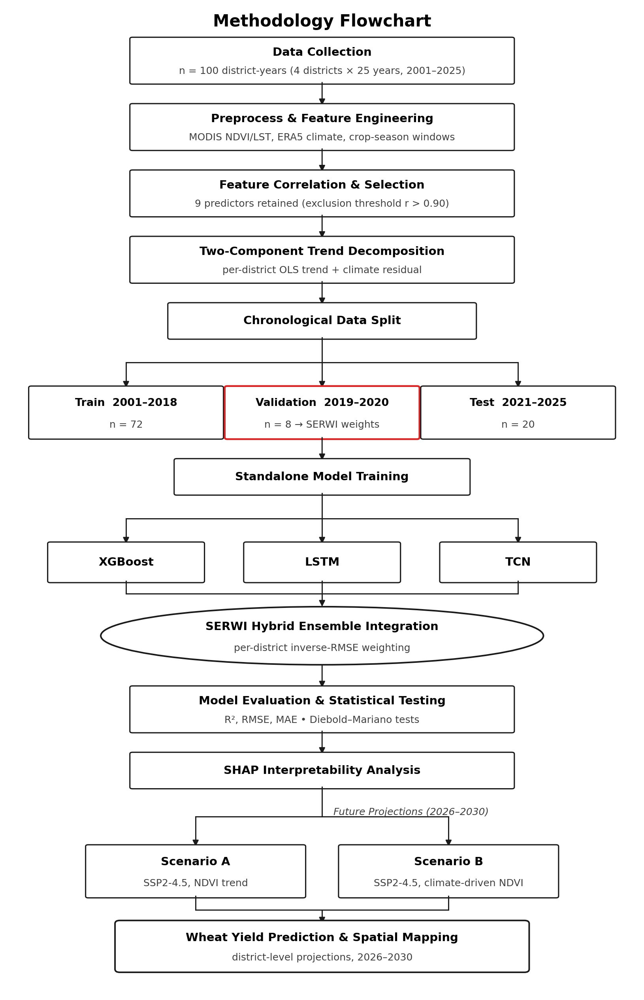

✓ Flowchart saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Methodology_Flowchart_v3.png


In [ ]:
# ============================================================
# METHODOLOGY FLOWCHART (editable text, compact boxes)
# ============================================================
import matplotlib.pyplot as plt
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Ellipse

OUT = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'

# ── FONT SIZES (tune here) ────────────────────────────────────
FS_TITLE = 20
FS_BOX   = 14      # bold label inside boxes
FS_SMALL = 12      # sub-text inside boxes  (was too small before)

# ── EDIT ALL TEXT HERE ────────────────────────────────────────
TITLE = 'Methodology Flowchart'

MAIN = [
    ('Data Collection',
     'n = 100 district-years (4 districts × 25 years, 2001–2025)'),
    ('Preprocess & Feature Engineering',
     'MODIS NDVI/LST, ERA5 climate, crop-season windows'),
    ('Feature Correlation & Selection',
     '9 predictors retained (exclusion threshold r > 0.90)'),
    ('Two-Component Trend Decomposition',
     'per-district OLS trend + climate residual'),
    ('Chronological Data Split', None),
]

SPLITS = [('Train  2001–2018', 'n = 72'),
          ('Validation  2019–2020', 'n = 8 → SERWI weights'),
          ('Test  2021–2025', 'n = 20')]

MODELS = ['XGBoost', 'LSTM', 'TCN']

ENSEMBLE, ENS_SUB = 'SERWI Hybrid Ensemble Integration', 'per-district inverse-RMSE weighting'

MID = [('Model Evaluation & Statistical Testing', 'R², RMSE, MAE • Diebold–Mariano tests'),
       ('SHAP Interpretability Analysis', None)]

SCEN_LABEL = 'Future Projections (2026–2030)'
SCENARIOS  = [('Scenario A', 'SSP2-4.5, NDVI trend'),
              ('Scenario B', 'SSP2-4.5, climate-driven NDVI')]

END = ('Wheat Yield Prediction & Spatial Mapping', 'district-level projections, 2026–2030')

# ── styling ───────────────────────────────────────────────────
EDGE, FACE, LW, ACC = '#1a1a1a', 'white', 1.5, '#d62728'
W_MAIN, H2, H1 = 60, 10.5, 8      # main width, two-line height, one-line height
GAP = 5.5                          # vertical gap between stages

fig, ax = plt.subplots(figsize=(11, 17))
ax.set_xlim(0, 100); ax.axis('off')

def box(cx, cy, w, h, main, sub=None, edge=EDGE, lw=LW, fs=FS_BOX, pad=0.4):
    ax.add_patch(FancyBboxPatch((cx-w/2, cy-h/2), w, h,
                                boxstyle=f'round,pad={pad}',
                                facecolor=FACE, edgecolor=edge, linewidth=lw))
    if sub:
        ax.text(cx, cy+h*0.19, main, ha='center', va='center',
                fontsize=fs, fontweight='bold')
        ax.text(cx, cy-h*0.24, sub, ha='center', va='center',
                fontsize=FS_SMALL, color='0.25')
    else:
        ax.text(cx, cy, main, ha='center', va='center', fontsize=fs, fontweight='bold')

def arrow(x, y1, y2):
    ax.add_patch(FancyArrowPatch((x, y1), (x, y2), arrowstyle='-|>',
                                 mutation_scale=15, linewidth=1.4,
                                 color=EDGE, shrinkA=0, shrinkB=0))

def fan_out(y_from, y_to, xs, x_from=50):
    """parent bottom -> horizontal bus -> arrows into each child top"""
    ybus = (y_from + y_to) / 2
    ax.plot([x_from, x_from], [y_from, ybus], color=EDGE, lw=1.4)
    ax.plot([min(xs), max(xs)], [ybus, ybus], color=EDGE, lw=1.4)
    for x in xs:
        ax.plot([x, x], [ybus, y_to+1.2], color=EDGE, lw=1.4)
        arrow(x, y_to+1.2, y_to)

def fan_in(y_from, y_to, xs, x_to=50):
    """children bottoms -> horizontal bus -> single arrow into target top"""
    ybus = (y_from + y_to) / 2
    for x in xs:
        ax.plot([x, x], [y_from, ybus], color=EDGE, lw=1.4)
    ax.plot([min(xs), max(xs)], [ybus, ybus], color=EDGE, lw=1.4)
    ax.plot([x_to, x_to], [ybus, y_to+1.2], color=EDGE, lw=1.4)
    arrow(x_to, y_to+1.2, y_to)

y = 0.0                      # running cursor (top of current stage), grows downward
def place(main, sub, w=W_MAIN, **kw):
    """place a centred box below the cursor; returns (top, bottom)"""
    global y
    h = H2 if sub else H1
    cy = y - h/2
    box(50, cy, w, h, main, sub, **kw)
    y = cy - h/2
    return cy + h/2, cy - h/2

# ---- main pipeline ----
for i, (m, s) in enumerate(MAIN):
    if i: y -= GAP; arrow(50, y+GAP, y)
    place(m, s, w=(48 if s is None else W_MAIN))

# ---- three-way split ----
xs3 = [19, 50, 81]
y_top = y - GAP*2.2
fan_out(y, y_top, xs3)
for x, (lbl, sub) in zip(xs3, SPLITS):
    hl = lbl.startswith('Validation')
    box(x, y_top-6, 30, 12, lbl, sub,
        edge=(ACC if hl else EDGE), lw=(2.2 if hl else LW), fs=13)
y = y_top - 12

# ---- standalone training ----
y -= GAP; arrow(50, y+GAP, y)
place('Standalone Model Training', None, w=46)

# ---- three models ----
y_top = y - GAP*2.2
fan_out(y, y_top, xs3)
for x, m in zip(xs3, MODELS):
    box(x, y_top-4.5, 24, 9, m)
y = y_top - 9

# ---- ensemble ellipse ----
y_e = y - GAP*2.4
fan_in(y, y_e+7, xs3)
ax.add_patch(Ellipse((50, y_e), 70, 14, facecolor=FACE, edgecolor=EDGE, linewidth=1.9))
ax.text(50, y_e+2.2, ENSEMBLE, ha='center', va='center', fontsize=FS_BOX, fontweight='bold')
ax.text(50, y_e-3.0, ENS_SUB, ha='center', va='center', fontsize=FS_SMALL, color='0.25')
y = y_e - 7

# ---- evaluation + SHAP ----
for m, s in MID:
    y -= GAP; arrow(50, y+GAP, y)
    place(m, s)

# ---- two-scenario branch ----
xs2 = [30, 70]
y_top = y - GAP*2.6
ax.text(51.8, y - GAP*1.1, SCEN_LABEL, ha='left', va='center',
        fontsize=FS_SMALL, style='italic', color='0.25')
fan_out(y, y_top, xs2)
for x, (lbl, sub) in zip(xs2, SCENARIOS):
    box(x, y_top-6, 34, 12, lbl, sub)
y = y_top - 12

# ---- terminal ----
y_end = y - GAP*2.2
fan_in(y, y_end+5.5, xs2)
box(50, y_end, 64, 11, END[0], END[1], lw=1.9, pad=0.75)
y = y_end - 5.5

ax.set_ylim(y - 6, 8)
ax.text(50, 3, TITLE, ha='center', fontsize=FS_TITLE, fontweight='bold')

plt.tight_layout()
fig.savefig(OUT + 'Fig_Methodology_Flowchart_v3.png', dpi=300, bbox_inches='tight')
plt.show()
print('✓ Flowchart saved →', OUT + 'Fig_Methodology_Flowchart_v3.png')